In [1]:
import sys
sys.path.insert(0, '/home/tchari/monod/src/')

In [2]:
# import monod
# from monod import preprocess, extract_data, cme_toolbox, inference, analysis

import monod
from monod.preprocess import *
from monod.extract_data import extract_data
import monod.cme_toolbox as cme_toolbox
from monod.cme_toolbox import CMEModel
import monod.inference as inference
from monod.inference import InferenceParameters, GradientInference
import monod.analysis as analysis
from monod.analysis import *


In [3]:
import pandas as pd
import numpy as np
import loompy as lp
import matplotlib.pyplot as plt
import scipy
import seaborn as sns
import scipy.stats
import anndata
import os
import scipy.io as sio
import anndata

In [4]:
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

## **Read in data and metadata**

See fetch_hca_new.sh/fetch_hca_t19.sh, count_hca_new.sh,count_hca_t19.sh files for processing of raw fastqs into count matrices (with kb-python). We will read in the loom files and sum the 'spliced' and 'ambiguous' count matrices, filtering for the cell barcodes annotated per condition/cell type in the original study.

In [5]:
meta_path = "/home/tchari/counts/monod_rev_HCA/"
meta = anndata.read_h5ad(meta_path+'GSE202051_totaldata-final-toshare.h5ad')
meta

AnnData object with n_obs × n_vars = 224988 × 22164
    obs: 'sampleid', 'n_genes', 'n_counts', 'scrublet_scores', 'pid', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'n_counts_sat', 'n_genes_sat', 'percent_mito', 'leiden', 'batch', 'Moffitt_basal', 'Moffitt_classical', 'Bailey_squamous', 'Bailey_progenitor', 'Collison_QM', 'Collison_classical', 'MALIGNANT CELLS', 'ACINAR', 'Alpha', 'Beta', 'Delta', 'Gamma', 'Episilon', 'ENDOCRINE', 'ENDOTHELIAL', 'Pan_Immune', 'AntigenPresentingCells', 'Monocytes_1', 'Monocytes_2', 'Macrophage', 'cDC1', 'cDC2', 'DC_activated', 'pDC', 'Mast', 'Eosinophils', 'Neutrophils', 'M0', 'M1', 'M2', 'Mast_Resting', 'Mast_activated', 'CD8_Tcells', 'CD4_Tcells', 'NK', 'CD8_gammadelta', 'CD8_exhausted', 'CD4_naive', 'CD4_memory_resting', 'CD4_memory_activated', 'CD4_follicular_helper', 'CD4_regulatory', 'NK_resting', 'NK_activated', 'B_cell', 'Plasma', 'Bcell_naive', 'Bcell_memory', 'IMMUNE', 'PanCAF', 'iCAF', 'myCAF', 'apCA

In [6]:
np.unique(meta.obs['pid'][meta.obs['new_treatment'].isin(['CRTl'])])

array(['T15', 'T16', 'T17', 'T18', 'T19'], dtype=object)

In [25]:
meta.obs['Level 2 Annotation'][meta.obs['pid'].isin(['T15'])].value_counts() #T17*,T16-->T19,T18 (not T1,3,6,8,  10,11,12,13,15,19)

Level 2 Annotation
CAF                                1233
Ductal                              747
Ductal (atypical)                   606
Gamma                               245
Vascular                            202
Macrophage                          199
CD8+ T                              103
myCAF                                71
Pericyte                             52
Schwann                              49
Acinar                               45
Malignant                            39
Dendritic                            39
Beta                                 37
Natural killer                       30
Mast                                 20
CD4+ T                               19
Treg                                 18
Delta                                17
ADM                                  14
Vascular smooth muscle               12
B                                    11
Alpha                                 9
Lymphatic                             4
Neutrophil           

In [8]:
np.unique(meta.obs['pid'][meta.obs['new_treatment'].isin(['CRT'])])

array(['T1', 'T10', 'T11', 'T12', 'T13', 'T14', 'T2', 'T3', 'T4', 'T5',
       'T6', 'T7', 'T8', 'T9'], dtype=object)

In [9]:
meta.obs['Level 2 Annotation'][meta.obs['pid'].isin(['T1'])].value_counts() #,T14*, (not T1,3,6,8, 5,7 10,11,12,13,15,19)

Level 2 Annotation
Ductal                             620
Malignant                          609
Gamma                              484
CD8+ T                             419
Vascular                           194
CAF                                104
Macrophage                          62
Schwann                             29
Lymphatic                           28
Acinar                              24
Pericyte                            15
Ductal (atypical)                    7
Natural killer                       4
Dendritic                            3
Treg                                 3
B                                    2
Hormone-negative neuroendocrine      1
Plasma                               1
Beta                                 1
Mast                                 1
Alpha                                0
ADM                                  0
Epsilon                              0
Delta                                0
CD4+ T                               0
Adipoc

In [10]:
np.unique(meta.obs['pid'][meta.obs['new_treatment'].isin(['Untreated'])])

array(['U1', 'U10', 'U11', 'U12', 'U13', 'U14', 'U15', 'U16', 'U17',
       'U18', 'U2', 'U3', 'U4', 'U5', 'U6', 'U7', 'U8', 'U9'],
      dtype=object)

In [11]:
meta.obs['Level 2 Annotation'][meta.obs['pid'].isin(['U14'])].value_counts() #U1,U3,U4,U5*, U7, U12* ,U13* ,U15* (not 8,10,17,18)

Level 2 Annotation
Malignant                          3271
myCAF                               700
CAF                                 236
Vascular                            162
Pericyte                            115
Macrophage                           61
Beta                                 20
Lymphatic                            10
Schwann                               8
Dendritic                             7
Alpha                                 5
Delta                                 4
CD8+ T                                3
CD4+ T                                1
Epsilon                               0
Ductal (atypical)                     0
Ductal                                0
B                                     0
Acinar                                0
ADM                                   0
Adipocyte                             0
Gamma                                 0
Natural killer                        0
Mast                                  0
Hormone-negative neur

In [23]:
meta.obs['sampleid'][meta.obs['pid'].isin(['T19'])]

CGTTAGACATCAGCGC-1-42    MGH2381
AGAACCTAGCGACATG-1-42    MGH2381
TTCTAACTCATGTCAG-1-42    MGH2381
TGACAGTCAAGACCTT-1-42    MGH2381
ACTGCAACAAGACGGT-1-42    MGH2381
                          ...   
TGTGCGGCACCTGTCT-1-42    MGH2381
GGATCTAAGGCTAGCA-1-42    MGH2381
AGCATCACAAGATCCT-1-42    MGH2381
CTCAGAACAAGCTCTA-1-42    MGH2381
GGAGATGCAGTCTTCC-1-42    MGH2381
Name: sampleid, Length: 3521, dtype: category
Categories (44, object): ['003', '004', '007', '008', ..., 'MGHR9', 'MGHR11', 'MGHR16', 'MGHR17']

In [ ]:
#Fastqs SRR

#U5( Done)
#U12 SRR19039368
#U14 SRR19039352

#T12 SRR19039325 , SRR19039324
#T1 SRR19039344, SRR19039343
#T14 SRR19039320 , SRR19039319

#T17 SRR19039315
#T16 (Done) --> T19 SRR19039313,SRR19039314
#T18 (Done)


In [26]:
#List of sample ids run through kb-python, cover the Untreated, CRT, and CRTl conditions
pids = ['U5','U12','U14','T1','T12','T14','T17','T18','T19'] #['U1','U5','T2','T4','T16','T18']

In [27]:
meta.obs['new_treatment'][meta.obs['pid'].isin(['U5'])]

GTGCTTCCATAAGATG-1-14    Untreated
CGGAGAACACGAAGAC-1-14    Untreated
GTCAAGTAGATTAGTG-1-14    Untreated
AAGAACACAACCTAAC-1-14    Untreated
TTGTTCAGTGACTGTT-1-14    Untreated
                           ...    
AGCGTCGGTTCGGTAT-1-14    Untreated
GTCGTAAGTTGTCATG-1-14    Untreated
GGGTTTATCGTAGTCA-1-14    Untreated
ACATCGAGTTGTTGAC-1-14    Untreated
AGAAGCGTCGCCTATC-1-14    Untreated
Name: new_treatment, Length: 6650, dtype: category
Categories (4, object): ['CRT', 'CRTl', 'Other', 'Untreated']

In [28]:
#For each PID find cell types with enough cells
pid_types_lev2 = []
pid_types_lev3 = []
sums = []
for p in pids:
    sub = meta[meta.obs['pid'].isin([p])]
    lev2_types = sub.obs['Level 2 Annotation']
    lev3_types = sub.obs['Level 3 Annotation']
    for c2 in np.unique(lev2_types):
        if np.sum(lev2_types.isin([c2])) > 50:
            pid_types_lev2 += [p+'_'+c2]
            #sums += [np.sum(lev2_types.isin([c2]))]

    for c3 in np.unique(lev3_types):
        if np.sum(lev3_types.isin([c3])) > 50:
            pid_types_lev3 += [p+'_'+c3]
            sums += [np.sum(lev3_types.isin([c3]))]



In [30]:
for i in range(len(pid_types_lev2)):
    print(i,': ',pid_types_lev2[i])
#want 0-26,27,32,36,41,45,48,52,55,59,63,69,75

0 :  U5_B
1 :  U5_CAF
2 :  U5_CD4+ T
3 :  U5_CD8+ T
4 :  U5_Dendritic
5 :  U5_Gamma
6 :  U5_Lymphatic
7 :  U5_Macrophage
8 :  U5_Malignant
9 :  U5_Pericyte
10 :  U5_Treg
11 :  U5_Vascular
12 :  U12_CAF
13 :  U12_CD8+ T
14 :  U12_Macrophage
15 :  U12_Malignant
16 :  U12_Mast
17 :  U12_Pericyte
18 :  U12_Vascular
19 :  U12_Vascular smooth muscle
20 :  U12_myCAF
21 :  U14_CAF
22 :  U14_Macrophage
23 :  U14_Malignant
24 :  U14_Pericyte
25 :  U14_Vascular
26 :  U14_myCAF
27 :  T1_CAF
28 :  T1_CD8+ T
29 :  T1_Ductal
30 :  T1_Gamma
31 :  T1_Macrophage
32 :  T1_Malignant
33 :  T1_Vascular
34 :  T12_ADM
35 :  T12_Acinar
36 :  T12_CAF
37 :  T12_Ductal
38 :  T12_Ductal (atypical)
39 :  T12_Gamma
40 :  T12_Macrophage
41 :  T12_Malignant
42 :  T12_Pericyte
43 :  T12_Vascular
44 :  T14_Adipocyte
45 :  T14_CAF
46 :  T14_Lymphatic
47 :  T14_Macrophage
48 :  T14_Malignant
49 :  T14_Pericyte
50 :  T14_Vascular
51 :  T14_myCAF
52 :  T17_CAF
53 :  T17_CD8+ T
54 :  T17_Macrophage
55 :  T17_Malignant
56 :  

In [35]:
pid_types_lev2 = list(np.array(pid_types_lev2)[0:27])+list(np.array(pid_types_lev2)[[27,32,36,41,45,48,52,55,59,63,69,75]])

In [ ]:
### #subcluster_names = [[i.spli] for i in pid_types_lev2] #pid_types_lev2

#sub_names_only = ['_'.join(n) for n in subcluster_names]

cluster_names = []
dataset_names = ['HCA_'+y  for y in pid_types_lev2]   #To save
print('dataset_names: ', dataset_names)
print('len(dataset_names): ',len(dataset_names))
print()

transcriptome_filepath = '/home/tchari/perturbCME/notebooks/gg_200525_genome_polyA_cum_3' 

spliced_layer = 'spliced'
unspliced_layer = 'unspliced'
gene_attr = 'gene_name'
cell_attr = 'barcode'

attribute_names=[(unspliced_layer,spliced_layer),gene_attr,cell_attr]

loom_filepaths = ['/home/tchari/counts/monod_rev_HCA/'+x.split('_')[0]+'/counts_unfiltered/adata2.loom' for x in pid_types_lev2] 
print('loom_filepaths: ',loom_filepaths)

n_datasets = len(loom_filepaths)

In [41]:
#Save data with unspliced/spliced
for ls in np.unique(loom_filepaths):
    ls = ls.replace('adata2.loom','')
    mat = sio.mmread(ls+'cells_x_genes.mature.mtx')
    nas = sio.mmread(ls+'cells_x_genes.nascent.mtx')
    amb = sio.mmread(ls+'cells_x_genes.ambiguous.mtx')

    bars = pd.read_csv(ls+'cells_x_genes.barcodes.txt',header=None)
    gs = pd.read_csv(ls+'cells_x_genes.genes.names.txt',header=None)
    
    retAdata = anndata.AnnData(
			X=sparse.csr_matrix(mat+amb),
			layers={
				'spliced': sparse.csr_matrix(mat+amb),
				'unspliced': sparse.csr_matrix(nas),
			},
			obs=pd.DataFrame({'barcode': np.array(list(bars[0]))},index=np.array(list(bars[0]))),
			var=pd.DataFrame({'gene_name': np.array(list(gs[0]))},index=np.array(list(gs[0])))
		)

    retAdata.write_loom(ls+'adata2.loom')
    print(ls+'adata2.loom')

/home/tchari/counts/monod_rev_HCA/T1/counts_unfiltered/adata2.loom
/home/tchari/counts/monod_rev_HCA/T12/counts_unfiltered/adata2.loom
/home/tchari/counts/monod_rev_HCA/T14/counts_unfiltered/adata2.loom
/home/tchari/counts/monod_rev_HCA/T17/counts_unfiltered/adata2.loom
/home/tchari/counts/monod_rev_HCA/T18/counts_unfiltered/adata2.loom
/home/tchari/counts/monod_rev_HCA/T19/counts_unfiltered/adata2.loom
/home/tchari/counts/monod_rev_HCA/U12/counts_unfiltered/adata2.loom
/home/tchari/counts/monod_rev_HCA/U14/counts_unfiltered/adata2.loom
/home/tchari/counts/monod_rev_HCA/U5/counts_unfiltered/adata2.loom


## **Filter cell barcodes**

In [42]:
cf = []

#fig1,ax1 = plt.subplots(1,len(dataset_meta)*2,figsize=(15,5))

for k in range(len(pid_types_lev2)):
    filename = loom_filepaths[k]
    dataset_name = pid_types_lev2[k] #raw_data_locations[len(subcluster_names)*k]
    
    with lp.connect(filename,mode='r') as ds:
    
      
        gene_names = ds.ra[gene_attr]
        bcs = ds.ca[cell_attr]
     

        #if k==0:
        pid = dataset_name.split('_')[0]
        types = dataset_name.split('_')[1]

        sub = meta[meta.obs['pid'].isin([pid]) & meta.obs['Level 2 Annotation'].isin([types])]

        annot_bcs = list(sub.obs['pid'].index)
        annot_bcs = [i.split('-')[0] for i in annot_bcs]
        cf.append(np.isin(bcs,annot_bcs))
        print(f'\t{dataset_name}: {len(annot_bcs)} cells in annotations. {np.isin(bcs,annot_bcs).sum()} in loom.')



    #ax1[k].set_title(dataset_name)
    
# !mkdir ./figs    
# fig_dir = './figs/'
# fig_string = fig_dir + 'kneeplots_all_germ.png'
# fig1.tight_layout()
# plt.savefig(fig_string,dpi=450)

	U5_B: 333 cells in annotations. 333 in loom.
	U5_CAF: 2268 cells in annotations. 2268 in loom.
	U5_CD4+ T: 107 cells in annotations. 107 in loom.
	U5_CD8+ T: 467 cells in annotations. 467 in loom.
	U5_Dendritic: 179 cells in annotations. 179 in loom.
	U5_Gamma: 105 cells in annotations. 105 in loom.
	U5_Lymphatic: 58 cells in annotations. 58 in loom.
	U5_Macrophage: 388 cells in annotations. 388 in loom.
	U5_Malignant: 1068 cells in annotations. 1068 in loom.
	U5_Pericyte: 446 cells in annotations. 446 in loom.
	U5_Treg: 76 cells in annotations. 76 in loom.
	U5_Vascular: 975 cells in annotations. 975 in loom.
	U12_CAF: 1267 cells in annotations. 1267 in loom.
	U12_CD8+ T: 205 cells in annotations. 205 in loom.
	U12_Macrophage: 325 cells in annotations. 325 in loom.
	U12_Malignant: 3652 cells in annotations. 3652 in loom.
	U12_Mast: 69 cells in annotations. 69 in loom.
	U12_Pericyte: 205 cells in annotations. 205 in loom.
	U12_Vascular: 280 cells in annotations. 280 in loom.
	U12_Vascu

In [939]:
np.sum(cf[)

39

## **Gene Filtering**

In [43]:
import logging, sys
logging.basicConfig(stream=sys.stdout)
log = logging.getLogger()
log.setLevel(logging.INFO)

In [44]:

markers = ['IL2', 'CCL4','CCL5','TIGIT', 'TCF7', 'KLF2', 'LEF1','CFTR','KRT5', 'KRT19','KRT17',
           'NRXN3',
          'CNTN4', 'CTNND2', 'NRXN3', 'RELN', 'SEMA5A', 'NRCAM',
        'AUTS2','SEMA3E','RUNX1', 'RUNX2', 'LEF1', 'SALL4', 'WNT5A', 'NKD1',
           'FOXP1', 'CXCL12', 'CCL19', 'CCL21','CDH2']




INFO:root:Beginning data preprocessing and filtering.
INFO:root:Directory ./fits/gg_241105_029_HCA_MaligCAF_1 created.
INFO:root:Dataset: HCA_U5_B
INFO:root:333 cells detected.
INFO:root:36601 features observed, 36149 match genome annotations. 36149 were unique.
INFO:root:126 genes retained after expression filter.
INFO:root:Directory ./fits/gg_241105_029_HCA_MaligCAF_1/HCA_U5_B created.
INFO:root:Dataset: HCA_U5_CAF
INFO:root:2268 cells detected.
INFO:root:36601 features observed, 36149 match genome annotations. 36149 were unique.
INFO:root:1000 genes retained after expression filter.
INFO:root:Directory ./fits/gg_241105_029_HCA_MaligCAF_1/HCA_U5_CAF created.
INFO:root:Dataset: HCA_U5_CD4+ T
INFO:root:107 cells detected.
INFO:root:36601 features observed, 36149 match genome annotations. 36149 were unique.
INFO:root:5 genes retained after expression filter.
INFO:root:Directory ./fits/gg_241105_029_HCA_MaligCAF_1/HCA_U5_CD4+ T created.
INFO:root:Dataset: HCA_U5_CD8+ T
INFO:root:467 cell

/home/tchari/monod/src/monod/preprocess.py:193: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig1, ax1 = plt.subplots(nrows=1, ncols=2, figsize=(12, 4))


INFO:root:236 cells detected.
INFO:root:36601 features observed, 36149 match genome annotations. 36149 were unique.
INFO:root:139 genes retained after expression filter.
INFO:root:Directory ./fits/gg_241105_029_HCA_MaligCAF_1/HCA_U14_CAF created.
INFO:root:Dataset: HCA_U14_Macrophage
INFO:root:61 cells detected.
INFO:root:36601 features observed, 36149 match genome annotations. 36149 were unique.
INFO:root:69 genes retained after expression filter.
INFO:root:Directory ./fits/gg_241105_029_HCA_MaligCAF_1/HCA_U14_Macrophage created.
INFO:root:Dataset: HCA_U14_Malignant
INFO:root:3271 cells detected.
INFO:root:36601 features observed, 36149 match genome annotations. 36149 were unique.
INFO:root:1917 genes retained after expression filter.
INFO:root:Directory ./fits/gg_241105_029_HCA_MaligCAF_1/HCA_U14_Malignant created.
INFO:root:Dataset: HCA_U14_Pericyte
INFO:root:115 cells detected.
INFO:root:36601 features observed, 36149 match genome annotations. 36149 were unique.
INFO:root:110 genes

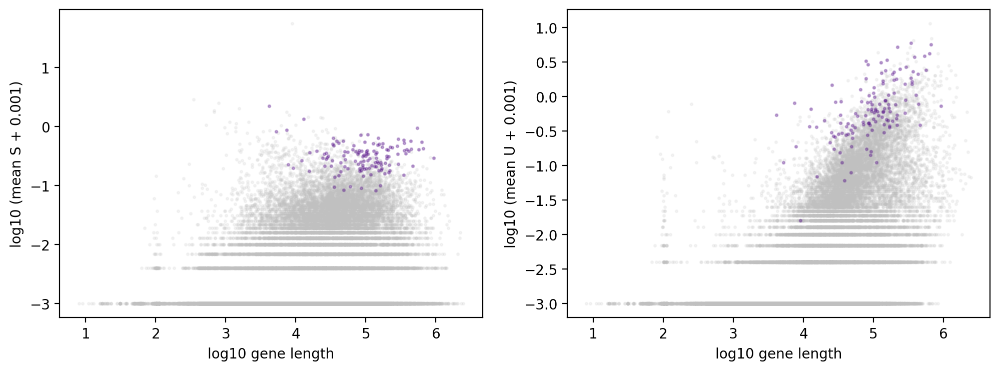

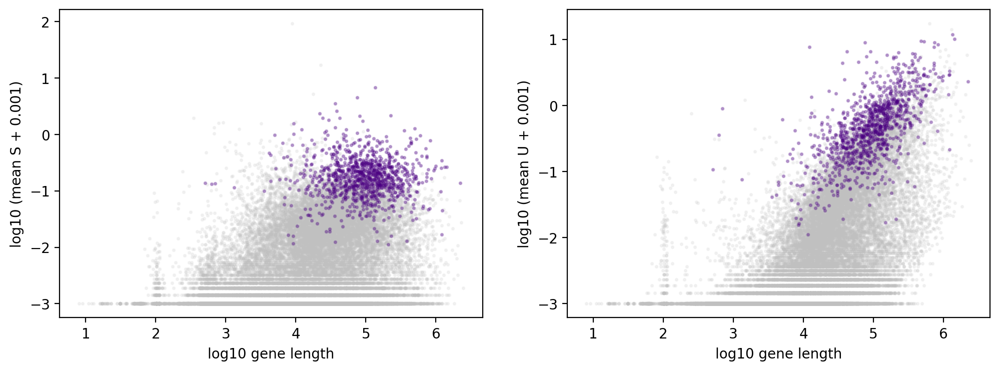

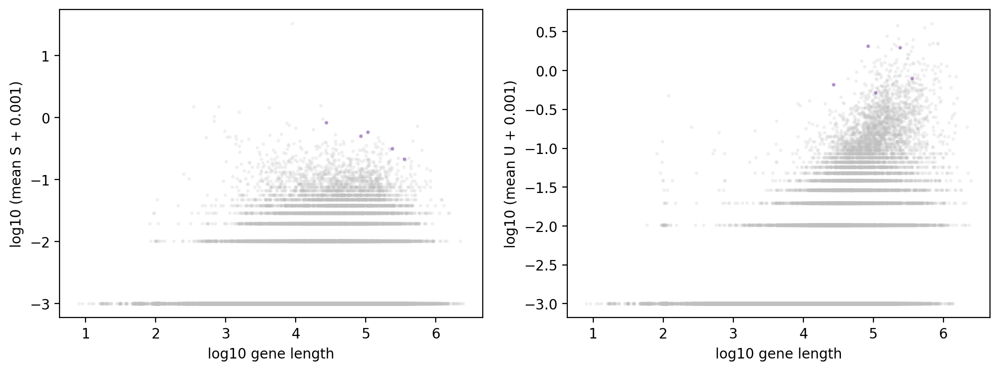

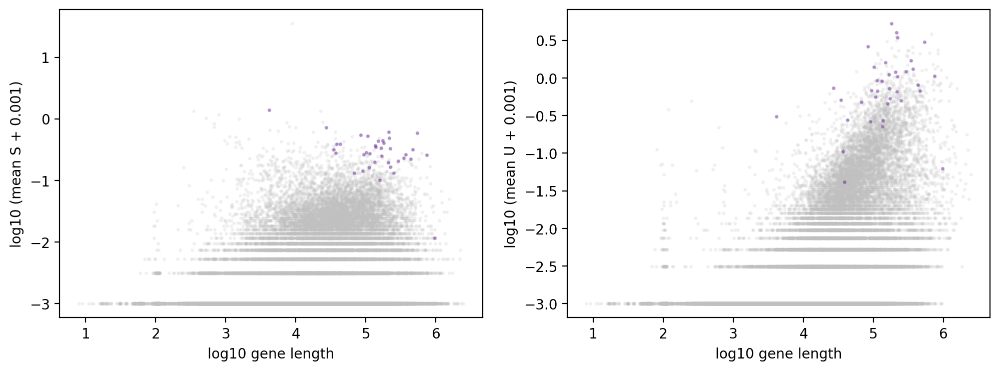

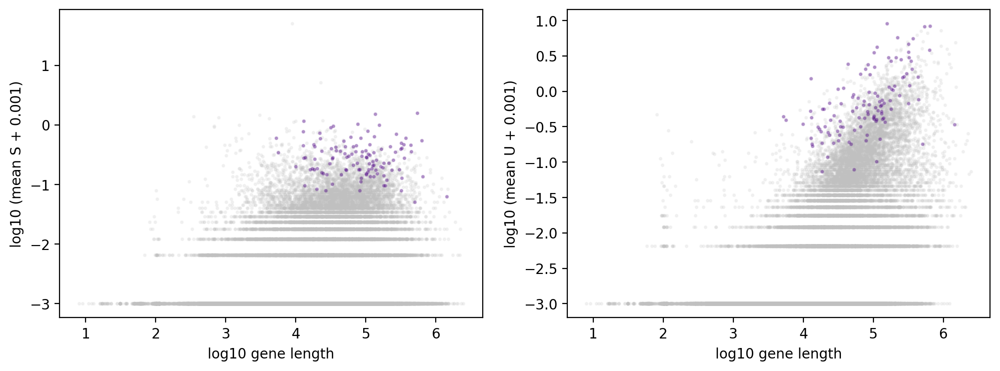

...

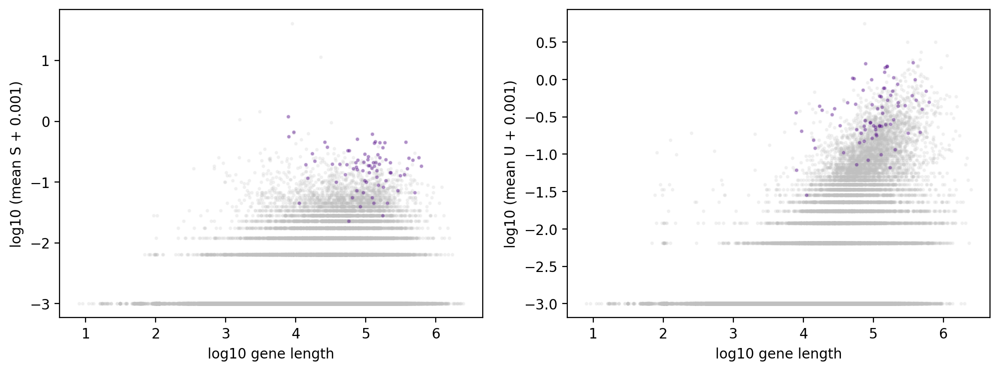

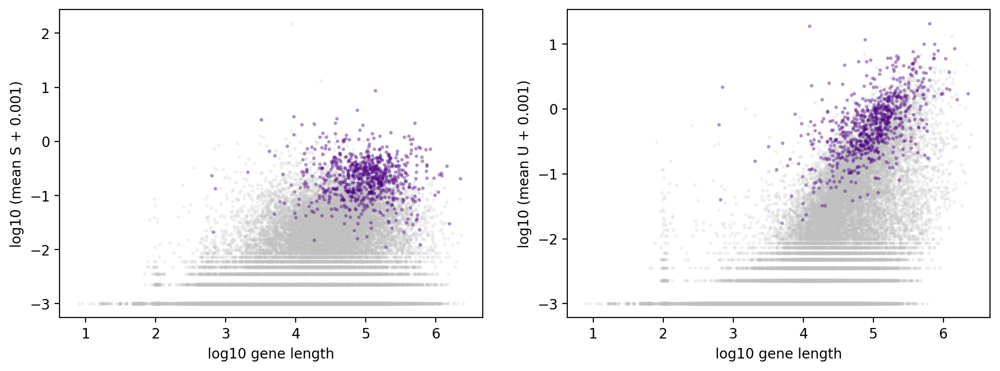

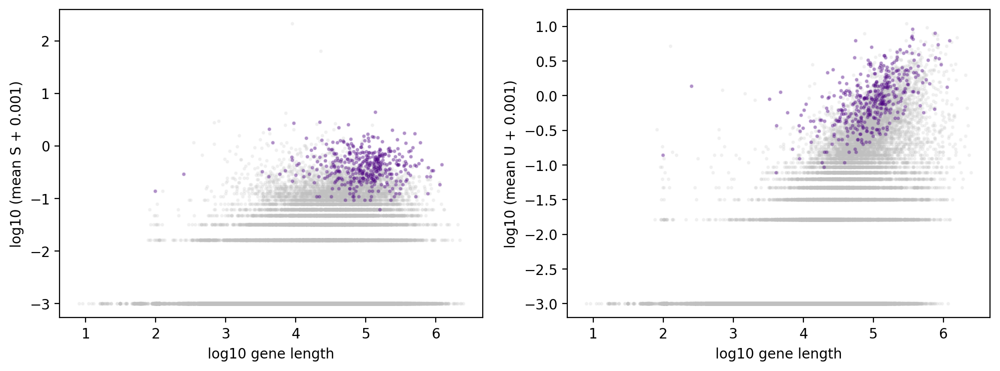

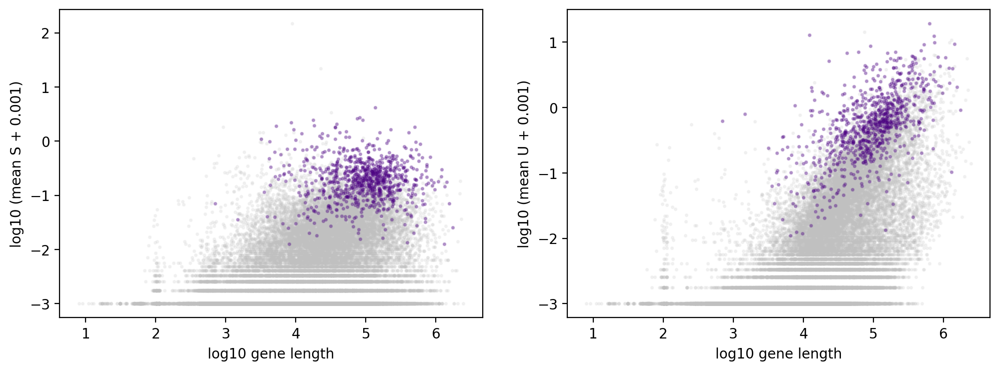

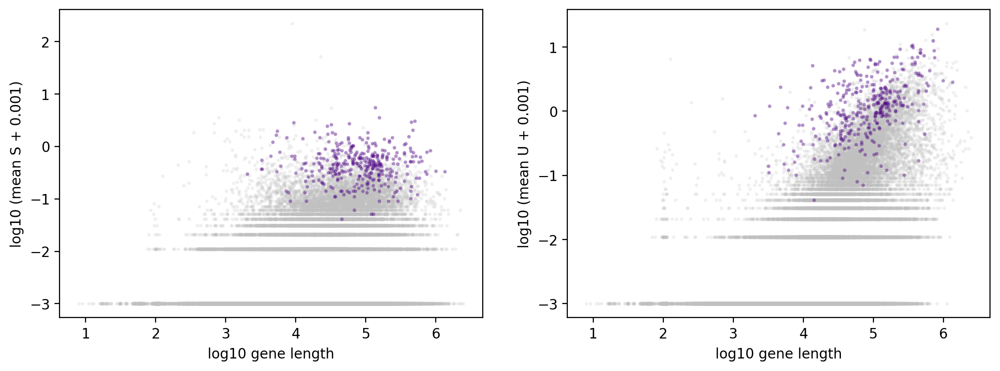

In [45]:
#Set the marker genes to be fit if possible
dir_string,dataset_strings = monod.preprocess.construct_batch(loom_filepaths, \
                                             transcriptome_filepath, \
                                             dataset_names, \
                                             attribute_names=attribute_names,\
                                             batch_location='./fits',meta='HCA_MaligCAF',batch_id=1,\
                                             n_genes=3000,exp_filter_threshold=None,cf=cf,genes_to_fit=markers)

In [46]:
dir_string = './fits/gg_241105_029_HCA_MaligCAF_1' #'./fits/gg_230303_025_germ_all_1'
dataset_strings = [dir_string+'/'+i for i in dataset_names]


In [ ]:
#Potentially bad/low quality conditions: 
#['HCA_U1_CD4+ T','HCA_U1_CD8+ T','HCA_U5_CD4+ T','HCA_U5_CD8+ T','HCA_T2_Alpha','HCA_T16_Adipocyte','HCA_T16_CD8+ T','HCA_T18_CD8+ T'

## **Run Monod Inference**

In [47]:
#Define bounds
phys_lb = [-2.0, -1.8, -1.8 ] #-1.0, -1.8, -1.8
phys_ub = [4.2, 2.5, 2.5] #4.2, 2.5, 3.5
samp_lb = [-9, -4] #-7.5, -2
samp_ub = [-4, 1.5] #-5.5, 0
# gridsize = [5,6]
gridsize = [5,6] #20,21 #run across grid of technical/sampling parameters

In [16]:
# for i in range(len(dataset_strings)):
#     print(i,' :', dataset_strings[i])

In [ ]:
result_strings = []
for i in range(n_datasets): #Re-run datasets that were never fit, [7:]
    fitmodel = monod.cme_toolbox.CMEModel('Bursty','Poisson')
    inference_parameters = monod.inference.InferenceParameters(phys_lb,phys_ub,samp_lb,samp_ub,gridsize,\
                dataset_strings[i],fitmodel,use_lengths = True,
                gradient_params = {'max_iterations':5,'init_pattern':'moments','num_restarts':1})
    search_data = monod.extract_data.extract_data(loom_filepaths[i], transcriptome_filepath, dataset_names[i],
                dataset_strings[i], dir_string, dataset_attr_names=attribute_names,cf=cf[i])
    full_result_string = inference_parameters.fit_all_grid_points(40,search_data)
    print(full_result_string)

    result_strings.append(full_result_string)

INFO:root:Directory ./fits/gg_241105_029_HCA_MaligCAF_1/HCA_U5_B/Bursty_Poisson_5x6 created.
INFO:root:Global inference parameters stored to ./fits/gg_241105_029_HCA_MaligCAF_1/HCA_U5_B/Bursty_Poisson_5x6/parameters.pr.
INFO:root:Beginning data extraction.
INFO:root:Dataset: HCA_U5_B
INFO:root:36601 features observed, 36149 match genome annotations. 36149 were unique.
INFO:root:Gene list extracted from ./fits/gg_241105_029_HCA_MaligCAF_1/genes.csv.
INFO:root:Directory ./fits/gg_241105_029_HCA_MaligCAF_1/HCA_U5_B/diagnostic_figures created.
INFO:root:Search data stored to ./fits/gg_241105_029_HCA_MaligCAF_1/HCA_U5_B/raw.sd.
INFO:root:Starting parallelized grid scan.


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 30/30 [01:56<00:00,  3.89s/it]


INFO:root:Parallelized grid scan complete.
INFO:root:All grid point data cleaned from disk.
INFO:root:Directory ./fits/gg_241105_029_HCA_MaligCAF_1/HCA_U5_B/Bursty_Poisson_5x6/analysis_figures created.
INFO:root:Runtime: 153.7 seconds.
./fits/gg_241105_029_HCA_MaligCAF_1/HCA_U5_B/Bursty_Poisson_5x6/grid_scan_results.res
INFO:root:Directory ./fits/gg_241105_029_HCA_MaligCAF_1/HCA_U5_CAF/Bursty_Poisson_5x6 created.
INFO:root:Global inference parameters stored to ./fits/gg_241105_029_HCA_MaligCAF_1/HCA_U5_CAF/Bursty_Poisson_5x6/parameters.pr.
INFO:root:Beginning data extraction.
INFO:root:Dataset: HCA_U5_CAF
INFO:root:36601 features observed, 36149 match genome annotations. 36149 were unique.
INFO:root:Gene list extracted from ./fits/gg_241105_029_HCA_MaligCAF_1/genes.csv.
INFO:root:Directory ./fits/gg_241105_029_HCA_MaligCAF_1/HCA_U5_CAF/diagnostic_figures created.
INFO:root:Search data stored to ./fits/gg_241105_029_HCA_MaligCAF_1/HCA_U5_CAF/raw.sd.
INFO:root:Starting parallelized grid 

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 30/30 [04:15<00:00,  8.50s/it]


INFO:root:Parallelized grid scan complete.
INFO:root:All grid point data cleaned from disk.
INFO:root:Directory ./fits/gg_241105_029_HCA_MaligCAF_1/HCA_U5_CAF/Bursty_Poisson_5x6/analysis_figures created.
INFO:root:Runtime: 291.5 seconds.
./fits/gg_241105_029_HCA_MaligCAF_1/HCA_U5_CAF/Bursty_Poisson_5x6/grid_scan_results.res
INFO:root:Directory ./fits/gg_241105_029_HCA_MaligCAF_1/HCA_U5_CD4+ T/Bursty_Poisson_5x6 created.
INFO:root:Global inference parameters stored to ./fits/gg_241105_029_HCA_MaligCAF_1/HCA_U5_CD4+ T/Bursty_Poisson_5x6/parameters.pr.
INFO:root:Beginning data extraction.
INFO:root:Dataset: HCA_U5_CD4+ T
INFO:root:36601 features observed, 36149 match genome annotations. 36149 were unique.
INFO:root:Gene list extracted from ./fits/gg_241105_029_HCA_MaligCAF_1/genes.csv.
INFO:root:Directory ./fits/gg_241105_029_HCA_MaligCAF_1/HCA_U5_CD4+ T/diagnostic_figures created.
INFO:root:Search data stored to ./fits/gg_241105_029_HCA_MaligCAF_1/HCA_U5_CD4+ T/raw.sd.
INFO:root:Starting

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 30/30 [01:05<00:00,  2.20s/it]


INFO:root:Parallelized grid scan complete.
INFO:root:All grid point data cleaned from disk.
INFO:root:Directory ./fits/gg_241105_029_HCA_MaligCAF_1/HCA_U5_CD4+ T/Bursty_Poisson_5x6/analysis_figures created.
INFO:root:Runtime: 103.6 seconds.
./fits/gg_241105_029_HCA_MaligCAF_1/HCA_U5_CD4+ T/Bursty_Poisson_5x6/grid_scan_results.res
INFO:root:Directory ./fits/gg_241105_029_HCA_MaligCAF_1/HCA_U5_CD8+ T/Bursty_Poisson_5x6 created.
INFO:root:Global inference parameters stored to ./fits/gg_241105_029_HCA_MaligCAF_1/HCA_U5_CD8+ T/Bursty_Poisson_5x6/parameters.pr.
INFO:root:Beginning data extraction.
INFO:root:Dataset: HCA_U5_CD8+ T
INFO:root:36601 features observed, 36149 match genome annotations. 36149 were unique.
INFO:root:Gene list extracted from ./fits/gg_241105_029_HCA_MaligCAF_1/genes.csv.
INFO:root:Directory ./fits/gg_241105_029_HCA_MaligCAF_1/HCA_U5_CD8+ T/diagnostic_figures created.
INFO:root:Search data stored to ./fits/gg_241105_029_HCA_MaligCAF_1/HCA_U5_CD8+ T/raw.sd.
INFO:root:St

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 30/30 [01:22<00:00,  2.76s/it]


INFO:root:Parallelized grid scan complete.
INFO:root:All grid point data cleaned from disk.
INFO:root:Directory ./fits/gg_241105_029_HCA_MaligCAF_1/HCA_U5_CD8+ T/Bursty_Poisson_5x6/analysis_figures created.
INFO:root:Runtime: 120.4 seconds.
./fits/gg_241105_029_HCA_MaligCAF_1/HCA_U5_CD8+ T/Bursty_Poisson_5x6/grid_scan_results.res
INFO:root:Directory ./fits/gg_241105_029_HCA_MaligCAF_1/HCA_U5_Dendritic/Bursty_Poisson_5x6 created.
INFO:root:Global inference parameters stored to ./fits/gg_241105_029_HCA_MaligCAF_1/HCA_U5_Dendritic/Bursty_Poisson_5x6/parameters.pr.
INFO:root:Beginning data extraction.
INFO:root:Dataset: HCA_U5_Dendritic
INFO:root:36601 features observed, 36149 match genome annotations. 36149 were unique.
INFO:root:Gene list extracted from ./fits/gg_241105_029_HCA_MaligCAF_1/genes.csv.
INFO:root:Directory ./fits/gg_241105_029_HCA_MaligCAF_1/HCA_U5_Dendritic/diagnostic_figures created.
INFO:root:Search data stored to ./fits/gg_241105_029_HCA_MaligCAF_1/HCA_U5_Dendritic/raw.s

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 30/30 [01:58<00:00,  3.94s/it]


INFO:root:Parallelized grid scan complete.
INFO:root:All grid point data cleaned from disk.
INFO:root:Directory ./fits/gg_241105_029_HCA_MaligCAF_1/HCA_U5_Dendritic/Bursty_Poisson_5x6/analysis_figures created.
INFO:root:Runtime: 157.9 seconds.
./fits/gg_241105_029_HCA_MaligCAF_1/HCA_U5_Dendritic/Bursty_Poisson_5x6/grid_scan_results.res
INFO:root:Directory ./fits/gg_241105_029_HCA_MaligCAF_1/HCA_U5_Gamma/Bursty_Poisson_5x6 created.
INFO:root:Global inference parameters stored to ./fits/gg_241105_029_HCA_MaligCAF_1/HCA_U5_Gamma/Bursty_Poisson_5x6/parameters.pr.
INFO:root:Beginning data extraction.
INFO:root:Dataset: HCA_U5_Gamma
INFO:root:36601 features observed, 36149 match genome annotations. 36149 were unique.
INFO:root:Gene list extracted from ./fits/gg_241105_029_HCA_MaligCAF_1/genes.csv.
INFO:root:Directory ./fits/gg_241105_029_HCA_MaligCAF_1/HCA_U5_Gamma/diagnostic_figures created.
INFO:root:Search data stored to ./fits/gg_241105_029_HCA_MaligCAF_1/HCA_U5_Gamma/raw.sd.
INFO:root:S

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 30/30 [02:04<00:00,  4.14s/it]


INFO:root:Parallelized grid scan complete.
INFO:root:All grid point data cleaned from disk.
INFO:root:Directory ./fits/gg_241105_029_HCA_MaligCAF_1/HCA_U5_Gamma/Bursty_Poisson_5x6/analysis_figures created.
INFO:root:Runtime: 164.6 seconds.
./fits/gg_241105_029_HCA_MaligCAF_1/HCA_U5_Gamma/Bursty_Poisson_5x6/grid_scan_results.res
INFO:root:Directory ./fits/gg_241105_029_HCA_MaligCAF_1/HCA_U5_Lymphatic/Bursty_Poisson_5x6 created.
INFO:root:Global inference parameters stored to ./fits/gg_241105_029_HCA_MaligCAF_1/HCA_U5_Lymphatic/Bursty_Poisson_5x6/parameters.pr.
INFO:root:Beginning data extraction.
INFO:root:Dataset: HCA_U5_Lymphatic
INFO:root:36601 features observed, 36149 match genome annotations. 36149 were unique.
INFO:root:Gene list extracted from ./fits/gg_241105_029_HCA_MaligCAF_1/genes.csv.
INFO:root:Directory ./fits/gg_241105_029_HCA_MaligCAF_1/HCA_U5_Lymphatic/diagnostic_figures created.
INFO:root:Search data stored to ./fits/gg_241105_029_HCA_MaligCAF_1/HCA_U5_Lymphatic/raw.sd.

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 30/30 [02:14<00:00,  4.47s/it]


INFO:root:Parallelized grid scan complete.
INFO:root:All grid point data cleaned from disk.
INFO:root:Directory ./fits/gg_241105_029_HCA_MaligCAF_1/HCA_U5_Lymphatic/Bursty_Poisson_5x6/analysis_figures created.
INFO:root:Runtime: 176.3 seconds.
./fits/gg_241105_029_HCA_MaligCAF_1/HCA_U5_Lymphatic/Bursty_Poisson_5x6/grid_scan_results.res
INFO:root:Directory ./fits/gg_241105_029_HCA_MaligCAF_1/HCA_U5_Macrophage/Bursty_Poisson_5x6 created.
INFO:root:Global inference parameters stored to ./fits/gg_241105_029_HCA_MaligCAF_1/HCA_U5_Macrophage/Bursty_Poisson_5x6/parameters.pr.
INFO:root:Beginning data extraction.
INFO:root:Dataset: HCA_U5_Macrophage
INFO:root:36601 features observed, 36149 match genome annotations. 36149 were unique.
INFO:root:Gene list extracted from ./fits/gg_241105_029_HCA_MaligCAF_1/genes.csv.
INFO:root:Directory ./fits/gg_241105_029_HCA_MaligCAF_1/HCA_U5_Macrophage/diagnostic_figures created.
INFO:root:Search data stored to ./fits/gg_241105_029_HCA_MaligCAF_1/HCA_U5_Macro

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 30/30 [01:39<00:00,  3.33s/it]


INFO:root:Parallelized grid scan complete.
INFO:root:All grid point data cleaned from disk.
INFO:root:Directory ./fits/gg_241105_029_HCA_MaligCAF_1/HCA_U5_Macrophage/Bursty_Poisson_5x6/analysis_figures created.
INFO:root:Runtime: 142.4 seconds.
./fits/gg_241105_029_HCA_MaligCAF_1/HCA_U5_Macrophage/Bursty_Poisson_5x6/grid_scan_results.res
INFO:root:Directory ./fits/gg_241105_029_HCA_MaligCAF_1/HCA_U5_Malignant/Bursty_Poisson_5x6 created.
INFO:root:Global inference parameters stored to ./fits/gg_241105_029_HCA_MaligCAF_1/HCA_U5_Malignant/Bursty_Poisson_5x6/parameters.pr.
INFO:root:Beginning data extraction.
INFO:root:Dataset: HCA_U5_Malignant
INFO:root:36601 features observed, 36149 match genome annotations. 36149 were unique.
INFO:root:Gene list extracted from ./fits/gg_241105_029_HCA_MaligCAF_1/genes.csv.
INFO:root:Directory ./fits/gg_241105_029_HCA_MaligCAF_1/HCA_U5_Malignant/diagnostic_figures created.
INFO:root:Search data stored to ./fits/gg_241105_029_HCA_MaligCAF_1/HCA_U5_Maligna

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 30/30 [02:36<00:00,  5.21s/it]


INFO:root:Parallelized grid scan complete.
INFO:root:All grid point data cleaned from disk.
INFO:root:Directory ./fits/gg_241105_029_HCA_MaligCAF_1/HCA_U5_Malignant/Bursty_Poisson_5x6/analysis_figures created.
INFO:root:Runtime: 194.1 seconds.
./fits/gg_241105_029_HCA_MaligCAF_1/HCA_U5_Malignant/Bursty_Poisson_5x6/grid_scan_results.res
INFO:root:Directory ./fits/gg_241105_029_HCA_MaligCAF_1/HCA_U5_Pericyte/Bursty_Poisson_5x6 created.
INFO:root:Global inference parameters stored to ./fits/gg_241105_029_HCA_MaligCAF_1/HCA_U5_Pericyte/Bursty_Poisson_5x6/parameters.pr.
INFO:root:Beginning data extraction.
INFO:root:Dataset: HCA_U5_Pericyte
INFO:root:36601 features observed, 36149 match genome annotations. 36149 were unique.
INFO:root:Gene list extracted from ./fits/gg_241105_029_HCA_MaligCAF_1/genes.csv.
INFO:root:Directory ./fits/gg_241105_029_HCA_MaligCAF_1/HCA_U5_Pericyte/diagnostic_figures created.
INFO:root:Search data stored to ./fits/gg_241105_029_HCA_MaligCAF_1/HCA_U5_Pericyte/raw.

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 30/30 [02:46<00:00,  5.56s/it]


INFO:root:Parallelized grid scan complete.
INFO:root:All grid point data cleaned from disk.
INFO:root:Directory ./fits/gg_241105_029_HCA_MaligCAF_1/HCA_U5_Pericyte/Bursty_Poisson_5x6/analysis_figures created.
INFO:root:Runtime: 205.3 seconds.
./fits/gg_241105_029_HCA_MaligCAF_1/HCA_U5_Pericyte/Bursty_Poisson_5x6/grid_scan_results.res
INFO:root:Directory ./fits/gg_241105_029_HCA_MaligCAF_1/HCA_U5_Treg/Bursty_Poisson_5x6 created.
INFO:root:Global inference parameters stored to ./fits/gg_241105_029_HCA_MaligCAF_1/HCA_U5_Treg/Bursty_Poisson_5x6/parameters.pr.
INFO:root:Beginning data extraction.
INFO:root:Dataset: HCA_U5_Treg
INFO:root:36601 features observed, 36149 match genome annotations. 36149 were unique.
INFO:root:Gene list extracted from ./fits/gg_241105_029_HCA_MaligCAF_1/genes.csv.
INFO:root:Directory ./fits/gg_241105_029_HCA_MaligCAF_1/HCA_U5_Treg/diagnostic_figures created.
INFO:root:Search data stored to ./fits/gg_241105_029_HCA_MaligCAF_1/HCA_U5_Treg/raw.sd.
INFO:root:Starting

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 30/30 [01:37<00:00,  3.25s/it]


INFO:root:Parallelized grid scan complete.
INFO:root:All grid point data cleaned from disk.
INFO:root:Directory ./fits/gg_241105_029_HCA_MaligCAF_1/HCA_U5_Treg/Bursty_Poisson_5x6/analysis_figures created.
INFO:root:Runtime: 137.3 seconds.
./fits/gg_241105_029_HCA_MaligCAF_1/HCA_U5_Treg/Bursty_Poisson_5x6/grid_scan_results.res
INFO:root:Directory ./fits/gg_241105_029_HCA_MaligCAF_1/HCA_U5_Vascular/Bursty_Poisson_5x6 created.
INFO:root:Global inference parameters stored to ./fits/gg_241105_029_HCA_MaligCAF_1/HCA_U5_Vascular/Bursty_Poisson_5x6/parameters.pr.
INFO:root:Beginning data extraction.
INFO:root:Dataset: HCA_U5_Vascular
INFO:root:36601 features observed, 36149 match genome annotations. 36149 were unique.
INFO:root:Gene list extracted from ./fits/gg_241105_029_HCA_MaligCAF_1/genes.csv.
INFO:root:Directory ./fits/gg_241105_029_HCA_MaligCAF_1/HCA_U5_Vascular/diagnostic_figures created.
INFO:root:Search data stored to ./fits/gg_241105_029_HCA_MaligCAF_1/HCA_U5_Vascular/raw.sd.
INFO:r

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 30/30 [02:38<00:00,  5.27s/it]


INFO:root:Parallelized grid scan complete.
INFO:root:All grid point data cleaned from disk.
INFO:root:Directory ./fits/gg_241105_029_HCA_MaligCAF_1/HCA_U5_Vascular/Bursty_Poisson_5x6/analysis_figures created.
INFO:root:Runtime: 202.7 seconds.
./fits/gg_241105_029_HCA_MaligCAF_1/HCA_U5_Vascular/Bursty_Poisson_5x6/grid_scan_results.res
INFO:root:Directory ./fits/gg_241105_029_HCA_MaligCAF_1/HCA_U12_CAF/Bursty_Poisson_5x6 created.
INFO:root:Global inference parameters stored to ./fits/gg_241105_029_HCA_MaligCAF_1/HCA_U12_CAF/Bursty_Poisson_5x6/parameters.pr.
INFO:root:Beginning data extraction.
INFO:root:Dataset: HCA_U12_CAF
INFO:root:36601 features observed, 36149 match genome annotations. 36149 were unique.
INFO:root:Gene list extracted from ./fits/gg_241105_029_HCA_MaligCAF_1/genes.csv.
INFO:root:Directory ./fits/gg_241105_029_HCA_MaligCAF_1/HCA_U12_CAF/diagnostic_figures created.
INFO:root:Search data stored to ./fits/gg_241105_029_HCA_MaligCAF_1/HCA_U12_CAF/raw.sd.
INFO:root:Starting

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 30/30 [02:19<00:00,  4.64s/it]


INFO:root:Parallelized grid scan complete.
INFO:root:All grid point data cleaned from disk.
INFO:root:Directory ./fits/gg_241105_029_HCA_MaligCAF_1/HCA_U12_CAF/Bursty_Poisson_5x6/analysis_figures created.
INFO:root:Runtime: 176.7 seconds.
./fits/gg_241105_029_HCA_MaligCAF_1/HCA_U12_CAF/Bursty_Poisson_5x6/grid_scan_results.res
INFO:root:Directory ./fits/gg_241105_029_HCA_MaligCAF_1/HCA_U12_CD8+ T/Bursty_Poisson_5x6 created.
INFO:root:Global inference parameters stored to ./fits/gg_241105_029_HCA_MaligCAF_1/HCA_U12_CD8+ T/Bursty_Poisson_5x6/parameters.pr.
INFO:root:Beginning data extraction.
INFO:root:Dataset: HCA_U12_CD8+ T
INFO:root:36601 features observed, 36149 match genome annotations. 36149 were unique.
INFO:root:Gene list extracted from ./fits/gg_241105_029_HCA_MaligCAF_1/genes.csv.
INFO:root:Directory ./fits/gg_241105_029_HCA_MaligCAF_1/HCA_U12_CD8+ T/diagnostic_figures created.
INFO:root:Search data stored to ./fits/gg_241105_029_HCA_MaligCAF_1/HCA_U12_CD8+ T/raw.sd.
INFO:root:S

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 30/30 [01:08<00:00,  2.27s/it]


INFO:root:Parallelized grid scan complete.
INFO:root:All grid point data cleaned from disk.
INFO:root:Directory ./fits/gg_241105_029_HCA_MaligCAF_1/HCA_U12_CD8+ T/Bursty_Poisson_5x6/analysis_figures created.
INFO:root:Runtime: 105.9 seconds.
./fits/gg_241105_029_HCA_MaligCAF_1/HCA_U12_CD8+ T/Bursty_Poisson_5x6/grid_scan_results.res
INFO:root:Directory ./fits/gg_241105_029_HCA_MaligCAF_1/HCA_U12_Macrophage/Bursty_Poisson_5x6 created.
INFO:root:Global inference parameters stored to ./fits/gg_241105_029_HCA_MaligCAF_1/HCA_U12_Macrophage/Bursty_Poisson_5x6/parameters.pr.
INFO:root:Beginning data extraction.
INFO:root:Dataset: HCA_U12_Macrophage
INFO:root:36601 features observed, 36149 match genome annotations. 36149 were unique.
INFO:root:Gene list extracted from ./fits/gg_241105_029_HCA_MaligCAF_1/genes.csv.
INFO:root:Directory ./fits/gg_241105_029_HCA_MaligCAF_1/HCA_U12_Macrophage/diagnostic_figures created.
INFO:root:Search data stored to ./fits/gg_241105_029_HCA_MaligCAF_1/HCA_U12_Macr

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 30/30 [02:05<00:00,  4.18s/it]


INFO:root:Parallelized grid scan complete.
INFO:root:All grid point data cleaned from disk.
INFO:root:Directory ./fits/gg_241105_029_HCA_MaligCAF_1/HCA_U12_Macrophage/Bursty_Poisson_5x6/analysis_figures created.
INFO:root:Runtime: 165.5 seconds.
./fits/gg_241105_029_HCA_MaligCAF_1/HCA_U12_Macrophage/Bursty_Poisson_5x6/grid_scan_results.res
INFO:root:Directory ./fits/gg_241105_029_HCA_MaligCAF_1/HCA_U12_Malignant/Bursty_Poisson_5x6 created.
INFO:root:Global inference parameters stored to ./fits/gg_241105_029_HCA_MaligCAF_1/HCA_U12_Malignant/Bursty_Poisson_5x6/parameters.pr.
INFO:root:Beginning data extraction.
INFO:root:Dataset: HCA_U12_Malignant
INFO:root:36601 features observed, 36149 match genome annotations. 36149 were unique.
INFO:root:Gene list extracted from ./fits/gg_241105_029_HCA_MaligCAF_1/genes.csv.
INFO:root:Directory ./fits/gg_241105_029_HCA_MaligCAF_1/HCA_U12_Malignant/diagnostic_figures created.
INFO:root:Search data stored to ./fits/gg_241105_029_HCA_MaligCAF_1/HCA_U12_

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 30/30 [03:50<00:00,  7.69s/it]


INFO:root:Parallelized grid scan complete.
INFO:root:All grid point data cleaned from disk.
INFO:root:Directory ./fits/gg_241105_029_HCA_MaligCAF_1/HCA_U12_Malignant/Bursty_Poisson_5x6/analysis_figures created.
INFO:root:Runtime: 274.8 seconds.
./fits/gg_241105_029_HCA_MaligCAF_1/HCA_U12_Malignant/Bursty_Poisson_5x6/grid_scan_results.res
INFO:root:Directory ./fits/gg_241105_029_HCA_MaligCAF_1/HCA_U12_Mast/Bursty_Poisson_5x6 created.
INFO:root:Global inference parameters stored to ./fits/gg_241105_029_HCA_MaligCAF_1/HCA_U12_Mast/Bursty_Poisson_5x6/parameters.pr.
INFO:root:Beginning data extraction.
INFO:root:Dataset: HCA_U12_Mast
INFO:root:36601 features observed, 36149 match genome annotations. 36149 were unique.
INFO:root:Gene list extracted from ./fits/gg_241105_029_HCA_MaligCAF_1/genes.csv.
INFO:root:Directory ./fits/gg_241105_029_HCA_MaligCAF_1/HCA_U12_Mast/diagnostic_figures created.
INFO:root:Search data stored to ./fits/gg_241105_029_HCA_MaligCAF_1/HCA_U12_Mast/raw.sd.
INFO:root

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 30/30 [00:59<00:00,  1.97s/it]


INFO:root:Parallelized grid scan complete.
INFO:root:All grid point data cleaned from disk.
INFO:root:Directory ./fits/gg_241105_029_HCA_MaligCAF_1/HCA_U12_Mast/Bursty_Poisson_5x6/analysis_figures created.
INFO:root:Runtime: 96.8 seconds.
./fits/gg_241105_029_HCA_MaligCAF_1/HCA_U12_Mast/Bursty_Poisson_5x6/grid_scan_results.res
INFO:root:Directory ./fits/gg_241105_029_HCA_MaligCAF_1/HCA_U12_Pericyte/Bursty_Poisson_5x6 created.
INFO:root:Global inference parameters stored to ./fits/gg_241105_029_HCA_MaligCAF_1/HCA_U12_Pericyte/Bursty_Poisson_5x6/parameters.pr.
INFO:root:Beginning data extraction.
INFO:root:Dataset: HCA_U12_Pericyte


In [55]:
result_strings = [i+'/Bursty_Poisson_5x6/grid_scan_results.res' for i in dataset_strings]

In [ ]:
#Run tests for gene rejection and uncertainty calcs (std error of params)
for i in range(len(result_strings)):
    sr = monod.analysis.load_search_results(result_strings[i])
    sd = monod.analysis.load_search_data(dir_string+'/'+dataset_names[i]+'/raw.sd')
    
    sr.find_sampling_optimum()


    #sr.plot_gene_distributions(sd,marg='joint') #Rerun fits, and try uncommenting

    _=sr.chisquare_testing(sd,threshold=1e-3)

    sr.chisq_best_param_correction(sd,Ntries=4,viz=False,threshold=1e-3) 

    sr.compute_sigma(sd,num_cores=60)
    sr.plot_param_L_dep(plot_errorbars=False,plot_fit=True)
    #sr.plot_param_marg()
    
    monod.analysis.make_batch_analysis_dir([sr],dir_string)
    sr.update_on_disk()
    

In [56]:
sr_arr = [monod.analysis.load_search_results(r[:-4]+'_upd.res') for r in result_strings]

INFO:root:Grid scan results loaded from ./fits/gg_241105_029_HCA_MaligCAF_1/HCA_U5_B/Bursty_Poisson_5x6/grid_scan_results_upd.res.
INFO:root:Grid scan results loaded from ./fits/gg_241105_029_HCA_MaligCAF_1/HCA_U5_CAF/Bursty_Poisson_5x6/grid_scan_results_upd.res.
INFO:root:Grid scan results loaded from ./fits/gg_241105_029_HCA_MaligCAF_1/HCA_U5_CD4+ T/Bursty_Poisson_5x6/grid_scan_results_upd.res.
INFO:root:Grid scan results loaded from ./fits/gg_241105_029_HCA_MaligCAF_1/HCA_U5_CD8+ T/Bursty_Poisson_5x6/grid_scan_results_upd.res.
INFO:root:Grid scan results loaded from ./fits/gg_241105_029_HCA_MaligCAF_1/HCA_U5_Dendritic/Bursty_Poisson_5x6/grid_scan_results_upd.res.
INFO:root:Grid scan results loaded from ./fits/gg_241105_029_HCA_MaligCAF_1/HCA_U5_Gamma/Bursty_Poisson_5x6/grid_scan_results_upd.res.
INFO:root:Grid scan results loaded from ./fits/gg_241105_029_HCA_MaligCAF_1/HCA_U5_Lymphatic/Bursty_Poisson_5x6/grid_scan_results_upd.res.
INFO:root:Grid scan results loaded from ./fits/gg_2

In [57]:
#Print fit technical parameters
for i in range(len(sr_arr)):
    sr = sr_arr[i]
    print(str(i)+': '+dataset_names[i])
    print(str(i)+': '+str(sr.samp_optimum))
    print()

0: HCA_U5_B
0: (-7.75, -2.9)

1: HCA_U5_CAF
1: (-7.75, -2.9)

2: HCA_U5_CD4+ T
2: (-9.0, -4.0)

3: HCA_U5_CD8+ T
3: (-7.75, -2.9)

4: HCA_U5_Dendritic
4: (-7.75, -2.9)

5: HCA_U5_Gamma
5: (-7.75, -2.9)

6: HCA_U5_Lymphatic
6: (-6.5, -1.7999999999999998)

7: HCA_U5_Macrophage
7: (-7.75, -2.9)

8: HCA_U5_Malignant
8: (-7.75, -2.9)

9: HCA_U5_Pericyte
9: (-6.5, -1.7999999999999998)

10: HCA_U5_Treg
10: (-9.0, -4.0)

11: HCA_U5_Vascular
11: (-9.0, -4.0)

12: HCA_U12_CAF
12: (-7.75, -2.9)

13: HCA_U12_CD8+ T
13: (-9.0, -4.0)

14: HCA_U12_Macrophage
14: (-9.0, -4.0)

15: HCA_U12_Malignant
15: (-7.75, -1.7999999999999998)

16: HCA_U12_Mast
16: (-9.0, -4.0)

17: HCA_U12_Pericyte
17: (-6.5, -1.7999999999999998)

18: HCA_U12_Vascular
18: (-7.75, -2.9)

19: HCA_U12_Vascular smooth muscle
19: (-7.75, -2.9)

20: HCA_U12_myCAF
20: (-7.75, -2.9)

21: HCA_U14_CAF
21: (-7.75, -1.7999999999999998)

22: HCA_U14_Macrophage
22: (-7.75, -2.9)

23: HCA_U14_Malignant
23: (-7.75, -2.9)

24: HCA_U14_Pericyte
24

Relevant conditions where technical params were at the boundary 

34 HCA_T17_Malignant, 27 HCA_T1_CAF --> -7.75, -2.9

In [66]:
sr_arr[34].set_sampling_optimum(sr_arr[34].sp.sampl_vals.index((-7.75, -2.9)))  
sr_arr[27].set_sampling_optimum(sr_arr[27].sp.sampl_vals.index((-7.75, -2.9)))  

(-7.75, -2.9)

In [58]:
sd_arr = [monod.analysis.load_search_data(dir_string+'/'+i+'/raw.sd') for i in dataset_names]

INFO:root:Search data loaded from ./fits/gg_241105_029_HCA_MaligCAF_1/HCA_U5_B/raw.sd.
INFO:root:Search data loaded from ./fits/gg_241105_029_HCA_MaligCAF_1/HCA_U5_CAF/raw.sd.
INFO:root:Search data loaded from ./fits/gg_241105_029_HCA_MaligCAF_1/HCA_U5_CD4+ T/raw.sd.
INFO:root:Search data loaded from ./fits/gg_241105_029_HCA_MaligCAF_1/HCA_U5_CD8+ T/raw.sd.
INFO:root:Search data loaded from ./fits/gg_241105_029_HCA_MaligCAF_1/HCA_U5_Dendritic/raw.sd.
INFO:root:Search data loaded from ./fits/gg_241105_029_HCA_MaligCAF_1/HCA_U5_Gamma/raw.sd.
INFO:root:Search data loaded from ./fits/gg_241105_029_HCA_MaligCAF_1/HCA_U5_Lymphatic/raw.sd.
INFO:root:Search data loaded from ./fits/gg_241105_029_HCA_MaligCAF_1/HCA_U5_Macrophage/raw.sd.
INFO:root:Search data loaded from ./fits/gg_241105_029_HCA_MaligCAF_1/HCA_U5_Malignant/raw.sd.
INFO:root:Search data loaded from ./fits/gg_241105_029_HCA_MaligCAF_1/HCA_U5_Pericyte/raw.sd.
INFO:root:Search data loaded from ./fits/gg_241105_029_HCA_MaligCAF_1/HCA_

In [288]:
#Print no. non-rejected genes
for i in range(len(sr_arr)):
    sr = sr_arr[i]
    print(str(i)+': '+dataset_names[i])
    print(str(i)+': '+str(np.sum(~sr.rejected_genes))+' genes kept')
    print()

0: HCA_U5_B
0: 2258 genes kept

1: HCA_U5_CAF
1: 2738 genes kept

2: HCA_U5_CD4+ T
2: 1633 genes kept

3: HCA_U5_CD8+ T
3: 2092 genes kept

4: HCA_U5_Dendritic
4: 2186 genes kept

5: HCA_U5_Gamma
5: 2162 genes kept

6: HCA_U5_Lymphatic
6: 1942 genes kept

7: HCA_U5_Macrophage
7: 2349 genes kept

8: HCA_U5_Malignant
8: 2776 genes kept

9: HCA_U5_Pericyte
9: 2563 genes kept

10: HCA_U5_Treg
10: 1629 genes kept

11: HCA_U5_Vascular
11: 2415 genes kept

12: HCA_U12_CAF
12: 2653 genes kept

13: HCA_U12_CD8+ T
13: 1864 genes kept

14: HCA_U12_Macrophage
14: 2131 genes kept

15: HCA_U12_Malignant
15: 2515 genes kept

16: HCA_U12_Mast
16: 1474 genes kept

17: HCA_U12_Pericyte
17: 2356 genes kept

18: HCA_U12_Vascular
18: 2382 genes kept

19: HCA_U12_Vascular smooth muscle
19: 1957 genes kept

20: HCA_U12_myCAF
20: 2218 genes kept

21: HCA_U14_CAF
21: 2042 genes kept

22: HCA_U14_Macrophage
22: 1750 genes kept

23: HCA_U14_Malignant
23: 2795 genes kept

24: HCA_U14_Pericyte
24: 1941 genes kept


In [290]:
len(pid_types_lev2)

39

## ***Monod* Analysis**

In [193]:
from scipy import stats #stats.ttest_ind()

In [194]:
def deseq_norm(mats):
    '''
    Calculate deseq-like normalization of count matrix
    input: list of count matrices to be compared
    returns: list of corrected count matrices
    '''
    #See https://hbctraining.github.io/DGE_workshop/lessons/02_DGE_count_normalization.html#:~:text=To%20normalize%20for%20sequencing%20depth,steps%20involved%2C%20as%20described%20below
    #Geom mean
    ref=np.zeros((mats[0].shape[1]))
    sum_mats = [i.sum(0) for i in mats]
    for i in sum_mats:
        ref += np.log(i)
    ref = ref/len(mats)
    ref = np.exp(ref)

    #Size factor calc
    ratio_mats = [i/ref for i in sum_mats]
    meds = [np.median(i) for i in ratio_mats]

    corr_mats = [s/m for s,m in zip(sum_mats,meds)]
    
    return corr_mats

## **Trends across all Malignant and CAF cells**

### **Malignant cells**

In [298]:
#No. genes not rejected by *all* samples
malig_bool = np.array([True]*len(sr_arr[0].gene_names))
malig_inds = [i for i in range(len(pid_types_lev2)) if ('_Malignant' in pid_types_lev2[i])]

for i in malig_inds:
    print(pid_types_lev2[i])
    malig_bool = malig_bool & (~sr_arr[i].rejected_genes) & (sd_arr[i].layers[1].sum(1) > 0) #no zero-sum genes

print(np.sum(malig_bool),'genes kept')

U5_Malignant
U12_Malignant
U14_Malignant
T1_Malignant
T12_Malignant
T14_Malignant
T17_Malignant
T18_Malignant
T19_Malignant
1030 genes kept


In [946]:
num_cells= 0
for i in malig_inds:
    num_cells += np.sum(cf[i])
num_cells

10593

Correct global offset between parameters of malignant samples

In [292]:
#Set control as untreated
n_datasets = len(malig_inds)

n_genes = sr_arr[0].n_genes
n_phys_pars = sr_arr[0].sp.n_phys_pars
param_names = sr_arr[0].model.get_log_name_str()
par_vals_uncorrected = np.zeros((2,n_datasets,n_genes,n_phys_pars))

control = malig_inds[0]

for j in range(n_datasets):
    par_vals_uncorrected[0,j,:,:] = sr_arr[control].phys_optimum #control params
    par_vals_uncorrected[1,j,:,:] = sr_arr[malig_inds[j]].phys_optimum

In [293]:
#Correct offset between params, compared to control
offsets = []
par_vals = np.copy(par_vals_uncorrected)[:,:,malig_bool,:]
for k in range(n_phys_pars):
    m1 = par_vals_uncorrected[0,0,malig_bool,k]
    for j in range(n_datasets):
        m2 = par_vals_uncorrected[1,j,malig_bool,k]
        offset = diffexp_fpi(m1,m2,param_names[k],viz=False)[1]
        par_vals[1,j,:,k] -= offset

/home/tchari/miniconda3/envs/py39/lib/python3.9/site-packages/scipy/stats/_distn_infrastructure.py:1988: RuntimeWarning: invalid value encountered in divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)
/home/tchari/monod/src/monod/analysis.py:724: RuntimeWarning: invalid value encountered in divide
  z = (resid - fitparams[0]) / fitparams[1]


Get pseudobulk mean expression (spliced)

In [294]:
mats = []
for i in malig_inds:
    mats += [sd_arr[i].layers[1][malig_bool,:].T]
mats[0].shape

(1068, 1030)

In [295]:
psbulk_means = deseq_norm(mats)
print(len(psbulk_means))
psbulk_means[0].shape

9


(1030,)

**Param FCs + Genes for GO Analysis**

Can we recover mechanisms of the drugs?

In [551]:
#For One patient, get param FCs vs all 'controls'

onesamp_fcs = pd.DataFrame()
fc_b = []
fc_beta = []
fc_gamma = []
mean_fc = []
genes = []
conds = []
inf_mu_fc = []

samp1 = 3
samp2 = 6
#CRT
fc_par = (par_vals[1,samp1,:,:] - par_vals[1,0:3,:,:])/np.log10(2)
fc_b +=  list(fc_par[0,:,0])+list(fc_par[1,:,0])+list(fc_par[2,:,0])
fc_beta += list(fc_par[0,:,1])+list(fc_par[1,:,1])+list(fc_par[2,:,1])
fc_gamma += list(fc_par[0,:,2])+list(fc_par[1,:,2])+list(fc_par[2,:,2])

inf_mu = ((par_vals[1,samp1,:,0]-par_vals[1,samp1,:,2]) - (par_vals[1,0:3,:,0]-par_vals[1,0:3,:,2]))/np.log10(2)

inf_mu_fc += list(inf_mu[0,:]) + list(inf_mu[1,:]) + list(inf_mu[2,:])#FC in inferred mean, MoM formula, per control rep

mean_fc += list(np.log2(psbulk_means[samp1]/psbulk_means[0]))+list(np.log2(psbulk_means[samp1]/psbulk_means[1]))+list(np.log2(psbulk_means[samp1]/psbulk_means[2]))

genes += list(sr_arr[0].gene_names[malig_bool])*3

conds += ['CRT_Ctrl1']*np.sum(malig_bool)+['CRT_Ctrl2']*np.sum(malig_bool)+['CRT_Ctrl3']*np.sum(malig_bool)



#CRTl

fc_par = (par_vals[1,samp2,:,:] - par_vals[1,0:3,:,:])/np.log10(2)
fc_b +=  list(fc_par[0,:,0])+list(fc_par[1,:,0])+list(fc_par[2,:,0])
fc_beta += list(fc_par[0,:,1])+list(fc_par[1,:,1])+list(fc_par[2,:,1])
fc_gamma += list(fc_par[0,:,2])+list(fc_par[1,:,2])+list(fc_par[2,:,2])

inf_mu = ((par_vals[1,samp2,:,0]-par_vals[1,samp2,:,2]) - (par_vals[1,0:3,:,0]-par_vals[1,0:3,:,2]))/np.log10(2)

inf_mu_fc += list(inf_mu[0,:]) + list(inf_mu[1,:]) + list(inf_mu[2,:])#FC in inferred mean, MoM formula, per control rep


mean_fc += list(np.log2(psbulk_means[samp2]/psbulk_means[0]))+list(np.log2(psbulk_means[samp2]/psbulk_means[1]))+list(np.log2(psbulk_means[samp2]/psbulk_means[2]))

genes += list(sr_arr[0].gene_names[malig_bool])*3

conds += ['CRTl_Ctrl1']*np.sum(malig_bool)+['CRTl_Ctrl2']*np.sum(malig_bool)+['CRTl_Ctrl3']*np.sum(malig_bool)


onesamp_fcs['b_FC'] = fc_b
onesamp_fcs['beta_FC'] = fc_beta
onesamp_fcs['gamma_FC'] = fc_gamma
onesamp_fcs['meanS_FC'] = mean_fc
onesamp_fcs['inf_meanS_FC'] = inf_mu_fc

onesamp_fcs['k_FC'] = -1*((np.array(fc_beta)+np.array(fc_gamma))/2)

onesamp_fcs['meanS_FC_low'] = np.abs(mean_fc) < 1 #low mean FC
onesamp_fcs['if_k_FC'] = (((np.array(fc_beta)>1)&(np.array(fc_gamma)>1)) | ((np.array(fc_beta)<-1)&(np.array(fc_gamma)<-1))) & (((np.array(fc_beta)/np.array(fc_gamma))<1.5) | ((np.array(fc_gamma)/np.array(fc_beta))<1.5))


onesamp_fcs['cond'] = conds

onesamp_fcs['gene'] = genes
onesamp_fcs.head()

,b_FC,beta_FC,gamma_FC,meanS_FC,inf_meanS_FC,k_FC,meanS_FC_low,if_k_FC,cond,gene
0,-0.061545,-0.985312,0.026721,-0.061537,-0.088266,0.479295,True,False,CRT_Ctrl1,GNB1
1,0.148717,-0.214105,-0.301623,0.440903,0.450341,0.257864,True,False,CRT_Ctrl1,RERE
2,0.993609,-0.400744,2.174623,-1.168426,-1.181013,-0.886939,False,False,CRT_Ctrl1,MIR34AHG
3,0.182401,0.544880,-1.091569,1.303599,1.273970,0.273344,False,False,CRT_Ctrl1,CLSTN1
4,0.333160,-0.030180,-0.747311,1.094713,1.080471,0.388745,False,False,CRT_Ctrl1,KIF1B


In [552]:
len(onesamp_fcs[onesamp_fcs['if_k_FC']])

1325

In [582]:
len(np.unique(onesamp_fcs.gene))

1030

Compare inferred mean FC to observed S FC (normalized)

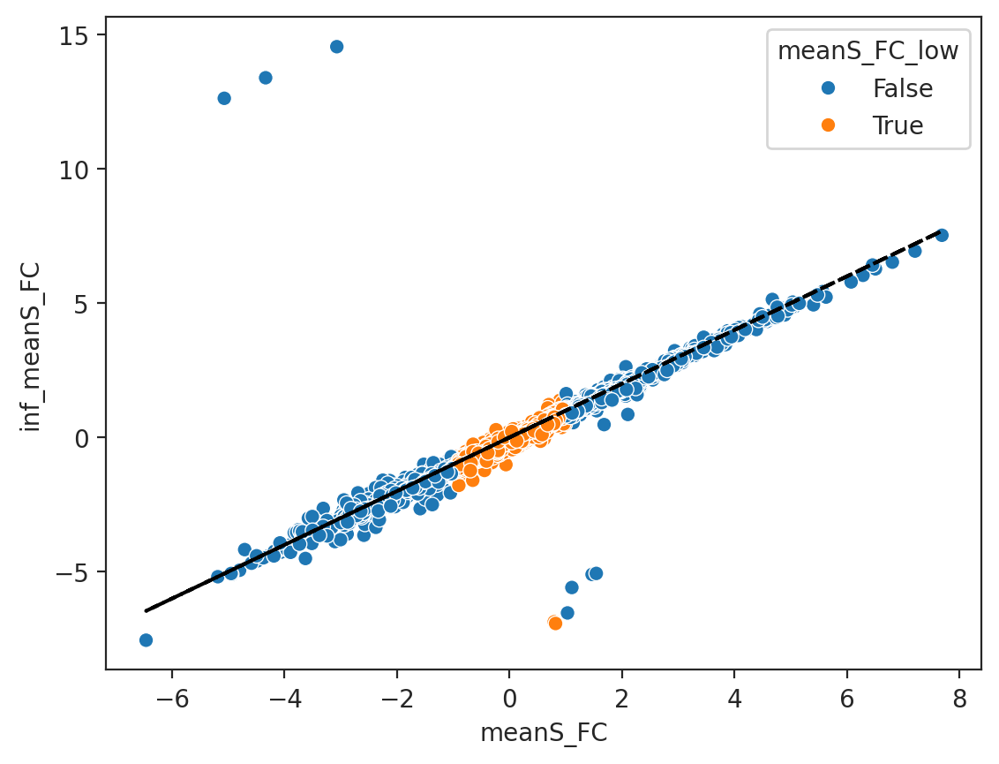

In [553]:
sns.scatterplot(x='meanS_FC',y='inf_meanS_FC',hue='meanS_FC_low',data=onesamp_fcs)
plt.plot(onesamp_fcs.meanS_FC,onesamp_fcs.meanS_FC,color='black',linestyle='--')

Genes with log2FC>1 means but NOT params

In [554]:
onesamp_fcs[(onesamp_fcs.meanS_FC_low==False)&(np.abs(onesamp_fcs.b_FC)<1)&(np.abs(onesamp_fcs.beta_FC)<1)&(np.abs(onesamp_fcs.gamma_FC)<1)].style

,b_FC,beta_FC,gamma_FC,meanS_FC,inf_meanS_FC,k_FC,meanS_FC_low,if_k_FC,cond,gene
4,0.333160,-0.030180,-0.747311,1.094713,1.080471,0.388745,False,False,CRT_Ctrl1,KIF1B
5,0.419659,0.126783,-0.654052,1.110378,1.073711,0.263634,False,False,CRT_Ctrl1,VPS13D
10,0.552294,0.140991,-0.714254,1.277374,1.266549,0.286632,False,False,CRT_Ctrl1,CAPZB
19,0.326657,0.494851,-0.756367,1.122971,1.083024,0.130758,False,False,CRT_Ctrl1,PHACTR4
61,-0.839155,-0.667341,0.406006,-1.397786,-1.245161,0.130668,False,False,CRT_Ctrl1,POGZ
95,0.777920,0.349624,-0.880380,1.646901,1.658300,0.265378,False,False,CRT_Ctrl1,MAPKAPK2
117,0.491000,0.286118,-0.876015,1.434915,1.367015,0.294949,False,False,CRT_Ctrl1,FAM107B
120,0.579130,-0.664470,-0.584827,1.203590,1.163957,0.624649,False,False,CRT_Ctrl1,KIAA1217
137,0.388871,0.947152,-0.680401,1.085270,1.069272,-0.133376,False,False,CRT_Ctrl1,CCDC6
149,0.739431,-0.894881,-0.355731,1.084285,1.095162,0.625306,False,False,CRT_Ctrl1,ANXA11


In [ ]:
#Params FCS will recapitulate mean FCs (can have smaller mag param FCs that --> larger mean FCs)

Summary fig, which params affected consistently

In [542]:
sub_crt = onesamp_fcs[onesamp_fcs.cond.isin(['CRT_Ctrl1','CRT_Ctrl2','CRT_Ctrl3'])]
sub_crtl = onesamp_fcs[onesamp_fcs.cond.isin(['CRTl_Ctrl1','CRTl_Ctrl2','CRTl_Ctrl3'])]

In [543]:

trans_crt = sub_crt.gene[((sub_crt.if_k_FC) | (np.abs(sub_crt.b_FC) > 1))]
trans_genes_crt = list(trans_crt.value_counts().index[trans_crt.value_counts()==3])

beta_crt = sub_crt.gene[((np.abs(sub_crt.beta_FC) > 1) &  (~sub_crt.if_k_FC))]
beta_genes_crt = list(beta_crt.value_counts().index[beta_crt.value_counts()==3])

gamma_crt = sub_crt.gene[((np.abs(sub_crt.gamma_FC) > 1) &  (~sub_crt.if_k_FC))]
gamma_genes_crt = list(gamma_crt.value_counts().index[gamma_crt.value_counts()==3])

meanS_crt = sub_crt.gene[(np.abs(sub_crt.meanS_FC) > 1)]
meanS_genes_crt = list(meanS_crt.value_counts().index[meanS_crt.value_counts()==3])



In [544]:

trans_crtl = sub_crtl.gene[((sub_crtl.if_k_FC) | (np.abs(sub_crtl.b_FC) > 1))]
trans_genes_crtl = list(trans_crtl.value_counts().index[trans_crtl.value_counts()==3])

beta_crtl = sub_crtl.gene[((np.abs(sub_crtl.beta_FC) > 1) &  (~sub_crtl.if_k_FC))]
beta_genes_crtl = list(beta_crtl.value_counts().index[beta_crtl.value_counts()==3])

gamma_crtl = sub_crtl.gene[((np.abs(sub_crtl.gamma_FC) > 1)&  (~sub_crtl.if_k_FC))]
gamma_genes_crtl = list(gamma_crtl.value_counts().index[gamma_crtl.value_counts()==3])

meanS_crtl = sub_crtl.gene[(np.abs(sub_crtl.meanS_FC) > 1)]
meanS_genes_crtl = list(meanS_crtl.value_counts().index[meanS_crtl.value_counts()==3])



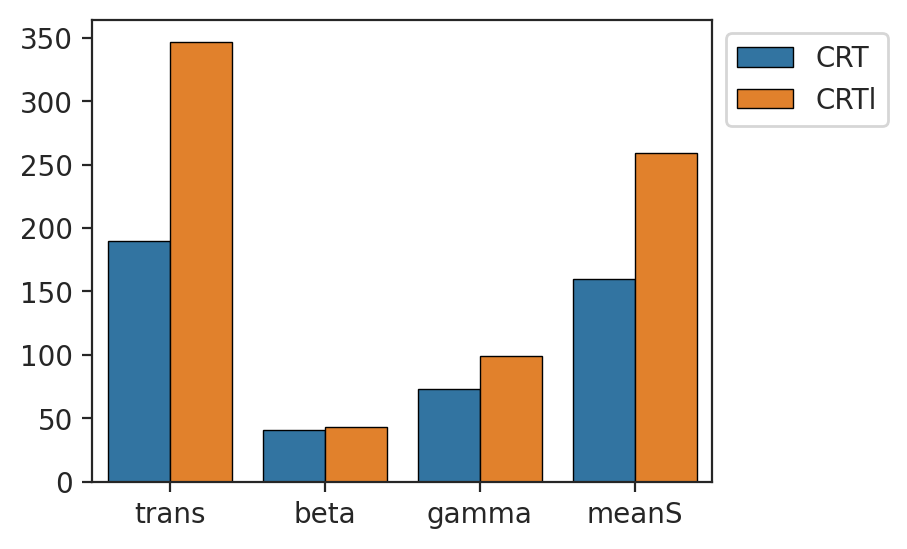

In [545]:
plt.figure(figsize=(4,3))
ax=sns.barplot(x=['trans','beta','gamma','meanS']*2,
            y=[len(trans_genes_crt),len(beta_genes_crt),len(gamma_genes_crt),len(meanS_genes_crt),
              len(trans_genes_crtl),len(beta_genes_crtl),len(gamma_genes_crtl),len(meanS_genes_crtl)],
           hue=['CRT']*4+['CRTl']*4,
              linewidth=0.5,edgecolor='black')
sns.move_legend(ax, "upper left", bbox_to_anchor=(1, 1))

In [418]:
def jaccard_similarity(list1, list2):
    s1 = set(list1)
    s2 = set(list2)
    return float(len(s1.intersection(s2)) / len(s1.union(s2)))

In [419]:
crt_genes_forjac = [trans_genes_crt,beta_genes_crt,gamma_genes_crt,meanS_genes_crt]
crtl_genes_forjac = [trans_genes_crtl,beta_genes_crtl,gamma_genes_crtl,meanS_genes_crtl]

In [420]:
jac_crt = np.zeros((len(crt_genes_forjac),len(crt_genes_forjac)))
jac_crtl = np.zeros((len(crtl_genes_forjac),len(crtl_genes_forjac)))

for i in range(len(crt_genes_forjac)):
    for j in range(i,len(crt_genes_forjac)):
        sim = jaccard_similarity(crt_genes_forjac[i],crt_genes_forjac[j])
        jac_crt[i,j] = sim
        jac_crt[j,i] = sim

for i in range(len(crtl_genes_forjac)):
    for j in range(i,len(crtl_genes_forjac)):
        sim = jaccard_similarity(crtl_genes_forjac[i],crtl_genes_forjac[j])
        jac_crtl[i,j] = sim
        jac_crtl[j,i] = sim

Text(0.5, 1.0, 'CRT')

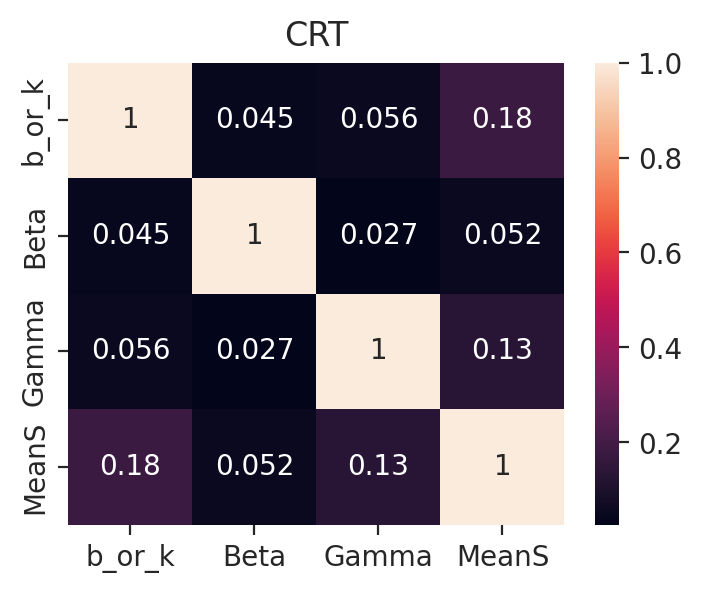

In [425]:
plt.figure(figsize=(4,3))
jac_crt_df = pd.DataFrame(jac_crt)
jac_crt_df.columns = ['b_or_k','Beta','Gamma','MeanS']
jac_crt_df.index = ['b_or_k','Beta','Gamma','MeanS']
sns.heatmap(jac_crt_df,annot=True)
plt.title('CRT')

Text(0.5, 1.0, 'CRTl')

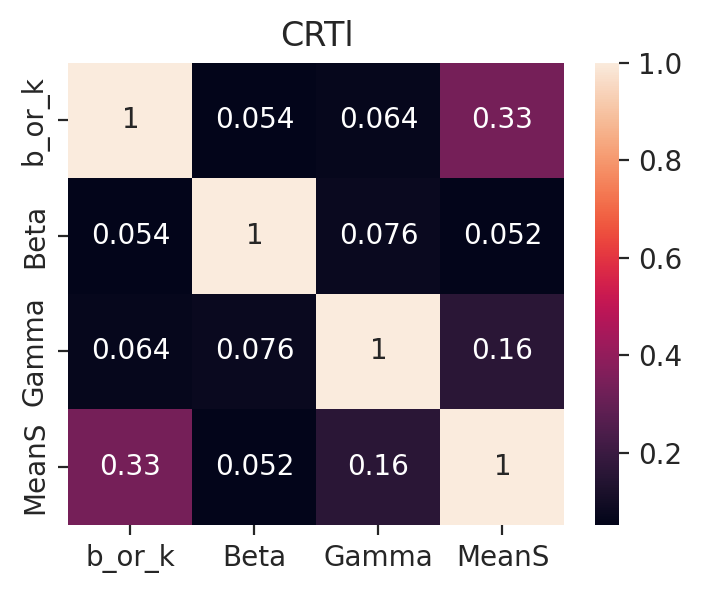

In [426]:
plt.figure(figsize=(4,3))
jac_crtl_df = pd.DataFrame(jac_crtl)
jac_crtl_df.columns = ['b_or_k','Beta','Gamma','MeanS']
jac_crtl_df.index = ['b_or_k','Beta','Gamma','MeanS']
sns.heatmap(jac_crtl_df,annot=True)
plt.title('CRTl')

Which genes consistently affected by treatment for patient?

In [328]:
#Get mean FC + Var for each gene
std_crtl = []
std_crt = []
means_crtl = []
means_crt = []
params = []

genes = []
for g in np.unique(onesamp_fcs.gene):
    sub_crt = onesamp_fcs[onesamp_fcs.gene.isin([g]) & onesamp_fcs.cond.isin(['CRT_Ctrl1','CRT_Ctrl2','CRT_Ctrl3'])]
    sub_crtl = onesamp_fcs[onesamp_fcs.gene.isin([g]) & onesamp_fcs.cond.isin(['CRT_Ctrl1','CRT_Ctrl2','CRT_Ctrl3'])]

    means_crt += [np.mean(sub_crt.b_FC)] +[np.mean(sub_crt.beta_FC)]+[np.mean(sub_crt.gamma_FC)]+[np.mean(sub_crt.meanS_FC)]
    
    std_crt += [np.sqrt(np.var(sub_crt.b_FC))]+[np.sqrt(np.var(sub_crt.beta_FC))]+[np.sqrt(np.var(sub_crt.gamma_FC))]+[np.sqrt(np.var(sub_crt.meanS_FC))]

    means_crtl += [np.mean(sub_crtl.b_FC)] +[np.mean(sub_crtl.beta_FC)]+[np.mean(sub_crtl.gamma_FC)]+[np.mean(sub_crtl.meanS_FC)]
    
    std_crtl += [np.sqrt(np.var(sub_crtl.b_FC))]+[np.sqrt(np.var(sub_crtl.beta_FC))]+[np.sqrt(np.var(sub_crtl.gamma_FC))]+[np.sqrt(np.var(sub_crtl.meanS_FC))]


    genes += [g]*4

    params += ['b']+['beta']+['gamma']+['s']

gene_var_df = pd.DataFrame()
gene_var_df['means_crt']=means_crt
gene_var_df['means_crtl']=means_crtl
gene_var_df['std_crt']=std_crt
gene_var_df['std_crtl']=std_crtl
gene_var_df['genes']=genes
gene_var_df['params']=params
gene_var_df.head()
#plt.errorbar(x, y, yerr=e, fmt='o'), 1.96*std dev

,means_crt,means_crtl,std_crt,std_crtl,genes,params
0,0.896596,0.896596,0.415056,0.415056,AAK1,b
1,-0.995479,-0.995479,0.726807,0.726807,AAK1,beta
2,-0.886691,-0.886691,0.982790,0.982790,AAK1,gamma
3,1.863717,1.863717,0.814511,0.814511,AAK1,s
4,0.906984,0.906984,0.373489,0.373489,ABCD3,b


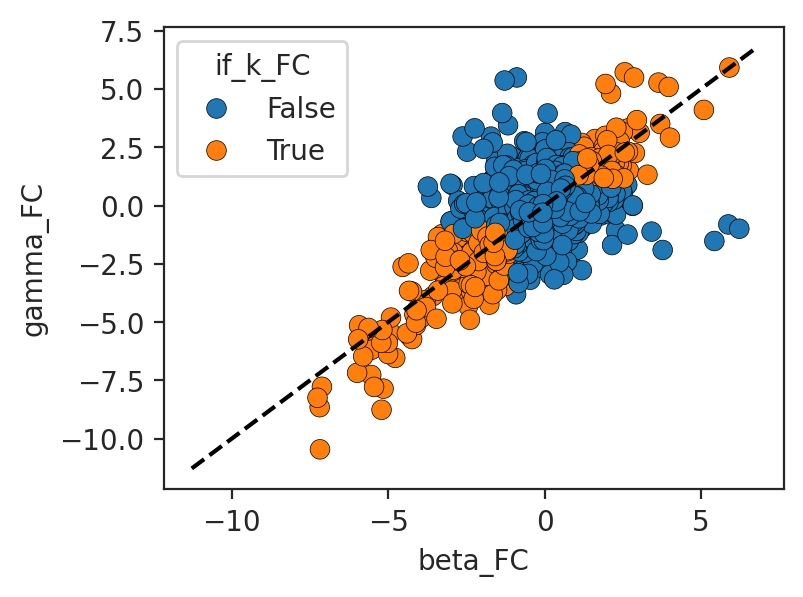

In [371]:
plt.figure(figsize=(4,3))
ax=sns.scatterplot(x='beta_FC',y='gamma_FC',data=onesamp_fcs[onesamp_fcs.cond.isin(['CRT_Ctrl1','CRT_Ctrl2','CRT_Ctrl3'])],
                  hue='if_k_FC',s=50,linewidth=0.25,edgecolor='black')
plt.plot(np.linspace(ax.get_ylim()[0],ax.get_ylim()[1]),np.linspace(ax.get_ylim()[0],ax.get_ylim()[1]),linestyle='--',color='black')

Get GO annotations from biomart

In [635]:
go_mart = pd.read_csv('/home/tchari/metadata/mart_GRCh38p14_GO_uniq.txt',delimiter='\t')
go_mart.head()

,Gene stable ID,Gene stable ID version,GO term accession,GO term name,Gene name
0,ENSG00000210049,ENSG00000210049.1,GO:0030533,triplet codon-amino acid adaptor activity,MT-TF
1,ENSG00000210049,ENSG00000210049.1,GO:0006412,translation,MT-TF
2,ENSG00000211459,ENSG00000211459.2,NaN,NaN,MT-RNR1
3,ENSG00000210077,ENSG00000210077.1,NaN,NaN,MT-TV
4,ENSG00000210082,ENSG00000210082.2,GO:0003735,structural constituent of ribosome,MT-RNR2


Beta FCs between  conditions

<Axes: ylabel='Count'>

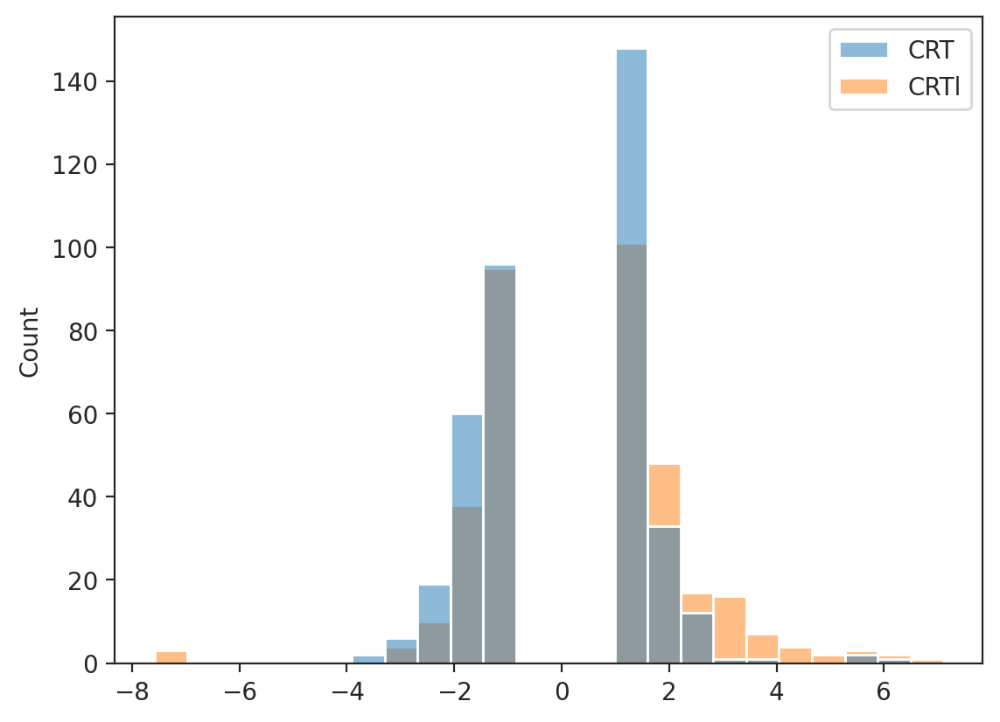

In [693]:
crt_beta = sub_crt.beta_FC[~(sub_crt.if_k_FC) & (np.abs(sub_crt.beta_FC) > 1)]
crtl_beta = sub_crtl.beta_FC[~(sub_crtl.if_k_FC) & (np.abs(sub_crtl.beta_FC) > 1)]

sns.histplot(x=list(crt_beta)+list(crtl_beta),
            hue=['CRT']*len(crt_beta)+['CRTl']*len(crtl_beta))



In [699]:
crt_beta_all = sub_crt[~(sub_crt.if_k_FC) & (np.abs(sub_crt.beta_FC) > 1)]
crt_beta_all[crt_beta_all.beta_FC < -1].style

,b_FC,beta_FC,gamma_FC,meanS_FC,inf_meanS_FC,k_FC,meanS_FC_low,if_k_FC,cond,gene
18,-0.036171,-1.209942,-0.788514,0.764808,0.752343,0.999228,True,False,CRT_Ctrl1,WASF2
49,0.602557,-1.072870,1.046914,-0.465204,-0.444357,0.012978,True,False,CRT_Ctrl1,RPAP2
62,0.489594,-1.558482,-0.219866,0.758979,0.709460,0.889174,True,False,CRT_Ctrl1,IL6R
101,-2.279656,-1.779520,-0.190768,-2.058954,-2.088887,0.985144,False,False,CRT_Ctrl1,MIA3
102,-0.628359,-1.059357,0.022927,-0.664620,-0.651285,0.518215,True,False,CRT_Ctrl1,CAPN2
103,-1.263869,-1.056443,-0.631778,-0.619532,-0.632090,0.844111,True,False,CRT_Ctrl1,DNAH14
126,-0.297114,-1.181814,1.093135,-1.297604,-1.390250,0.044340,False,False,CRT_Ctrl1,ZEB1
194,-0.490493,-1.719779,-0.911369,0.397146,0.420875,1.315574,True,False,CRT_Ctrl1,CHKA
207,0.183859,-2.936490,0.872835,-0.706995,-0.688976,1.031827,True,False,CRT_Ctrl1,DIXDC1
242,-0.143861,-1.505975,0.248392,-0.347160,-0.392254,0.628791,True,False,CRT_Ctrl1,LIMA1


In [708]:
consis_beta_gs = np.unique(list(crt_beta_all.gene.value_counts().index[crt_beta_all.gene.value_counts()==3]))
crt_beta_all[crt_beta_all.gene.isin(consis_beta_gs)].style

,b_FC,beta_FC,gamma_FC,meanS_FC,inf_meanS_FC,k_FC,meanS_FC_low,if_k_FC,cond,gene
33,1.502065,2.200430,-0.134179,1.729617,1.636244,-1.033125,False,False,CRT_Ctrl1,EFCAB14
101,-2.279656,-1.779520,-0.190768,-2.058954,-2.088887,0.985144,False,False,CRT_Ctrl1,MIA3
113,1.543283,1.397868,-0.492645,2.225493,2.035928,-0.452611,False,False,CRT_Ctrl1,GDI2
152,0.863103,1.433929,0.216971,0.624393,0.646132,-0.825450,True,False,CRT_Ctrl1,PTEN
211,1.520185,1.455801,0.795535,0.693543,0.724650,-1.125668,True,False,CRT_Ctrl1,KMT2A
213,-0.863434,1.252648,-0.121856,-0.648916,-0.741578,-0.565396,True,False,CRT_Ctrl1,SORL1
217,1.774434,1.791887,-0.425959,2.238806,2.200393,-0.682964,False,False,CRT_Ctrl1,APLP2
242,-0.143861,-1.505975,0.248392,-0.347160,-0.392254,0.628791,True,False,CRT_Ctrl1,LIMA1
260,1.335182,5.871927,-0.808779,2.546717,2.143960,-2.531574,False,False,CRT_Ctrl1,HSP90B1
292,1.247447,-1.660529,1.124832,0.126711,0.122616,0.267849,True,False,CRT_Ctrl1,UGGT2


In [ ]:
#PTEN - file:///Users/tarachari/Downloads/or_33_1_457_PDF.pdf
#LIMA1 --> less = more tumorigenic https://www.frontiersin.org/journals/oncology/articles/10.3389/fonc.2023.1115943/full
#TNRC6A --> mrNA assoc with lncRNA-mediated 5;FU resistance https://pmc.ncbi.nlm.nih.gov/articles/PMC11379344/
#PPIP5K2--> https://pmc.ncbi.nlm.nih.gov/articles/PMC5345130/, affects apoptosis machinery + 5-FU less effective
#PRMT2 --> PDAC target https://pmc.ncbi.nlm.nih.gov/articles/PMC11011826/

In [721]:
'NEAT1' in list(sr_arr[0].gene_names)

False

In [730]:
crt_beta_all[crt_beta_all.gene.isin(['TNRC6A','LIMA1','PPIP5K2','PRMT2'])].style

,b_FC,beta_FC,gamma_FC,meanS_FC,inf_meanS_FC,k_FC,meanS_FC_low,if_k_FC,cond,gene
242,-0.143861,-1.505975,0.248392,-0.347160,-0.392254,0.628791,True,False,CRT_Ctrl1,LIMA1
399,0.727572,-1.492238,0.552323,0.183535,0.175249,0.469958,True,False,CRT_Ctrl1,TNRC6A
631,0.214429,1.244938,0.376778,-0.122033,-0.162349,-0.810858,True,False,CRT_Ctrl1,PRMT2
814,0.141535,1.504822,0.729917,-0.477513,-0.588382,-1.117370,True,False,CRT_Ctrl1,PPIP5K2
1272,-0.886463,-1.274002,0.377836,-1.204014,-1.264298,0.448083,False,False,CRT_Ctrl2,LIMA1
1429,0.292835,-1.618453,-0.163221,0.504470,0.456056,0.890837,True,False,CRT_Ctrl2,TNRC6A
1661,0.280940,1.138202,0.266164,0.013076,0.014776,-0.702183,True,False,CRT_Ctrl2,PRMT2
1844,-0.118415,1.507456,0.297213,-0.291584,-0.415628,-0.902334,True,False,CRT_Ctrl2,PPIP5K2
2302,0.406892,-2.302345,0.052476,0.528586,0.354416,1.124934,True,False,CRT_Ctrl3,LIMA1
2459,-0.242681,-1.667515,0.300905,-0.418673,-0.543586,0.683305,True,False,CRT_Ctrl3,TNRC6A


In [863]:
sub = crt_beta_all[crt_beta_all.gene.isin(['TNRC6A','LIMA1','PPIP5K2','PRMT2'])]

sub_2 = sub [['b_FC','beta_FC','gamma_FC','meanS_FC','gene','cond']]
sub_2_m = sub_2.melt(['gene','cond'], var_name='cols', value_name='vals')
sub_2_m.head()


,gene,cond,cols,vals
0,LIMA1,CRT_Ctrl1,b_FC,-0.143861
1,TNRC6A,CRT_Ctrl1,b_FC,0.727572
2,PRMT2,CRT_Ctrl1,b_FC,0.214429
3,PPIP5K2,CRT_Ctrl1,b_FC,0.141535
4,LIMA1,CRT_Ctrl2,b_FC,-0.886463


/tmp/ipykernel_2176339/1541106007.py:9: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


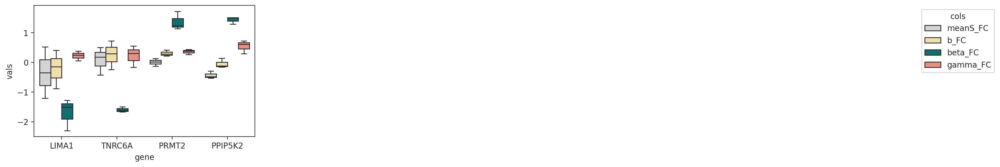

In [868]:
plt.figure(figsize=(5,3))

palette = {'meanS_FC':'lightgrey','b_FC':'#f9e79f','beta_FC':'teal','gamma_FC':'salmon','k_FC':'#c39bd3'}
ax=sns.boxplot(x='gene',y='vals',hue='cols',data=sub_2_m,dodge=True,
              hue_order=['meanS_FC','b_FC','beta_FC','gamma_FC'],palette=palette,
           )  #order = ["A", "B", "C"]

sns.move_legend(ax, "upper left", bbox_to_anchor=(4, 1))
plt.tight_layout()
plt.savefig('beta_crt.pdf')


Write background genes to file

In [583]:
with open('nonrej_background.txt', 'w') as f:
    for line in np.unique(onesamp_fcs.gene):
        f.write(f"{line}\n")

In [584]:
with open('all_background.txt', 'w') as f:
    for line in list(sr_arr[0].gene_names):
        f.write(f"{line}\n")

Where did b and/or k change

In [555]:
sub_crt = onesamp_fcs[onesamp_fcs.cond.isin(['CRT_Ctrl1','CRT_Ctrl2','CRT_Ctrl3'])]
sub_crtl = onesamp_fcs[onesamp_fcs.cond.isin(['CRTl_Ctrl1','CRTl_Ctrl2','CRTl_Ctrl3'])]

In [556]:
k_b_crt = sub_crt.gene[sub_crt.if_k_FC | ((np.abs(sub_crt.b_FC) > 1) & (np.abs(sub_crt.beta_FC) < 1) & (np.abs(sub_crt.gamma_FC) < 1))]

In [557]:
k_b_crt_filt = sub_crt.gene[(sub_crt.if_k_FC & (np.abs(sub_crt.k_FC)<5))| ((np.abs(sub_crt.b_FC) > 1) & (np.abs(sub_crt.beta_FC) < 1) & (np.abs(sub_crt.gamma_FC) < 1))]

In [713]:
set(crt_trans_genes_filt).intersection(crtl_trans_genes_filt)

{'ALG13',
 'ARID5B',
 'ATG2B',
 'CCAR1',
 'CCDC88A',
 'DAG1',
 'DIP2A',
 'DSE',
 'ESCO1',
 'FSD1L',
 'IQGAP2',
 'OPA1',
 'OTUD4',
 'PCNX4',
 'PDS5B',
 'PLXDC2',
 'SECISBP2',
 'SH3PXD2B',
 'ZBTB16',
 'ZC3H13'}

In [731]:
'RB1' in crt_trans_genes_filt

True

In [714]:
'TIMP2' in crtl_trans_genes_filt

True

In [558]:
#https://pmc.ncbi.nlm.nih.gov/articles/PMC9247273/
#Also found organelle/cytoskeletal etc assoc genes --> resistance under 5 FU treatment
crt_trans_genes = list(k_b_crt.value_counts().index[k_b_crt.value_counts()==3])
print(len(crt_trans_genes))

with open('crt_trans_genes.txt', 'w') as f:
    for line in crt_trans_genes:
        f.write(f"{line}\n")

106


In [559]:
#https://pmc.ncbi.nlm.nih.gov/articles/PMC9247273/
#Also found organelle/cytoskeletal etc assoc genes --> resistance under 5 FU treatment
crt_trans_genes_filt = list(k_b_crt_filt.value_counts().index[k_b_crt_filt.value_counts()==3])
print(len(crt_trans_genes_filt))

with open('crt_trans_genes_filt.txt', 'w') as f:
    for line in crt_trans_genes_filt:
        f.write(f"{line}\n")

96


In [ ]:
#RB1 --> known tumor suppressor (k down)
#CDC42 ---> potentialyl aids resistant cells (colorectal cancer + 5 FU) https://pmc.ncbi.nlm.nih.gov/articles/PMC4387277/

# lower mean but noise mod related to mitochondrial fusion + spindle org (similar mech seen in colorectal resistant 5-FU),
# MIGA1, OPA1,CDC16 
#https://pmc.ncbi.nlm.nih.gov/articles/PMC9247273/

In [686]:
#CRT transcrip genes with low mean FC , PDS5B , ZC3H13 , MIGA1, OPA1,CDC16 (organelle fission/nuclear organization + spindle)
#ATR --> dna damage..
sub_crt[sub_crt.gene.isin(crt_trans_genes_filt) & sub_crt.meanS_FC_low].style

,b_FC,beta_FC,gamma_FC,meanS_FC,inf_meanS_FC,k_FC,meanS_FC_low,if_k_FC,cond,gene
30,-1.543871,-2.455784,-2.213003,0.743038,0.669132,2.334394,True,True,CRT_Ctrl1,HIVEP3
42,-2.109633,-1.992764,-1.733179,-0.325801,-0.376454,1.862971,True,True,CRT_Ctrl1,MIGA1
79,-2.211800,-1.995212,-2.652366,0.474444,0.440566,2.323789,True,True,CRT_Ctrl1,ABL2
80,-2.294624,-1.215734,-2.965700,0.738361,0.671076,2.090717,True,True,CRT_Ctrl1,CEP350
92,1.588955,1.938884,2.281184,-0.742915,-0.692229,-2.110034,True,True,CRT_Ctrl1,IPO9
139,-1.326005,-1.371176,-1.232940,-0.001403,-0.093065,1.302058,True,True,CRT_Ctrl1,ARID5B
143,-2.015137,-3.164457,-1.216181,-0.803062,-0.798955,2.190319,True,True,CRT_Ctrl1,CCAR1
171,1.477810,1.125485,2.064790,-0.719068,-0.586980,-1.595138,True,True,CRT_Ctrl1,PPP2R2D
206,-2.541592,-2.054374,-2.068983,-0.356498,-0.472609,2.061679,True,True,CRT_Ctrl1,ATM
234,-2.065148,-1.379517,-1.122955,-0.990370,-0.942193,1.251236,True,True,CRT_Ctrl1,PPFIBP1


In [732]:
sub_crt[sub_crt.gene.isin(crt_trans_genes_filt) & sub_crt.if_k_FC].style

,b_FC,beta_FC,gamma_FC,meanS_FC,inf_meanS_FC,k_FC,meanS_FC_low,if_k_FC,cond,gene
14,-1.340825,-2.372605,-2.645665,1.266361,1.304840,2.509135,False,True,CRT_Ctrl1,CDC42
24,0.844840,1.252192,2.019837,-1.195725,-1.174997,-1.636014,False,True,CRT_Ctrl1,SFPQ
30,-1.543871,-2.455784,-2.213003,0.743038,0.669132,2.334394,True,True,CRT_Ctrl1,HIVEP3
42,-2.109633,-1.992764,-1.733179,-0.325801,-0.376454,1.862971,True,True,CRT_Ctrl1,MIGA1
79,-2.211800,-1.995212,-2.652366,0.474444,0.440566,2.323789,True,True,CRT_Ctrl1,ABL2
80,-2.294624,-1.215734,-2.965700,0.738361,0.671076,2.090717,True,True,CRT_Ctrl1,CEP350
92,1.588955,1.938884,2.281184,-0.742915,-0.692229,-2.110034,True,True,CRT_Ctrl1,IPO9
118,-1.247070,-2.482192,-3.058827,1.942347,1.811757,2.770509,False,True,CRT_Ctrl1,PLXDC2
132,-0.640559,-2.829145,-2.470244,1.934403,1.829685,2.649694,False,True,CRT_Ctrl1,NRP1
139,-1.326005,-1.371176,-1.232940,-0.001403,-0.093065,1.302058,True,True,CRT_Ctrl1,ARID5B


In [733]:
sub_crt[sub_crt.gene.isin(['CDC42','RB1'])]

,b_FC,beta_FC,gamma_FC,meanS_FC,inf_meanS_FC,k_FC,meanS_FC_low,if_k_FC,cond,gene
14,-1.340825,-2.372605,-2.645665,1.266361,1.304840,2.509135,False,True,CRT_Ctrl1,CDC42
285,0.907073,1.658302,2.598731,-1.636606,-1.691658,-2.128517,False,True,CRT_Ctrl1,RB1
1044,0.272783,-1.177853,-1.153933,1.443585,1.426717,1.165893,False,True,CRT_Ctrl2,CDC42
1315,-0.076398,1.193769,2.374252,-2.349040,-2.450651,-1.784011,False,True,CRT_Ctrl2,RB1
2074,-1.129634,-2.311324,-2.740542,1.704217,1.610908,2.525933,False,True,CRT_Ctrl3,CDC42
2345,0.491832,1.061785,2.141082,-1.454067,-1.649250,-1.601433,False,True,CRT_Ctrl3,RB1


In [664]:
go_trans_crt[go_trans_crt['Gene name'].isin(org_genes)].style

,Gene stable ID,Gene stable ID version,GO term accession,GO term name,Gene name
11559,ENSG00000083642,ENSG00000083642.19,GO:0007064,mitotic sister chromatid cohesion,PDS5B
11560,ENSG00000083642,ENSG00000083642.19,GO:0005634,nucleus,PDS5B
11561,ENSG00000083642,ENSG00000083642.19,GO:0005654,nucleoplasm,PDS5B
11562,ENSG00000083642,ENSG00000083642.19,GO:0051301,cell division,PDS5B
11563,ENSG00000083642,ENSG00000083642.19,GO:0005515,protein binding,PDS5B
11564,ENSG00000083642,ENSG00000083642.19,GO:0000785,chromatin,PDS5B
11565,ENSG00000083642,ENSG00000083642.19,GO:0008285,negative regulation of cell population proliferation,PDS5B
11566,ENSG00000083642,ENSG00000083642.19,GO:0005829,cytosol,PDS5B
11567,ENSG00000083642,ENSG00000083642.19,GO:0003677,DNA binding,PDS5B
11568,ENSG00000083642,ENSG00000083642.19,GO:0000775,"chromosome, centromeric region",PDS5B


In [663]:
org_genes = ['CEP350','ATG2B','AGFG1','DNAJB6','CFAP44','MDN1','FLNB','CDC42','ESCO1',
                          'RAB22A','OPA1','PDS5B','SP100','IQGAP2','ACTN4','ATM','ARHGEF10',
                          'SEPTIN7','DHX36','ATR','RB1','ZNF207','MIGA1','SYNE1','DAG1','SH3PXD2B',
                          'SDCCAG8','STX16','PPP2R2D','CCDC88A','ETS1','USP36']

#RB1 classic tumor suppressor gene with rate k down..

In [561]:
sub_crt[sub_crt.gene.isin(org_genes)].style

,b_FC,beta_FC,gamma_FC,meanS_FC,inf_meanS_FC,k_FC,meanS_FC_low,if_k_FC,cond,gene
14,-1.340825,-2.372605,-2.645665,1.266361,1.304840,2.509135,False,True,CRT_Ctrl1,CDC42
42,-2.109633,-1.992764,-1.733179,-0.325801,-0.376454,1.862971,True,True,CRT_Ctrl1,MIGA1
80,-2.294624,-1.215734,-2.965700,0.738361,0.671076,2.090717,True,True,CRT_Ctrl1,CEP350
110,-1.347744,-0.290639,0.208185,-1.569701,-1.555929,0.041227,False,False,CRT_Ctrl1,SDCCAG8
171,1.477810,1.125485,2.064790,-0.719068,-0.586980,-1.595138,True,True,CRT_Ctrl1,PPP2R2D
206,-2.541592,-2.054374,-2.068983,-0.356498,-0.472609,2.061679,True,True,CRT_Ctrl1,ATM
215,-1.116712,0.738679,0.357477,-1.522856,-1.474189,-0.548078,False,False,CRT_Ctrl1,ETS1
280,-1.186389,-1.286094,-2.137605,0.926956,0.951216,1.711850,True,True,CRT_Ctrl1,PDS5B
285,0.907073,1.658302,2.598731,-1.636606,-1.691658,-2.128517,False,True,CRT_Ctrl1,RB1
332,-2.732537,-2.102967,-2.616647,-0.112572,-0.115890,2.359807,True,True,CRT_Ctrl1,ATG2B


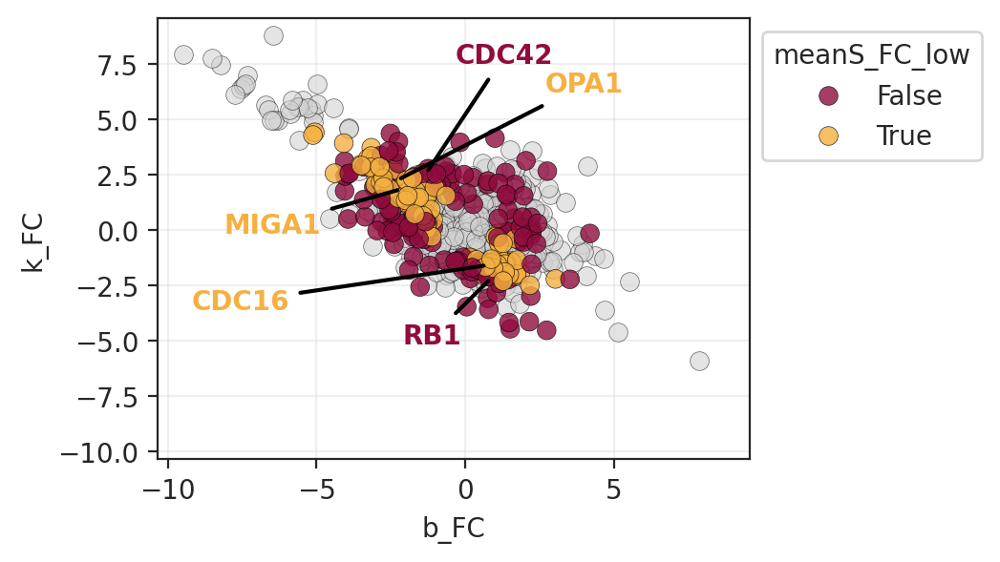

In [903]:
#RB1 --> known tumor suppressor (k down)
#CDC42 ---> potentialyl aids resistant cells (colorectal cancer + 5 FU) https://pmc.ncbi.nlm.nih.gov/articles/PMC4387277/

# lower mean but noise mod related to mitochondrial fusion + spindle org (similar mech seen in colorectal resistant 5-FU),
# MIGA1, OPA1,CDC16 
toplot = ['RB1','CDC42','MIGA1','OPA1','CDC16']

plt.figure(figsize=(4,3))
palette={True:'#f5b041',False:'#900C3F'}
ax=sns.scatterplot(x='b_FC',y='k_FC',data=sub_crt[~sub_crt.gene.isin(crt_trans_genes_filt)],color='lightgrey',
                  s=50,linewidth=0.25,edgecolor='black',alpha=0.6)
ax=sns.scatterplot(x='b_FC',y='k_FC',data=sub_crt[sub_crt.gene.isin(crt_trans_genes_filt)],hue='meanS_FC_low',
                   palette=palette,
                  s=50,linewidth=0.25,edgecolor='black',alpha=0.8)

pos = [(-3,-3),(1,5),(-6,-2),(5,4),(-10,-2)]
for t in range(len(toplot)):
    g = toplot[t]
    
    x = sub_crt.b_FC[sub_crt.gene.isin([g])].iloc[0]
    y = sub_crt.k_FC[sub_crt.gene.isin([g])].iloc[0]
    mean_col = sub_crt.meanS_FC_low[sub_crt.gene.isin([g])].iloc[0]
    ax.annotate(
        g,
        xy=(x, y), xycoords='data',color=palette[mean_col],weight="bold",
        xytext=(x+pos[t][0],y+pos[t][1]),textcoords='data',
        arrowprops=dict(arrowstyle= '-',
                             color='black',
                             lw=1.5,
                             ls='-'))

ax.set_ylim(np.min([ax.get_xlim()[0],ax.get_ylim()[0]]),np.max([ax.get_xlim()[1],ax.get_ylim()[1]]),)
ax.set_xlim(np.min([ax.get_xlim()[0],ax.get_ylim()[0]]),np.max([ax.get_xlim()[1],ax.get_ylim()[1]]),)
#f5b041 
sns.move_legend(ax, "upper left", bbox_to_anchor=(1, 1))
plt.grid(alpha=0.3)  
#plt.plot(np.linspace(ax.get_ylim()[0],ax.get_ylim()[1]),-1*np.linspace(ax.get_ylim()[0],ax.get_ylim()[1]),linestyle='--',color='black')
#plt.plot(np.linspace(ax.get_ylim()[0],ax.get_ylim()[1]),np.linspace(ax.get_ylim()[0],ax.get_ylim()[1]),linestyle='--',color='black')
plt.savefig('noise_crt.pdf')

CRTl

In [565]:
k_b_crtl = sub_crtl.gene[sub_crtl.if_k_FC | ((np.abs(sub_crtl.b_FC) > 1) & (np.abs(sub_crtl.beta_FC) < 1) & (np.abs(sub_crtl.gamma_FC) < 1))]

In [566]:
k_b_crtl_filt = sub_crtl.gene[(sub_crtl.if_k_FC & (np.abs(sub_crtl.k_FC) < 5))| ((np.abs(sub_crtl.b_FC) > 1) & (np.abs(sub_crtl.beta_FC) < 1) & (np.abs(sub_crtl.gamma_FC) < 1))]

In [567]:
#Lots of actin-related genes --> losartan mechanism of action 
#https://www.ncbi.nlm.nih.gov/books/NBK526065/
#https://pmc.ncbi.nlm.nih.gov/articles/PMC8056058/#:~:text=Losartan%20significantly%20reduced%20tumor%20growth,explain%20Losartan's%20anti%2Dproliferative%20effects.
crtl_trans_genes = list(k_b_crtl.value_counts().index[k_b_crtl.value_counts()==3])
print(len(crtl_trans_genes))

with open('crtl_trans_genes.txt', 'w') as f:
    for line in crtl_trans_genes:
        f.write(f"{line}\n")

'TIMP2' in crtl_trans_genes

204


True

In [568]:
#Lots of actin-related genes --> losartan mechanism of action 
#https://www.ncbi.nlm.nih.gov/books/NBK526065/
#https://pmc.ncbi.nlm.nih.gov/articles/PMC8056058/#:~:text=Losartan%20significantly%20reduced%20tumor%20growth,explain%20Losartan's%20anti%2Dproliferative%20effects.
crtl_trans_genes_filt = list(k_b_crtl_filt.value_counts().index[k_b_crtl_filt.value_counts()==3])
print(len(crtl_trans_genes_filt))

with open('crtl_trans_genes_filt.txt', 'w') as f:
    for line in crtl_trans_genes_filt:
        f.write(f"{line}\n")

'TIMP2' in crtl_trans_genes_filt   #-->noisy too
#RHOQ - translation reprogramming under 5 fu https://pmc.ncbi.nlm.nih.gov/articles/PMC8364333/#SEC4
#MET - in pancreatic cancer https://pmc.ncbi.nlm.nih.gov/articles/PMC7730415/
#RBM25 - regulator or splicing (rna-binding protein) --> noisy 

177


True

In [569]:
tfs = ['PKD2','REL','AHR','ZNF33B','MITF','NFIB','IL18','PKD2','HNF4A','MED13','CHD6','CDK13',
      'MED15','NFATC2','MET','SS18','TET2','PTMA','ZBTB16','PLSCR1','TBL1XR1','TEAD1','MRTFB',
      'PER1','RHOQ','NOTCH2']

In [737]:
'CELF2' in crt_trans_genes_filt

False

In [735]:
sub_crtl[sub_crtl.gene.isin(crtl_trans_genes_filt) & sub_crtl.meanS_FC_low].style

,b_FC,beta_FC,gamma_FC,meanS_FC,inf_meanS_FC,k_FC,meanS_FC_low,if_k_FC,cond,gene
3103,-1.514013,-1.730288,-1.262731,-0.261064,-0.251282,1.496510,True,True,CRTl_Ctrl1,USP48
3122,-4.237223,-3.974589,-4.140273,-0.071193,-0.096949,4.057431,True,True,CRTl_Ctrl1,GPBP1L1
3126,1.594018,1.134397,1.025848,0.658968,0.568170,-1.080122,True,True,CRTl_Ctrl1,NRDC
3144,-1.225243,-1.237321,-1.628511,0.506116,0.403268,1.432916,True,True,CRTl_Ctrl1,CTTNBP2NL
3175,-2.315005,-2.406238,-3.087056,0.903452,0.772051,2.746647,True,True,CRTl_Ctrl1,IVNS1ABP
3190,-2.757833,-2.446949,-2.311201,-0.376952,-0.446632,2.379075,True,True,CRTl_Ctrl1,RAB3GAP2
3203,2.087856,1.419064,1.382151,0.728509,0.705706,-1.400607,True,True,CRTl_Ctrl1,GDI2
3217,0.947327,2.474830,2.106535,-0.995037,-1.159207,-2.290682,True,True,CRTl_Ctrl1,ARHGAP12
3233,-1.709073,-1.956855,-1.339037,-0.278401,-0.370037,1.647946,True,True,CRTl_Ctrl1,CCAR1
3235,-1.361034,0.307085,-0.667038,-0.632948,-0.693996,0.179976,True,False,CRTl_Ctrl1,VCL


In [570]:
sub_crtl[sub_crtl.gene.isin(tfs)].style

,b_FC,beta_FC,gamma_FC,meanS_FC,inf_meanS_FC,k_FC,meanS_FC_low,if_k_FC,cond,gene
3147,1.946656,-0.077891,-0.032605,2.068359,1.979261,0.055248,False,False,CRTl_Ctrl1,NOTCH2
3224,0.442295,1.743216,3.409605,-2.974669,-2.967310,-2.576410,False,True,CRTl_Ctrl1,ZNF33B
3268,0.045159,2.539367,3.207314,-3.418476,-3.162155,-2.873340,False,True,CRTl_Ctrl1,TEAD1
3298,-3.993879,-3.569638,-2.613258,-1.219354,-1.380621,3.091448,False,True,CRTl_Ctrl1,IL18
3299,0.950985,-2.854407,-2.399936,3.470796,3.350921,2.627172,False,True,CRTl_Ctrl1,ZBTB16
3483,-1.944727,-0.386134,-0.970538,-0.981490,-0.974188,0.678336,True,False,CRTl_Ctrl1,MRTFB
3513,-1.539701,-4.237070,-3.445747,1.861908,1.906046,3.841408,False,True,CRTl_Ctrl1,PER1
3542,1.599951,1.653800,1.511802,0.320166,0.088149,-1.582801,True,True,CRTl_Ctrl1,MED13
3568,1.103965,2.119891,1.441185,-0.286993,-0.337220,-1.780538,True,True,CRTl_Ctrl1,SS18
3603,-0.703491,-3.579367,-3.434235,2.807831,2.730744,3.506801,False,True,CRTl_Ctrl1,RHOQ


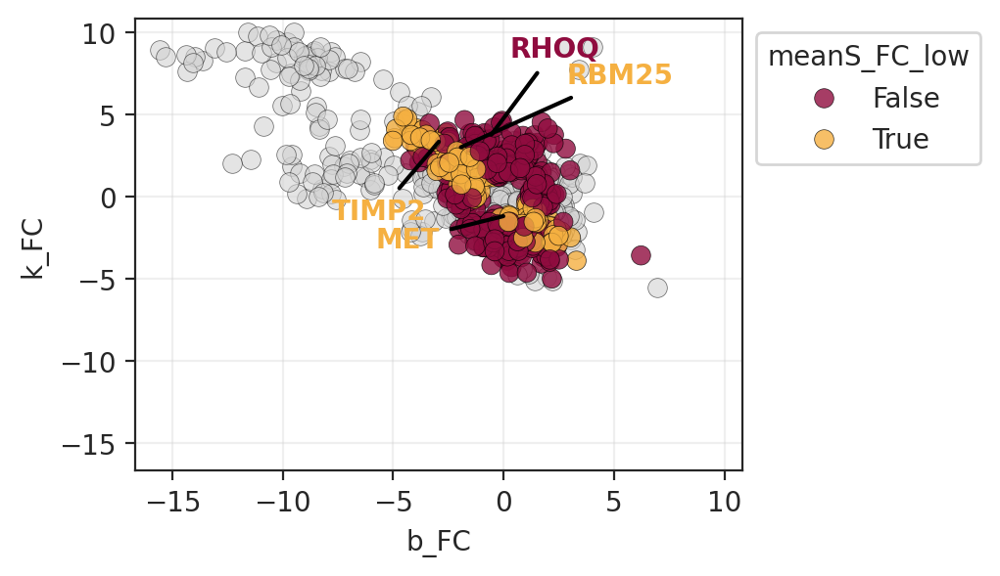

In [904]:
#'TIMP2' in crtl_trans_genes_filt   #-->noisy too
#RHOQ - translation reprogramming under 5 fu https://pmc.ncbi.nlm.nih.gov/articles/PMC8364333/#SEC4
#MET - in pancreatic cancer https://pmc.ncbi.nlm.nih.gov/articles/PMC7730415/
#RBM25 - regulator or splicing (rna-binding protein) --> noisy 
toplot = ['TIMP2','RHOQ','MET','RBM25']

plt.figure(figsize=(4,3))
palette={True:'#f5b041',False:'#900C3F'}
ax=sns.scatterplot(x='b_FC',y='k_FC',data=sub_crtl[~sub_crtl.gene.isin(crtl_trans_genes_filt)],color='lightgrey',
                  s=50,linewidth=0.25,edgecolor='black',alpha=0.6)
ax=sns.scatterplot(x='b_FC',y='k_FC',data=sub_crtl[sub_crtl.gene.isin(crtl_trans_genes_filt)],hue='meanS_FC_low',
                   palette=palette,
                  s=50,linewidth=0.25,edgecolor='black',alpha=0.8)

pos = [(-5,-5),(1,5),(-6,-2),(5,4),(-10,-2)]
for t in range(len(toplot)):
    g = toplot[t]
    
    x = sub_crtl.b_FC[sub_crtl.gene.isin([g])].iloc[0]
    y = sub_crtl.k_FC[sub_crtl.gene.isin([g])].iloc[0]
    mean_col = sub_crtl.meanS_FC_low[sub_crtl.gene.isin([g])].iloc[0]
    ax.annotate(
        g,
        xy=(x, y), xycoords='data',color=palette[mean_col],weight="bold",
        xytext=(x+pos[t][0],y+pos[t][1]),textcoords='data',
        arrowprops=dict(arrowstyle= '-',
                             color='black',
                             lw=1.5,
                             ls='-'))

ax.set_ylim(np.min([ax.get_xlim()[0],ax.get_ylim()[0]]),np.max([ax.get_xlim()[1],ax.get_ylim()[1]]),)
ax.set_xlim(np.min([ax.get_xlim()[0],ax.get_ylim()[0]]),np.max([ax.get_xlim()[1],ax.get_ylim()[1]]),)
#f5b041 
sns.move_legend(ax, "upper left", bbox_to_anchor=(1, 1))
#plt.plot(np.linspace(ax.get_ylim()[0],ax.get_ylim()[1]),-1*np.linspace(ax.get_ylim()[0],ax.get_ylim()[1]),linestyle='--',color='black')
#plt.plot(np.linspace(ax.get_ylim()[0],ax.get_ylim()[1]),np.linspace(ax.get_ylim()[0],ax.get_ylim()[1]),linestyle='--',color='black')
plt.grid(alpha=0.3)  
plt.savefig('noise_crtl.pdf')

mrna stability

In [573]:
gamma_crt = sub_crt.gene[((np.abs(sub_crt.gamma_FC) > 1) & ~(sub_crt.if_k_FC))]
gamma_crt_filt = sub_crt.gene[((np.abs(sub_crt.gamma_FC) > 1) & (np.abs(sub_crt.gamma_FC) < 5) & ~(sub_crt.if_k_FC))]

gamma_crtl = sub_crtl.gene[((np.abs(sub_crtl.gamma_FC) > 1) & ~(sub_crtl.if_k_FC))]
gamma_crtl_filt = sub_crtl.gene[((np.abs(sub_crtl.gamma_FC) > 1) & (np.abs(sub_crtl.gamma_FC) < 5) & ~(sub_crtl.if_k_FC))]

In [574]:
crt_gamma_genes = list(gamma_crt.value_counts().index[gamma_crt.value_counts()==3])
print(len(crt_gamma_genes))

with open('crt_gamma_genes.txt', 'w') as f:
    for line in crt_gamma_genes:
        f.write(f"{line}\n")


crt_gamma_genes_filt = list(gamma_crt_filt.value_counts().index[gamma_crt_filt.value_counts()==3])
print(len(crt_gamma_genes_filt))

with open('crt_gamma_genes_filt.txt', 'w') as f:
    for line in crt_gamma_genes_filt:
        f.write(f"{line}\n")

73
72


In [575]:
#Stability affected in neural morpho genes --> NRP program enriched in CRTl/malig in particular
#in the main paper: https://www.nature.com/articles/s41588-022-01134-8#data-availability
crtl_gamma_genes = list(gamma_crtl.value_counts().index[gamma_crtl.value_counts()==3])
print(len(crtl_gamma_genes))

with open('crtl_gamma_genes.txt', 'w') as f:
    for line in crtl_gamma_genes:
        f.write(f"{line}\n")


crtl_gamma_genes_filt = list(gamma_crtl_filt.value_counts().index[gamma_crtl_filt.value_counts()==3])
print(len(crtl_gamma_genes_filt))

with open('crtl_gamma_genes_filt.txt', 'w') as f:
    for line in crtl_gamma_genes_filt:
        f.write(f"{line}\n")

99
93


<Axes: xlabel='gamma_FC', ylabel='Count'>

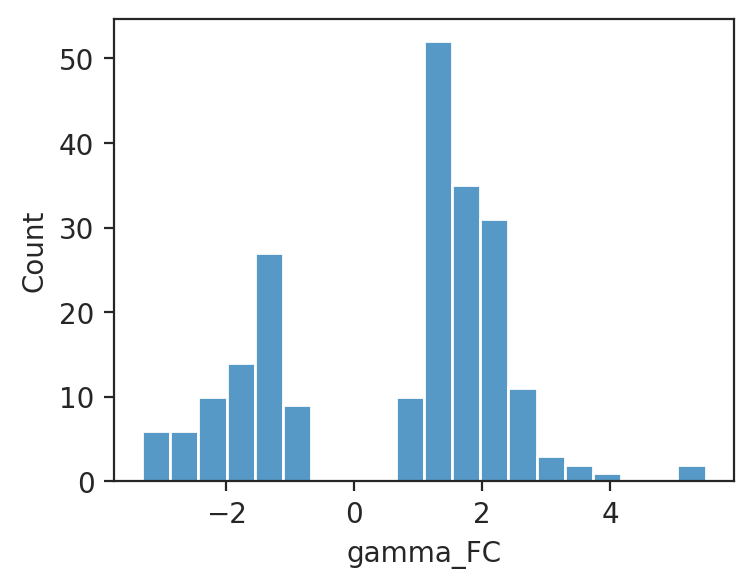

In [576]:
plt.figure(figsize=(4,3))
sns.histplot(x=sub_crt.gamma_FC[sub_crt.gene.isin(crt_gamma_genes)],bins=20)

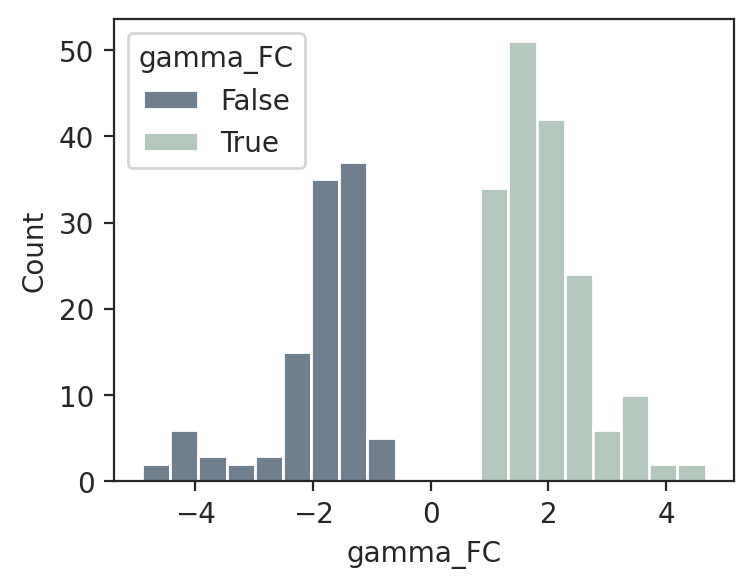

In [873]:
plt.figure(figsize=(4,3))
sns.histplot(x=sub_crtl.gamma_FC[sub_crtl.gene.isin(crtl_gamma_genes_filt)],
             hue=sub_crtl.gamma_FC[sub_crtl.gene.isin(crtl_gamma_genes_filt)]>0,
             palette={True:'#94b0a2',False:'#34495e'},bins=20,alpha=0.7)

plt.savefig('pos_neg_stab_ctrl.pdf')

 "Indeed, CCRF-CEM and Nalm-6 cells exhibited different cellular growth rate with generation times of 24 and 36 h, respectively. Taken together, this suggests that cells growing at a slower rate such as Nalm-6 would process the β-actin mRNA at a faster rate in order to respond to its cytoskeleton requirement. "

https://cancerci.biomedcentral.com/articles/10.1186/1475-2867-2-1#:~:text=Indeed%2C%20CCRF%2DCEM%20and%20Nalm,respond%20to%20its%20cytoskeleton%20requirement. 

In [743]:
sub_crtl[sub_crtl.gene.isin(['ACACA','ABL2','MICAL2','PEAK1','CDC42BPB','SNX9'])]

,b_FC,beta_FC,gamma_FC,meanS_FC,inf_meanS_FC,k_FC,meanS_FC_low,if_k_FC,cond,gene
3169,1.548770,0.021269,-1.317110,3.090385,2.865880,0.647920,False,False,CRTl_Ctrl1,ABL2
3267,-1.602339,-0.620841,-2.142334,0.479644,0.539995,1.381587,True,False,CRTl_Ctrl1,MICAL2
3427,-0.665995,-0.216187,-1.920454,1.311802,1.254459,1.068320,False,False,CRTl_Ctrl1,CDC42BPB
3465,0.574892,0.183965,-1.132276,1.716683,1.707168,0.474155,False,False,CRTl_Ctrl1,PEAK1
3530,-1.663700,-0.582967,-2.181441,0.603472,0.517741,1.382204,True,False,CRTl_Ctrl1,ACACA
3971,1.441979,-0.169529,-1.108261,2.443868,2.550240,0.638895,False,False,CRTl_Ctrl1,SNX9
4199,1.314822,-0.553228,-1.887390,3.437809,3.202213,1.220309,False,False,CRTl_Ctrl2,ABL2
4297,-0.728395,-0.145248,-1.845789,1.019196,1.117393,0.995518,False,False,CRTl_Ctrl2,MICAL2
4457,-1.136720,-0.295917,-1.884187,0.850333,0.747467,1.090052,True,False,CRTl_Ctrl2,CDC42BPB
4495,0.719512,0.426923,-1.646879,2.399620,2.366391,0.609978,False,False,CRTl_Ctrl2,PEAK1


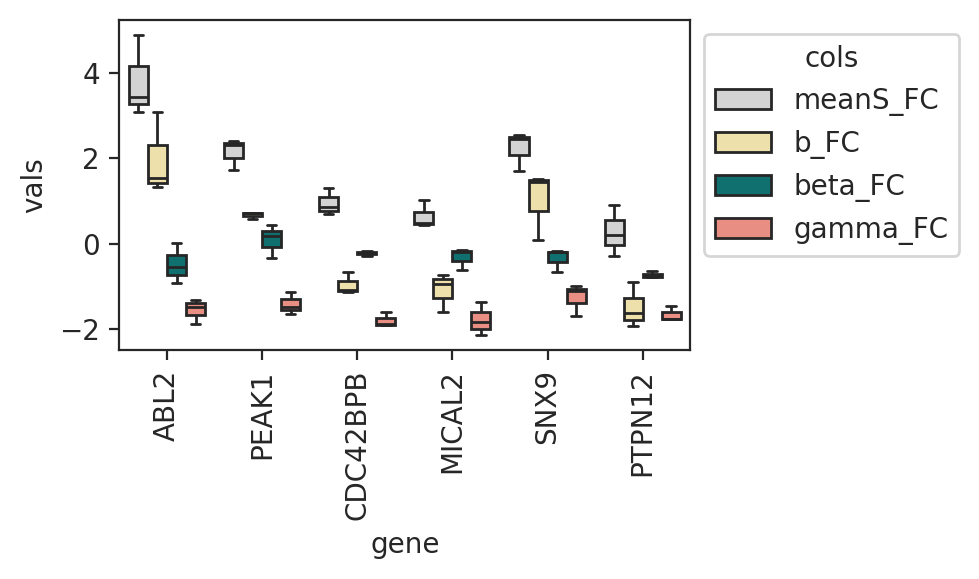

In [908]:
sub = sub_crtl[sub_crtl.gene.isin(['ABL2','PEAK1','CDC42BPB','MICAL2','SNX9' ,'PTPN12'])] #'ACACA',

sub_2 = sub [['b_FC','beta_FC','gamma_FC','meanS_FC','gene','cond']]
sub_2_m = sub_2.melt(['gene','cond'], var_name='cols', value_name='vals')
sub_2_m.head()



plt.figure(figsize=(5,3))

palette = {'meanS_FC':'lightgrey','b_FC':'#f9e79f','beta_FC':'teal','gamma_FC':'salmon','k_FC':'#c39bd3'}
ax=sns.boxplot(x='gene',y='vals',hue='cols',data=sub_2_m,dodge=True,order=['ABL2','PEAK1','CDC42BPB','MICAL2','SNX9' ,'PTPN12'],
              hue_order=['meanS_FC','b_FC','beta_FC','gamma_FC'],palette=palette,
           )  #order = ["A", "B", "C"]

sns.move_legend(ax, "upper left", bbox_to_anchor=(1, 1))
plt.xticks(rotation=90)
plt.tight_layout()
plt.savefig('actin_crtl.pdf')

In [578]:
#More actin cytoskeleton related  --> slower degradation, increased stability


for i in np.unique(sub_crtl.gene[sub_crtl.gene.isin(crtl_gamma_genes_filt) & (sub_crtl.gamma_FC < -1)]):
    print(i)
    

ABL2
ACACA
AFF1
ANKRD12
ARHGEF11
ATP9A
BCAS1
CCP110
CDC42BPB
DHX36
FAF2
IGF1R
IGF2R
ITSN1
KANSL1L
KRT7
LHFPL2
MED13L
MICAL2
MYCBP2
MYO10
NAA15
PEAK1
PPL
PTPN12
PTPRE
PUM2
RERE
SCNN1A
SNX9
TGFBR2
TMEM131
TMPRSS4
USP6NL
VGLL4
WDFY3


In [744]:
sub_crtl[sub_crtl.gene.isin(['TTC3','USP33','ARIH1','UBE2R2','WWP1','USP32'])]

,b_FC,beta_FC,gamma_FC,meanS_FC,inf_meanS_FC,k_FC,meanS_FC_low,if_k_FC,cond,gene
3131,0.805636,0.041720,1.697383,-0.769269,-0.891748,-0.869552,True,False,CRTl_Ctrl1,USP33
3461,0.824702,-0.018843,1.635534,-0.737385,-0.810832,-0.808345,True,False,CRTl_Ctrl1,ARIH1
3541,1.349989,0.264572,1.127574,0.309025,0.222415,-0.696073,True,False,CRTl_Ctrl1,USP32
3715,0.982449,0.945086,1.254705,-0.361098,-0.272256,-1.099895,True,False,CRTl_Ctrl1,TTC3
4053,-1.599307,-0.200200,1.941887,-3.458141,-3.541195,-0.870844,False,False,CRTl_Ctrl1,WWP1
4079,0.574845,0.075297,3.011473,-2.123934,-2.436627,-1.543385,False,False,CRTl_Ctrl1,UBE2R2
4161,0.087804,-0.229764,1.001465,-0.775822,-0.913661,-0.385851,True,False,CRTl_Ctrl2,USP33
4491,0.804101,0.294656,1.099000,-0.201831,-0.294899,-0.696828,True,False,CRTl_Ctrl2,ARIH1
4571,1.525800,0.731875,1.668881,-0.009186,-0.143081,-1.200378,True,False,CRTl_Ctrl2,USP32
4745,1.170297,0.880783,1.024426,0.117562,0.145872,-0.952604,True,False,CRTl_Ctrl2,TTC3


In [579]:
#Related to protein processing and modification (turnover) /regulation,  higher deg --> faster turnover
for i in np.unique(sub_crtl.gene[sub_crtl.gene.isin(crtl_gamma_genes_filt) & (sub_crtl.gamma_FC > 1)]):
    print(i)


ABI1
ALDH2
ARID4B
ARIH1
ATRX
B3GALNT2
CAPZB
CBFB
CCDC14
CDK17
CELF1
CNOT4
COA1
CUEDC1
CUL1
CUL3
CYFIP1
CYTOR
DAAM1
DHX32
DSTN
EFHD2
EPS15
EVI5
EXOC4
FAM126B
GNAQ
JAK1
KIF5B
MAPKAPK2
MTF2
N4BP1
NCOR2
NPLOC4
NPTN
PARP8
POR
PPP3CA
PTGR1
RAB11A
RBM26
SPG11
SUCO
TANK
TBCA
TSC22D2
TSPAN3
TTC3
UBE2R2
USP32
USP33
WWP1
YY1
ZBTB20
ZDHHC21
ZDHHC3
ZMYND8


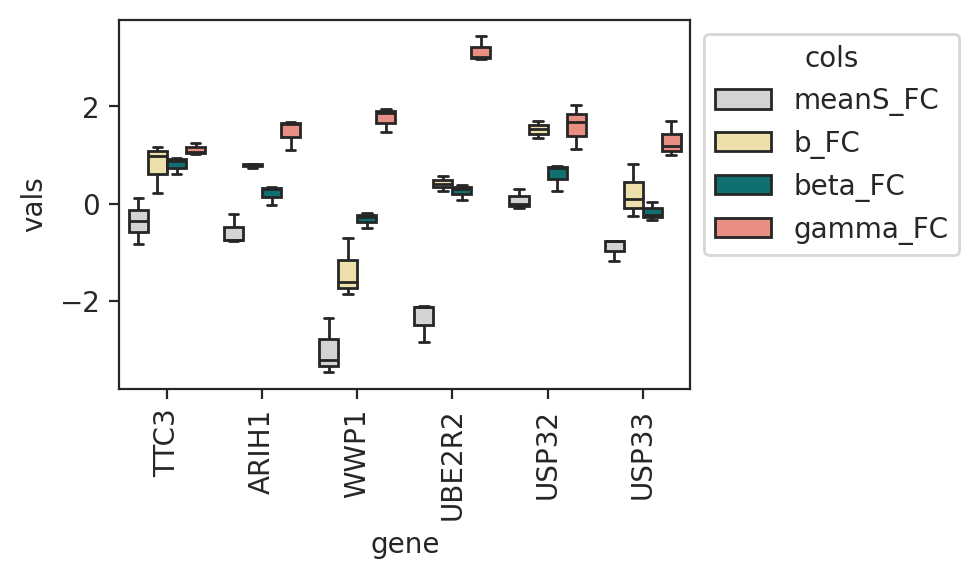

In [909]:
sub = sub_crtl[sub_crtl.gene.isin(['TTC3','ARIH1','WWP1','UBE2R2','USP32','USP33'])]

sub_2 = sub [['b_FC','beta_FC','gamma_FC','meanS_FC','gene','cond']]
sub_2_m = sub_2.melt(['gene','cond'], var_name='cols', value_name='vals')
sub_2_m.head()



plt.figure(figsize=(5,3))

palette = {'meanS_FC':'lightgrey','b_FC':'#f9e79f','beta_FC':'teal','gamma_FC':'salmon','k_FC':'#c39bd3'}
ax=sns.boxplot(x='gene',y='vals',hue='cols',data=sub_2_m,dodge=True,order=['TTC3','ARIH1','WWP1','UBE2R2','USP32','USP33'],
              hue_order=['meanS_FC','b_FC','beta_FC','gamma_FC'],palette=palette,
           )  #order = ["A", "B", "C"]

sns.move_legend(ax, "upper left", bbox_to_anchor=(1, 1))
plt.xticks(rotation=90)
plt.tight_layout()
plt.savefig('ubiq_crtl.pdf')


Look at CRT


In [537]:
#Only enrichment in 'intracellular anatomical structure' genes

for i in np.unique(sub_crt.gene[sub_crt.gene.isin(crt_gamma_genes_filt) & (sub_crt.gamma_FC > 1)]):
    print(i)
    

ABI2
AC048341.1
AGO2
ARFGAP3
ARHGEF7
ATAD2B
B3GALNT2
BICD1
CELF1
CFDP1
CSGALNACT2
DLG5
EPB41L2
FAM13A
FAM214A
FAM91A1
FNIP1
FRYL
IKBKB
ITSN2
KATNBL1
KLC1
LIPH
MBP
MCPH1
MPRIP
MROH1
MYO15B
NCK1
NDEL1
NSRP1
OXSR1
PCM1
PCMTD1
PHF14
POR
PTPN12
SESTD1
SPATS2
TANK
TBC1D2B
TMEM165
TMPRSS4
TRIM33
USP3
WDR45B
XPO6
ZNF83


In [463]:
#Angiogenesis genes
#Increased translation/efficiency promoted by 5'FU https://pmc.ncbi.nlm.nih.gov/articles/PMC8364333/#SEC4
angio = ['FZD1', 'FZD5', 'DACT1', 'MYH6', 'GNG7', 'GNG10', 'MYH6', 'SOCS6', 'GNG7', 'GNG10', 'RHOQ', 'SOCS7',
         'ACVR2B', 'NR3C1', 'MAP3K13', 'MAP4K4', 'RAP2B', 'FRK', 'MEGF9', 'RHOQ', 'FZD1', 'FZD5', 'PDGFC', 'PDGFA']
[i for i in angio if i in crtl_trans_genes]

['RHOQ', 'MAP4K4', 'RHOQ']

In [462]:
# [i for i in angio if i in crt_gamma_genes]
nrp = ['KCNJ16','ZBTB16','CTNND2','PDE3A','PDGFD','CNTN4','CFTR','FLRT2','ADCY5',
       'C6','CRISP3','RALYL','NR1H4','BCL2','ESRRG','DSCAML1']
[i for i in nrp if i in crtl_gamma_genes]

[]

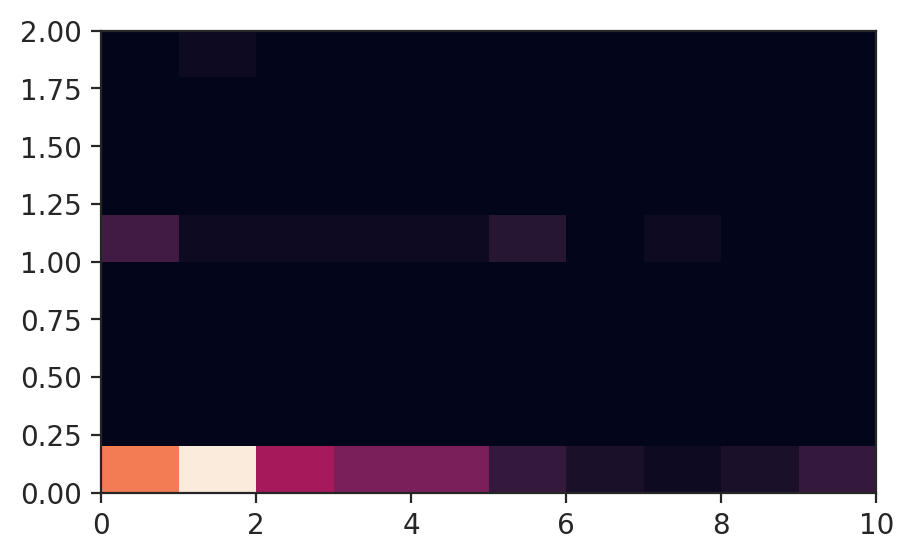

In [938]:
n = 1963
plt.figure(figsize=(5,3))
_=plt.hist2d(sd_arr[2].layers[0][n,:],sd_arr[2].layers[1][n,:])


In [937]:
np.argmax(sd_arr[2].layers[0],axis=0)

array([2018,  313, 2439, 2018,  313,    5,  313, 1647,  313, 1647, 2018,
        543, 2509, 2509, 2276, 2331, 2509, 2694, 1592, 1938, 2276, 1061,
       2018,  543, 2451, 2205,  582,  562, 2439,  313,  354,  313,  313,
       2018, 2276, 2182,  543, 2018, 2018,  354, 2921, 1061,  354,  313,
        354, 2905, 1963, 2308, 1036,  179, 1963, 2018, 1963,  697,  543,
        354, 2995,  313,  543, 1715, 1963,  610, 2439,  313, 1938, 2388,
       2308, 2439, 2018, 2509, 2254, 1112,  807, 2308, 2509,  313,  354,
        313, 2018,  543, 2205, 2439, 2018,  354, 2018, 2182, 1963,   25,
       2664, 2276,  354, 1027, 1938, 1027,  610,  543,  357, 2018,  543,
       2276, 1271, 2018,  543, 2543,  235, 2018, 2451])

In [910]:
sd_arr[0].layers[0].shape

(3000, 333)

**Genes where mean doesn't change**

How drugs affect noise in cells

**Validation of Down/Upregulation in Paper**

In [878]:
#Supp Table 2 from paper:
supp_meta = pd.read_csv('/home/tchari/metadata/supp_tab_2_pdac_hca.csv',index_col=0)
supp_meta.head()

,Cycling (S),Cycling (G2/M),MYC signaling,Adhesive,Ribosomal,Interferon signaling,TNF-NFkB signaling,Acinar-like,Classical-like,Basaloid,Squamoid,Mesenchymal,Neuroendocrine-like,Neural-like progenitor,Adhesive.1,Immunomodulatory,Myofibroblastic,Neurotropic
1,HELLS,ASPM,PVT1,LAMB3,RPS17,POU6F2,LAMC2,SYCN,PTH2R,IGF2,KRT13,COL1A2,MYL7,KCNJ16,NFATC2,SLC22A3,ADAMTS12,SCN7A
2,BRIP1,CENPE,WDR43,CD55,RPS15A,HECW2,CDH2,CLPS,SULT1C2,CST6,PSCA,SPARC,LINC00363,ZBTB16,EMP1,XKR4,CASC15,NFIA
3,DTL,TOP2A,CMSS1,EMP1,RPS23,BCAT1,ZNF365,AMY2A,ANXA10,CRYAB,KRT16,COL3A1,GCK,CTNND2,MIR222HG,ANKRD29,POSTN,C7
4,ATAD2,KIF14,PUM3,SGMS2,RPS13,IGSF1,PODXL,PLA2G1B,HEPH,CST4,AC079466.1,LUM,KCNB2,PDE3A,SAMD4A,SLCO2B1,NTM,PID1
5,FANCI,PIF1,LRPPRC,GPRC5D,RPL32,SOX5,COL22A1,CTRB2,WDR72,FBXO2,DHRS9,AEBP1,VWA5B2,PDGFD,LMNA,LAMA3,LINC01429,C1orf21


In [879]:
#Show meanS FC + std , and the other params for lit genes
nrp = supp_meta['Neural-like progenitor']

nrp_df = onesamp_fcs[onesamp_fcs.gene.isin(nrp)]
nrp_df.head()

,b_FC,beta_FC,gamma_FC,meanS_FC,inf_meanS_FC,k_FC,meanS_FC_low,if_k_FC,cond,gene
71,0.288514,-0.139664,0.088675,0.306939,0.199839,0.025494,True,False,CRT_Ctrl1,PBX1
118,-1.247070,-2.482192,-3.058827,1.942347,1.811757,2.770509,False,True,CRT_Ctrl1,PLXDC2
132,-0.640559,-2.829145,-2.470244,1.934403,1.829685,2.649694,False,True,CRT_Ctrl1,NRP1
209,1.432227,-1.488139,-1.558994,2.965430,2.991222,1.523566,False,True,CRT_Ctrl1,ZBTB16
232,-0.237584,-0.690932,-0.848753,0.600146,0.611170,0.769843,True,False,CRT_Ctrl1,ITPR2


In [880]:
crtl_k_all3 = []
crt_k_all3 = []

for g in np.unique(nrp_df.gene):
    crt_df = nrp_df[['CRT_' in i for i in nrp_df.cond]]
    crtl_df = nrp_df[['CRTl_' in i for i in nrp_df.cond]]
    crt_df = crt_df[crt_df.gene.isin([g])]
    if (np.sum(crt_df.if_k_FC)==3):
        crt_k_all3 += [g]
    if (np.sum(crtl_df.if_k_FC)==3):
        crtl_k_all3 += [g]

In [881]:
crt_k_all3

['NRP1', 'PLXDC2', 'ZBTB16']

In [882]:
crtl_k_all3

[]

In [883]:
nrp_df[nrp_df.gene.isin(['NRP1', 'PLXDC2', 'ZBTB16'])]

,b_FC,beta_FC,gamma_FC,meanS_FC,inf_meanS_FC,k_FC,meanS_FC_low,if_k_FC,cond,gene
118,-1.247070,-2.482192,-3.058827,1.942347,1.811757,2.770509,False,True,CRT_Ctrl1,PLXDC2
132,-0.640559,-2.829145,-2.470244,1.934403,1.829685,2.649694,False,True,CRT_Ctrl1,NRP1
209,1.432227,-1.488139,-1.558994,2.965430,2.991222,1.523566,False,True,CRT_Ctrl1,ZBTB16
1148,-0.171954,-4.234163,-3.687938,3.453517,3.515984,3.961050,False,True,CRT_Ctrl2,PLXDC2
1162,0.746667,-2.498589,-1.634424,2.461003,2.381091,2.066506,False,True,CRT_Ctrl2,NRP1
1239,1.354589,-2.602332,-2.593237,3.934073,3.947826,2.597785,False,True,CRT_Ctrl2,ZBTB16
2178,0.758775,-1.362039,-3.062978,3.915167,3.821753,2.212508,False,True,CRT_Ctrl3,PLXDC2
2192,1.109887,-2.297876,-1.924223,3.211514,3.034110,2.111050,False,True,CRT_Ctrl3,NRP1
2269,2.758457,-2.646799,-2.670225,5.566995,5.428682,2.658512,False,True,CRT_Ctrl3,ZBTB16
3208,0.129048,-2.274416,-1.783356,2.091079,1.912404,2.028886,False,True,CRTl_Ctrl1,PLXDC2


In [884]:
#One plot k (transcrip) or param-mod genes in crt (NRP)

#One plot b (transcrip) or param-mode genes in crtl (NRP)

In [885]:
nrp_df_k = nrp_df[nrp_df.if_k_FC]
nrp_df_notk = nrp_df[(~nrp_df.if_k_FC) & (np.abs(nrp_df.beta_FC)>1)]

In [886]:
nrp_df_notk

,b_FC,beta_FC,gamma_FC,meanS_FC,inf_meanS_FC,k_FC,meanS_FC_low,if_k_FC,cond,gene
379,0.830829,-1.261156,-0.993680,1.877967,1.824509,1.127418,False,False,CRT_Ctrl1,HOMER2
583,-0.256649,-1.402193,-0.663205,0.341579,0.406556,1.032699,True,False,CRT_Ctrl1,TNS1
1391,1.140299,-2.563152,-0.968870,2.057061,2.109168,1.766011,False,False,CRT_Ctrl2,RORA
1976,0.540480,-1.211411,-0.923335,1.527425,1.463815,1.067373,False,False,CRT_Ctrl2,RBPMS
2421,2.072875,-1.705701,0.293905,1.993392,1.778970,0.705898,False,False,CRT_Ctrl3,RORA
3222,-0.151257,-2.651879,-0.555760,0.776804,0.404503,1.603820,True,False,CRTl_Ctrl1,NRP1
3451,-0.662605,2.970070,-0.334684,0.170081,-0.327921,-1.317693,True,False,CRTl_Ctrl1,RORA
3625,0.059754,-1.278493,-0.987926,1.265304,1.047680,1.133209,False,False,CRTl_Ctrl1,IL1R1
4036,-1.616675,1.790582,0.865221,-2.548190,-2.481897,-1.327902,False,False,CRTl_Ctrl1,RBPMS
4075,-0.361425,2.034563,0.588911,-1.008457,-0.950335,-1.311737,False,False,CRTl_Ctrl1,GLIS3


In [887]:
nrp_df[nrp_df.gene.isin(['RORA', 'GLIS3', 'RBPMS'])]

,b_FC,beta_FC,gamma_FC,meanS_FC,inf_meanS_FC,k_FC,meanS_FC_low,if_k_FC,cond,gene
361,0.261811,-0.706118,0.410218,-0.096346,-0.148407,0.147950,True,False,CRT_Ctrl1,RORA
946,-0.224058,-0.537799,-0.866318,0.693177,0.642259,0.702058,True,False,CRT_Ctrl1,RBPMS
985,0.727232,-0.274628,-0.126598,0.892367,0.853831,0.200613,True,False,CRT_Ctrl1,GLIS3
1391,1.140299,-2.563152,-0.968870,2.057061,2.109168,1.766011,False,False,CRT_Ctrl2,RORA
1976,0.540480,-1.211411,-0.923335,1.527425,1.463815,1.067373,False,False,CRT_Ctrl2,RBPMS
2015,1.724910,-0.723110,-0.660720,2.448766,2.385630,0.691915,False,False,CRT_Ctrl2,GLIS3
2421,2.072875,-1.705701,0.293905,1.993392,1.778970,0.705898,False,False,CRT_Ctrl3,RORA
3006,0.754526,-0.689932,-0.302573,1.225486,1.057099,0.496253,False,False,CRT_Ctrl3,RBPMS
3045,1.234729,-0.517682,-0.947377,2.358763,2.182106,0.732529,False,False,CRT_Ctrl3,GLIS3
3451,-0.662605,2.970070,-0.334684,0.170081,-0.327921,-1.317693,True,False,CRTl_Ctrl1,RORA


In [888]:
#ONLY where k or b changed
sub_nrp_df = nrp_df[['b_FC','k_FC','meanS_FC','gene','cond']]
nrp_df_m = sub_nrp_df.melt(['gene','cond'], var_name='cols', value_name='vals')
nrp_df_m.head()


,gene,cond,cols,vals
0,PBX1,CRT_Ctrl1,b_FC,0.288514
1,PLXDC2,CRT_Ctrl1,b_FC,-1.247070
2,NRP1,CRT_Ctrl1,b_FC,-0.640559
3,ZBTB16,CRT_Ctrl1,b_FC,1.432227
4,ITPR2,CRT_Ctrl1,b_FC,-0.237584


In [889]:
#other params changed
sub_nrp_df_other = nrp_df[['b_FC','beta_FC','gamma_FC','meanS_FC','gene','cond']]
nrp_df_m_other = sub_nrp_df_other.melt(['gene','cond'], var_name='cols', value_name='vals')
nrp_df_m_other.head()


,gene,cond,cols,vals
0,PBX1,CRT_Ctrl1,b_FC,0.288514
1,PLXDC2,CRT_Ctrl1,b_FC,-1.247070
2,NRP1,CRT_Ctrl1,b_FC,-0.640559
3,ZBTB16,CRT_Ctrl1,b_FC,1.432227
4,ITPR2,CRT_Ctrl1,b_FC,-0.237584


In [890]:
trans_nrp = ['NRP1', 'PLXDC2', 'ZBTB16']
other_nrp = ['RORA', 'GLIS3',]

/tmp/ipykernel_2176339/4146050346.py:18: UserWarning: Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations
  plt.tight_layout()


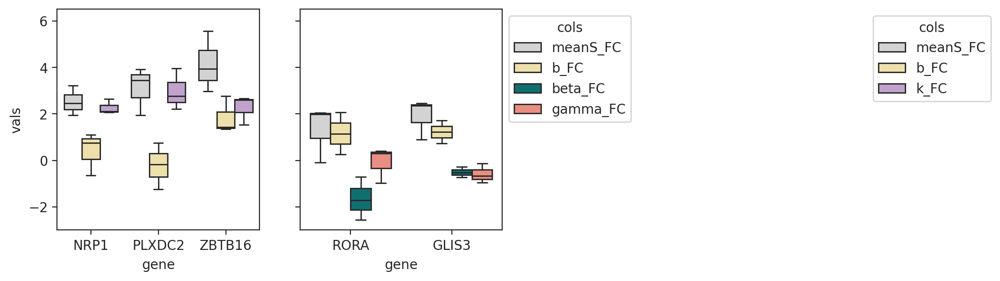

In [891]:
sub = nrp_df_m[['CRT_' in i for i in nrp_df_m.cond]]
sub2 = nrp_df_m_other[['CRT_' in i for i in nrp_df_m_other.cond]]

fig, (ax1, ax2) = plt.subplots(1, 2,figsize=(6,3),sharey=True)

palette = {'meanS_FC':'lightgrey','b_FC':'#f9e79f','beta_FC':'teal','gamma_FC':'salmon','k_FC':'#c39bd3'}
sns.boxplot(x='gene',y='vals',hue='cols',data=sub[sub.gene.isin(trans_nrp)],dodge=True,
              hue_order=['meanS_FC','b_FC','k_FC'],order=trans_nrp,palette=palette,
           ax=ax1,)  #order = ["A", "B", "C"]
ax1.set_ylim((-3,6.5))
sns.move_legend(ax1, "upper left", bbox_to_anchor=(4, 1))

sns.boxplot(x='gene',y='vals',hue='cols',data=sub2[sub2.gene.isin(other_nrp)],dodge=True,
              hue_order=['meanS_FC','b_FC','beta_FC','gamma_FC'],order=other_nrp,palette=palette,
           ax=ax2)
sns.move_legend(ax2, "upper left", bbox_to_anchor=(1, 1))
ax2.set_ylabel('')
plt.tight_layout()
plt.savefig('nrp_crt.pdf')

/tmp/ipykernel_2176339/1270544812.py:18: UserWarning: Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations
  plt.tight_layout()


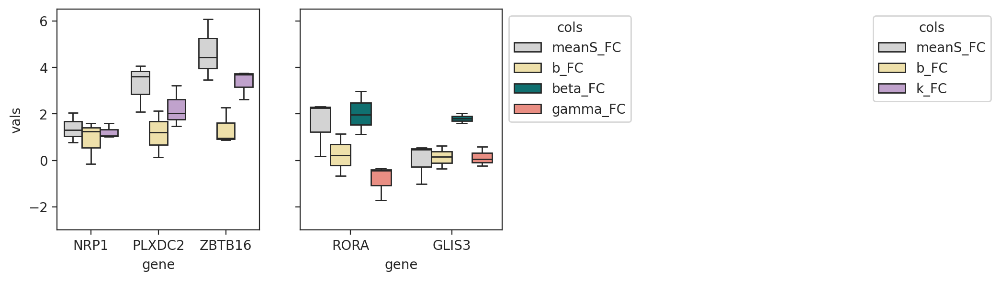

In [892]:
sub = nrp_df_m[['CRTl_' in i for i in nrp_df_m.cond]]
sub2 = nrp_df_m_other[['CRTl_' in i for i in nrp_df_m_other.cond]]

fig, (ax1, ax2) = plt.subplots(1, 2,figsize=(6,3),sharey=True)

palette = {'meanS_FC':'lightgrey','b_FC':'#f9e79f','beta_FC':'teal','gamma_FC':'salmon','k_FC':'#c39bd3'}
sns.boxplot(x='gene',y='vals',hue='cols',data=sub[sub.gene.isin(trans_nrp)],dodge=True,
              hue_order=['meanS_FC','b_FC','k_FC'],order=trans_nrp,palette=palette,
           ax=ax1,)  #order = ["A", "B", "C"]
ax1.set_ylim((-3,6.5))
sns.move_legend(ax1, "upper left", bbox_to_anchor=(4, 1))

sns.boxplot(x='gene',y='vals',hue='cols',data=sub2[sub2.gene.isin(other_nrp)],dodge=True,
              hue_order=['meanS_FC','b_FC','beta_FC','gamma_FC'],order=other_nrp,palette=palette,
           ax=ax2)
sns.move_legend(ax2, "upper left", bbox_to_anchor=(1, 1))
ax2.set_ylabel('')
plt.tight_layout()
plt.savefig('nrp_crtl.pdf')

In [255]:
#No. genes not rejected by *all* samples
caf_bool = np.array([True]*len(sr_arr[0].gene_names))
caf_inds = [i for i in range(len(pid_types_lev2)) if ('_CAF' in pid_types_lev2[i])]

for i in caf_inds:
    print(pid_types_lev2[i])
    caf_bool = caf_bool & (~sr_arr[i].rejected_genes) & (sd_arr[i].layers[1].sum(1) > 0) #no zero-sum genes

print(np.sum(caf_bool),'genes kept')

U5_CAF
U12_CAF
U14_CAF
T1_CAF
T12_CAF
T14_CAF
T17_CAF
T18_CAF
T19_CAF
305 genes kept


Correct global offset between parameters of CAF samples

In [256]:
#Set control as untreated
n_datasets = len(caf_inds)

n_genes = sr_arr[0].n_genes
n_phys_pars = sr_arr[0].sp.n_phys_pars
param_names = sr_arr[0].model.get_log_name_str()
par_vals_uncorrected = np.zeros((2,n_datasets,n_genes,n_phys_pars))

control = caf_inds[0]

for j in range(n_datasets):
    par_vals_uncorrected[0,j,:,:] = sr_arr[control].phys_optimum #control params
    par_vals_uncorrected[1,j,:,:] = sr_arr[caf_inds[j]].phys_optimum

In [257]:
#Correct offset between params, compared to control
offsets = []
par_vals = np.copy(par_vals_uncorrected)[:,:,caf_bool,:]
for k in range(n_phys_pars):
    m1 = par_vals_uncorrected[0,0,caf_bool,k]
    for j in range(n_datasets):
        m2 = par_vals_uncorrected[1,j,caf_bool,k]
        offset = diffexp_fpi(m1,m2,param_names[k],viz=False)[1]
        par_vals[1,j,:,k] -= offset

Get pseudobulk mean expression (spliced)

In [258]:
mats = []
for i in caf_inds:
    mats += [sd_arr[i].layers[1][caf_bool,:].T]
mats[0].shape

(2268, 305)

In [259]:
psbulk_means = deseq_norm(mats)
print(len(psbulk_means))
psbulk_means[0].shape

9


(305,)

**Get FCs (parameters and expression) relative to untreated**

In [272]:
np.sum(stats.false_discovery_control(stats.ttest_ind(par_vals[1,6:9,:,0],par_vals[1,0:3,:,0],equal_var=False)[1]) < 0.5)

0

In [264]:
caf_fcs = pd.DataFrame()
fc_b = []
fc_beta = []
fc_gamma = []
mean_fc = []
genes = []
conds = []
sig_b = []
sig_beta = []
sig_gamma = []
sig_mean = []

#CRT
fc_par = (np.mean(par_vals[1,3:6,:,:],axis=0) - np.mean(par_vals[1,0:3,:,:],axis=0))/np.log10(2)
fc_b +=  list(fc_par[:,0])
fc_beta += list(fc_par[:,1])
fc_gamma += list(fc_par[:,2])

m1 = (psbulk_means[3]+psbulk_means[4]+psbulk_means[5])/3
m0 = (psbulk_means[0]+psbulk_means[1]+psbulk_means[2])/3
mean_fc += list(np.log2(m1/m0))

genes += list(sr_arr[0].gene_names[caf_bool])

conds += ['CRT']*np.sum(caf_bool)

sig_b += list(stats.ttest_ind(par_vals[1,3:6,:,0],par_vals[1,0:3,:,0],equal_var=False)[1])
sig_beta += list(stats.ttest_ind(par_vals[1,3:6,:,1],par_vals[1,0:3,:,1],equal_var=False)[1])
sig_gamma += list(stats.ttest_ind(par_vals[1,3:6,:,2],par_vals[1,0:3,:,2],equal_var=False)[1])

m1_vec = [np.log10(psbulk_means[3]),np.log10(psbulk_means[4]),np.log10(psbulk_means[5])]
m0_vec = [np.log10(psbulk_means[0]),np.log10(psbulk_means[1]),np.log10(psbulk_means[2])]
sig_mean += list(stats.ttest_ind(m1_vec,m0_vec,equal_var=False)[1])

#CRTl

fc_par = (np.mean(par_vals[1,6:9,:,:],axis=0) - np.mean(par_vals[1,0:3,:,:],axis=0))/np.log10(2)
fc_b +=  list(fc_par[:,0])
fc_beta += list(fc_par[:,1])
fc_gamma += list(fc_par[:,2])

m1 = (psbulk_means[6]+psbulk_means[7]+psbulk_means[8])/3
m0 = (psbulk_means[0]+psbulk_means[1]+psbulk_means[2])/3
mean_fc += list(np.log2(m1/m0))

genes += list(sr_arr[0].gene_names[caf_bool])

conds += ['CRTl']*np.sum(caf_bool)

sig_b += list(stats.ttest_ind(par_vals[1,6:9,:,0],par_vals[1,0:3,:,0],equal_var=False)[1])
sig_beta += list(stats.ttest_ind(par_vals[1,6:9,:,1],par_vals[1,0:3,:,1],equal_var=False)[1])
sig_gamma += list(stats.ttest_ind(par_vals[1,6:9,:,2],par_vals[1,0:3,:,2],equal_var=False)[1])

m1_vec = [np.log10(psbulk_means[6]),np.log10(psbulk_means[7]),np.log10(psbulk_means[8])]
m0_vec = [np.log10(psbulk_means[0]),np.log10(psbulk_means[1]),np.log10(psbulk_means[2])]
sig_mean += list(stats.ttest_ind(m1_vec,m0_vec,equal_var=False)[1])


caf_fcs['b_FC'] = fc_b
caf_fcs['beta_FC'] = fc_beta
caf_fcs['gamma_FC'] = fc_gamma
caf_fcs['meanS_FC'] = mean_fc
caf_fcs['sigS_FC'] = sig_mean #np.abs(mean_fc) < 1
caf_fcs['sigb_FC'] = sig_b #np.abs(fc_b) > 1
caf_fcs['sigbeta_FC'] = sig_beta #np.abs(fc_beta) > 1
caf_fcs['siggamma_FC'] = sig_gamma #np.abs(fc_gamma) > 1

caf_fcs['cond'] = conds

caf_fcs['gene'] = genes
caf_fcs.head()

,b_FC,beta_FC,gamma_FC,meanS_FC,sigS_FC,sigb_FC,sigbeta_FC,siggamma_FC,cond,gene
0,-0.650187,-1.064294,-1.213504,0.650935,0.253813,0.158052,0.046891,0.121145,CRT,KIF1B
1,0.656170,0.168878,-0.620466,1.295608,0.005734,0.453607,0.794900,0.360542,CRT,UBR4
2,4.210416,1.566835,4.962339,-0.561400,0.221028,0.234329,0.481297,0.198625,CRT,CDC42
3,-1.399709,0.879899,0.357669,-1.543901,0.064841,0.220655,0.498947,0.623407,CRT,RSRP1
4,0.584405,0.222488,0.385933,0.476051,0.800939,0.694860,0.748669,0.722488,CRT,WASF2


In [281]:
sub = caf_fcs[np.abs(caf_fcs.meanS_FC) < 1]
len(sub[(sub.beta_FC >1) | (sub.b_FC >1) | (sub.gamma_FC >1)])

94

In [285]:
len(sub[(sub.sigb_FC < .1)])

38

**0-10 U1**

11-20 U5

**21-29 T2 (CRT)**

30-35 T4 (CRT)

36-42 T16 (CRTl)

**43-49 T18 (CRTl)**

### **Trends across all samples/conditions**

In [433]:
#No. genes not rejected by *all* samples
keep_bool = ~sr_arr[0].rejected_genes
for i in range(1,len(sr_arr)):
    keep_bool = keep_bool & (~sr_arr[i].rejected_genes)

print(np.sum(keep_bool),'genes kept')

213 genes kept


In [434]:
#Set control as earliest stage sample

n_genes = sr_arr[0].n_genes
n_phys_pars = sr_arr[0].sp.n_phys_pars
param_names = sr_arr[0].model.get_log_name_str()
par_vals_uncorrected = np.zeros((2,n_datasets,n_genes,n_phys_pars))

control = 0

for j in range(n_datasets):
    par_vals_uncorrected[0,j,:,:] = sr_arr[control].phys_optimum #control params
    par_vals_uncorrected[1,j,:,:] = sr_arr[j].phys_optimum

In [435]:
#Correct offset between params, compared to control

offsets = []
par_vals = np.copy(par_vals_uncorrected)[:,:,keep_bool,:]
for k in range(n_phys_pars):
    m1 = par_vals_uncorrected[0,0,keep_bool,k]
    for j in range(n_datasets):
        m2 = par_vals_uncorrected[1,j,keep_bool,k]
        offset = diffexp_fpi(m1,m2,param_names[k],viz=False)[1]
        par_vals[1,j,:,k] -= offset

/home/tchari/miniconda3/envs/py39/lib/python3.9/site-packages/scipy/stats/_distn_infrastructure.py:1988: RuntimeWarning: invalid value encountered in divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)
/home/tchari/monod/src/monod/analysis.py:724: RuntimeWarning: invalid value encountered in divide
  z = (resid - fitparams[0]) / fitparams[1]


In [436]:
par_vals[1,:,:,:].shape #condition x gene x param

(50, 213, 3)

In [437]:
all_stats = pd.DataFrame()
bs = []
betas = []
gammas = []
sigma_bs = []
sigma_betas = []
sigma_gammas = []
celltype = []
conds = []

int_mat = []
ext_mat = []
tech_mat = []

for p in range(len(pid_types_lev2)):

    bs += list(par_vals[1,p,:,0])
    betas += list(par_vals[1,p,:,1])
    gammas += list(par_vals[1,p,:,2])

    sigma_bs += list(sr_arr[p].sigma[keep_bool,0])
    sigma_betas += list(sr_arr[p].sigma[keep_bool,1])
    sigma_gammas += list(sr_arr[p].sigma[keep_bool,2])

    conds += [pid_types_lev2[p].split('_')[0]]*np.sum(keep_bool)
    celltype += [pid_types_lev2[p].split('_')[1]]*np.sum(keep_bool)

    int_mat += list(sr_arr[p].get_noise_decomp()[keep_bool,0,1])
    ext_mat += list(sr_arr[p].get_noise_decomp()[keep_bool,1,1])
    tech_mat += list(sr_arr[p].get_noise_decomp()[keep_bool,2,1])


all_stats['b'] = bs
all_stats['beta'] = betas
all_stats['gamma'] = gammas
all_stats['b_sigma'] = sigma_bs
all_stats['beta_sigma'] = sigma_betas
all_stats['gamma_sigma'] = sigma_gammas

all_stats['int_noise'] = int_mat
all_stats['ext_noise'] = ext_mat
all_stats['tech_noise'] = tech_mat

all_stats['cond'] = conds
all_stats['type'] = celltype
all_stats.head()

    

,b,beta,gamma,b_sigma,beta_sigma,gamma_sigma,int_noise,ext_noise,tech_noise,cond,type
0,2.097468,-0.509046,1.172188,0.092635,0.089288,0.125289,0.015004,0.038325,0.946672,U1,Alpha
1,2.003200,-0.539978,1.338685,0.219992,0.217059,0.248560,0.015288,0.020099,0.964612,U1,Alpha
2,2.010808,-0.586643,0.967013,0.116150,0.113395,0.137198,0.014951,0.041674,0.943374,U1,Alpha
3,1.869822,-0.509659,0.926308,0.302415,0.298875,0.313047,0.014989,0.039264,0.945747,U1,Alpha
4,2.258526,-0.253898,1.561356,0.164004,0.158500,0.197363,0.014964,0.040899,0.944137,U1,Alpha


In [438]:
sub = all_stats[~all_stats.type.isin(['Macrophage'])]
#CA_U5_CD4+ T , HCA_U5_Macrophage, HCA_T4_Ductal, HCA_T4_Macrophage, HCA_T16_Adipocyte, HCA_T16_CD8+ T, HCA_T16_Macrophage

([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16],
 [Text(0, 0, 'Alpha'),
  Text(1, 0, 'Beta'),
  Text(2, 0, 'CAF'),
  Text(3, 0, 'CD4+ T'),
  Text(4, 0, 'CD8+ T'),
  Text(5, 0, 'Ductal'),
  Text(6, 0, 'Ductal (atypical)'),
  Text(7, 0, 'Malignant'),
  Text(8, 0, 'Pericyte'),
  Text(9, 0, 'Vascular'),
  Text(10, 0, 'B'),
  Text(11, 0, 'Dendritic'),
  Text(12, 0, 'Gamma'),
  Text(13, 0, 'ADM'),
  Text(14, 0, 'Acinar'),
  Text(15, 0, 'Adipocyte'),
  Text(16, 0, 'myCAF')])

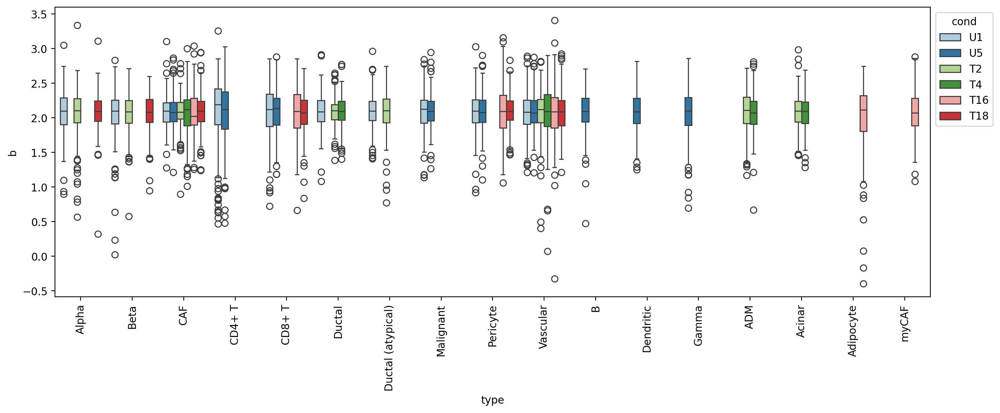

In [439]:
plt.figure(figsize=(15,5))
ax = sns.boxplot(x="type", y="b", hue="cond",
                   data=sub, palette="Paired",)
sns.move_legend(ax, "upper left", bbox_to_anchor=(1, 1))
plt.xticks(rotation=90)

([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16],
 [Text(0, 0, 'Alpha'),
  Text(1, 0, 'Beta'),
  Text(2, 0, 'CAF'),
  Text(3, 0, 'CD4+ T'),
  Text(4, 0, 'CD8+ T'),
  Text(5, 0, 'Ductal'),
  Text(6, 0, 'Ductal (atypical)'),
  Text(7, 0, 'Malignant'),
  Text(8, 0, 'Pericyte'),
  Text(9, 0, 'Vascular'),
  Text(10, 0, 'B'),
  Text(11, 0, 'Dendritic'),
  Text(12, 0, 'Gamma'),
  Text(13, 0, 'ADM'),
  Text(14, 0, 'Acinar'),
  Text(15, 0, 'Adipocyte'),
  Text(16, 0, 'myCAF')])

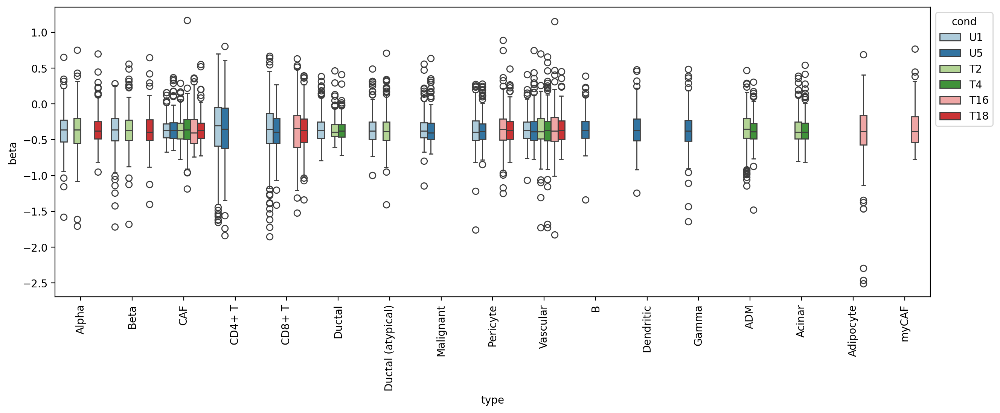

In [440]:
plt.figure(figsize=(15,5))
ax = sns.boxplot(x="type", y="beta", hue="cond",
                   data=sub, palette="Paired",)
sns.move_legend(ax, "upper left", bbox_to_anchor=(1, 1))
plt.xticks(rotation=90)

([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16],
 [Text(0, 0, 'Alpha'),
  Text(1, 0, 'Beta'),
  Text(2, 0, 'CAF'),
  Text(3, 0, 'CD4+ T'),
  Text(4, 0, 'CD8+ T'),
  Text(5, 0, 'Ductal'),
  Text(6, 0, 'Ductal (atypical)'),
  Text(7, 0, 'Malignant'),
  Text(8, 0, 'Pericyte'),
  Text(9, 0, 'Vascular'),
  Text(10, 0, 'B'),
  Text(11, 0, 'Dendritic'),
  Text(12, 0, 'Gamma'),
  Text(13, 0, 'ADM'),
  Text(14, 0, 'Acinar'),
  Text(15, 0, 'Adipocyte'),
  Text(16, 0, 'myCAF')])

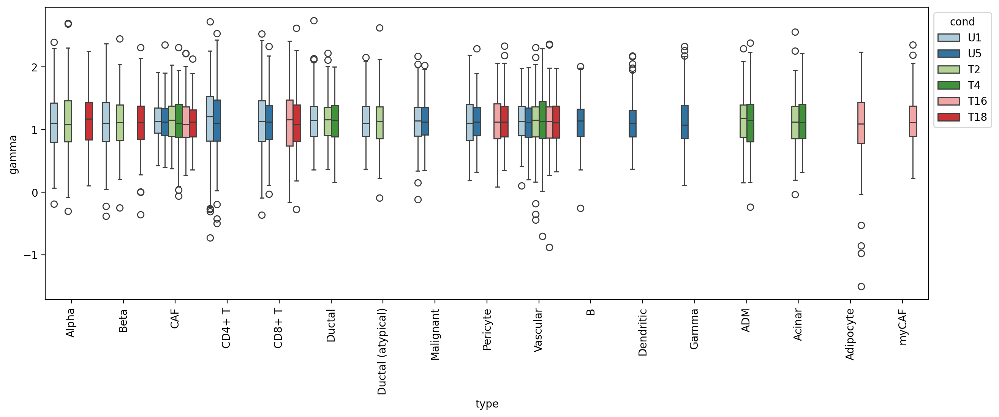

In [441]:
plt.figure(figsize=(15,5))
ax = sns.boxplot(x="type", y="gamma", hue="cond",
                   data=sub, palette="Paired",)
sns.move_legend(ax, "upper left", bbox_to_anchor=(1, 1))
plt.xticks(rotation=90)

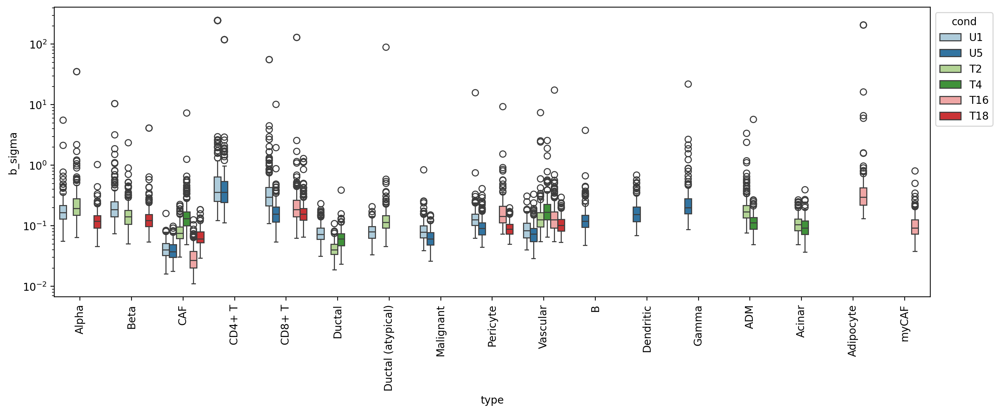

In [442]:
plt.figure(figsize=(15,5))
ax = sns.boxplot(x="type", y="b_sigma", hue="cond",
                   data=sub, palette="Paired",)
sns.move_legend(ax, "upper left", bbox_to_anchor=(1, 1))
plt.xticks(rotation=90)
plt.yscale('log')

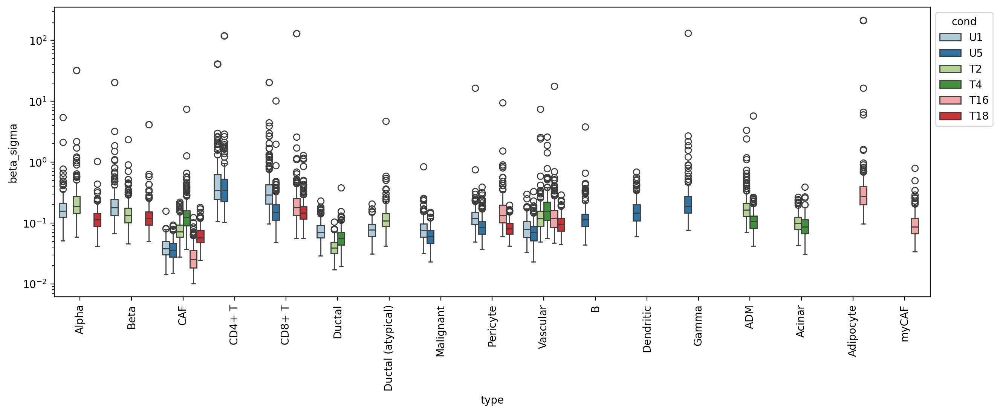

In [443]:
plt.figure(figsize=(15,5))
ax = sns.boxplot(x="type", y="beta_sigma", hue="cond",
                   data=sub, palette="Paired",)
sns.move_legend(ax, "upper left", bbox_to_anchor=(1, 1))
plt.xticks(rotation=90)
plt.yscale('log')

In [444]:
sr_arr[0].get_noise_decomp().shape

(3000, 3, 2)

In [445]:
#CAF, CD8+ T, Malignant, Ductal
sub['ratio_noise'] = (sub['int_noise']+sub['ext_noise']) #/(sub['int_noise']+sub['ext_noise']+sub['tech_noise'])

/tmp/ipykernel_779060/655109183.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  sub['ratio_noise'] = (sub['int_noise']+sub['ext_noise']) #/(sub['int_noise']+sub['ext_noise']+sub['tech_noise'])


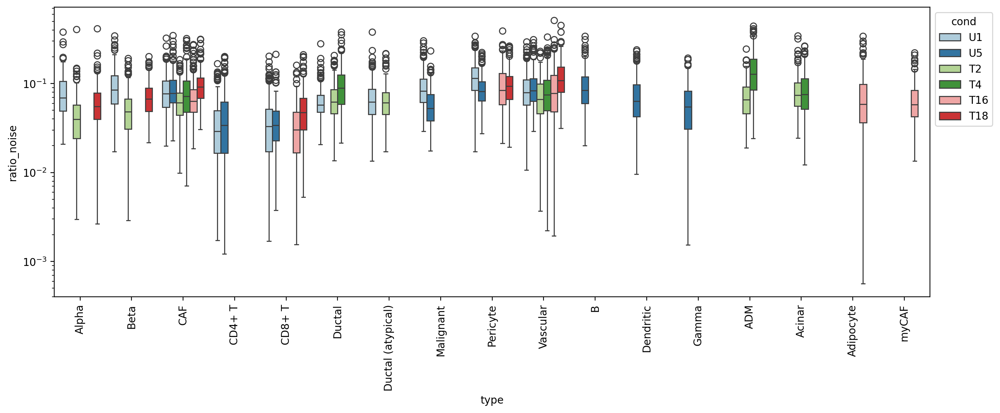

In [446]:
plt.figure(figsize=(15,5))
ax = sns.boxplot(x="type", y="ratio_noise", hue="cond",
                   data=sub, palette="Paired",)
sns.move_legend(ax, "upper left", bbox_to_anchor=(1, 1))
plt.xticks(rotation=90)
plt.yscale('log')

### **Understanding mechanistic effects of drug/treament**
- Malignant, CAF, CD8+ in untreated vs treated  (start with CAF, run Other data for malignant)

- New gene filter + offset correction 

- Which had no mean change

**CAF**

In [363]:
#No. genes not rejected by *all* samples
CAF_bool = np.array([True]*len(sr_arr[0].gene_names))
CAF_inds = [i for i in range(len(pid_types_lev2)) if ('_CAF' in pid_types_lev2[i])]

for i in CAF_inds:
    print(pid_types_lev2[i])
    CAF_bool = CAF_bool & (~sr_arr[i].rejected_genes)

print(np.sum(CAF_bool),'genes kept')

U1_CAF
U5_CAF
T2_CAF
T4_CAF
T16_CAF
T18_CAF
2033 genes kept


In [365]:
#Correct offset between params, compared to control
caf_ctrl = 2

offsets = []
par_vals_caf = np.copy(par_vals_uncorrected)[:,:,CAF_bool,:]
for k in range(n_phys_pars):
    m1 = par_vals_uncorrected[1,caf_ctrl,CAF_bool,k]
    for j in range(n_datasets):
        if j != caf_ctrl:
            m2 = par_vals_uncorrected[1,j,CAF_bool,k]
            offset = diffexp_fpi(m1,m2,param_names[k],viz=False)[1]
            par_vals_caf[1,j,:,k] -= offset

In [366]:
caf_par_vals = par_vals_caf[1,['_CAF' in i for i in pid_types_lev2],:,:]
caf_par_vals.shape

(6, 2033, 3)

In [194]:
# caf_par_vals = caf_par_vals[:,CAF_bool,:]
# caf_par_vals.shape

(6, 2033, 3)

In [367]:
#Get log2FCs relative to U1: save Gene, log2FC_b..., log2FC_s, Condition 
caf_fcs = pd.DataFrame()
genes = []
fc_b = []
fc_beta = []
fc_gamma = []
fc_s = []
conds = []

u1_ctrl = caf_par_vals[0,:,:]
u1_ctrl_sd = sd_arr[CAF_inds[0]]
for i in range(1,caf_par_vals.shape[0]):
    fc_par = ((caf_par_vals[i,:,:]-u1_ctrl)/np.log10(2))
    fc_b += list(fc_par[:,0])
    fc_beta += list(fc_par[:,1])
    fc_gamma += list(fc_par[:,2])

    fc_s += list(np.log2(sd_arr[CAF_inds[i]].layers[1].mean(1)/u1_ctrl_sd.layers[1].mean(1))[CAF_bool])

    genes += list(sr_arr[0].gene_names[CAF_bool])
    conds += [pid_types_lev2[CAF_inds[i]]]*np.sum(CAF_bool)

caf_fcs['b_FC'] = fc_b
caf_fcs['beta_FC'] = fc_beta
caf_fcs['gamma_FC'] = fc_gamma
caf_fcs['mat_FC'] = fc_s
caf_fcs['cond'] = conds
caf_fcs['gene'] = genes

caf_fcs.head()

/tmp/ipykernel_779060/543851392.py:18: RuntimeWarning: divide by zero encountered in divide
  fc_s += list(np.log2(sd_arr[CAF_inds[i]].layers[1].mean(1)/u1_ctrl_sd.layers[1].mean(1))[CAF_bool])
/tmp/ipykernel_779060/543851392.py:18: RuntimeWarning: invalid value encountered in divide
  fc_s += list(np.log2(sd_arr[CAF_inds[i]].layers[1].mean(1)/u1_ctrl_sd.layers[1].mean(1))[CAF_bool])
/tmp/ipykernel_779060/543851392.py:18: RuntimeWarning: divide by zero encountered in log2
  fc_s += list(np.log2(sd_arr[CAF_inds[i]].layers[1].mean(1)/u1_ctrl_sd.layers[1].mean(1))[CAF_bool])


,b_FC,beta_FC,gamma_FC,mat_FC,cond,gene
0,0.270466,0.266435,-0.516788,0.627278,U5_CAF,GNB1
1,-0.107192,0.067522,-0.190063,-0.078808,U5_CAF,RERE
2,0.762026,-0.266000,-0.796640,1.436652,U5_CAF,MIR34AHG
3,0.196692,0.509377,0.676241,-0.616787,U5_CAF,CLSTN1
4,0.415612,0.314621,0.430796,-0.163758,U5_CAF,KIF1B


([0, 1, 2, 3, 4],
 [Text(0, 0, 'U5_CAF'),
  Text(1, 0, 'T2_CAF'),
  Text(2, 0, 'T4_CAF'),
  Text(3, 0, 'T16_CAF'),
  Text(4, 0, 'T18_CAF')])

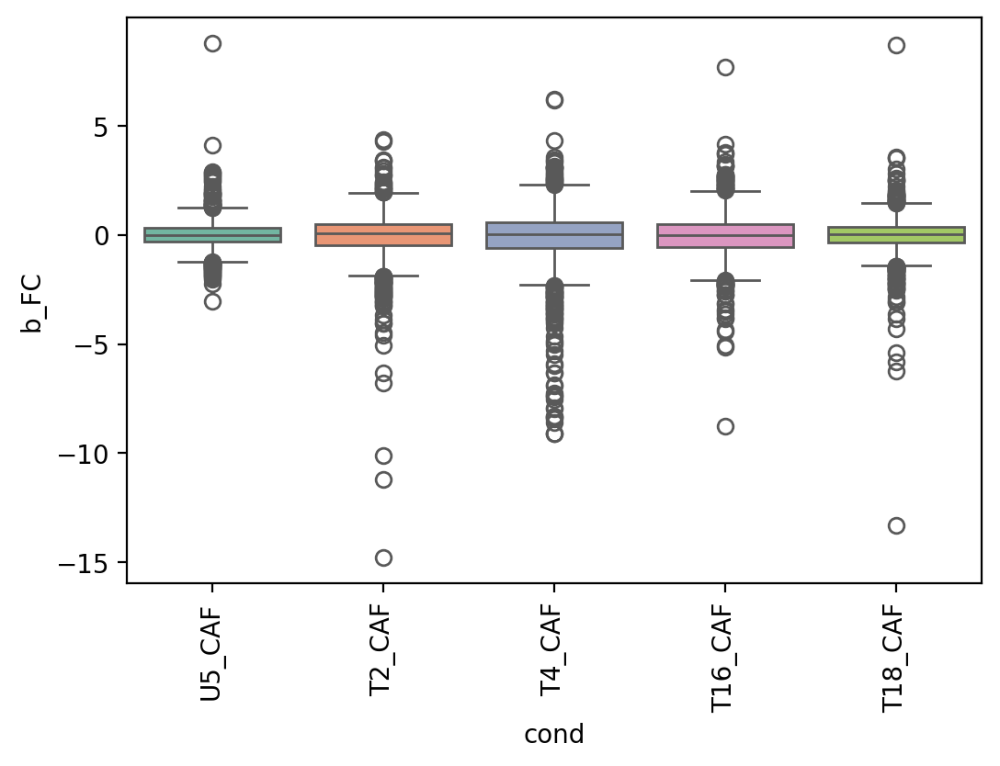

In [368]:
plt.figure(figsize=(6,4))
ax = sns.boxplot(x="cond", y="b_FC",hue="cond",
                   data=caf_fcs, palette="Set2",)
#sns.move_legend(ax, "upper left", bbox_to_anchor=(1, 1))
plt.xticks(rotation=90)
#plt.yscale('log')

([0, 1, 2, 3, 4],
 [Text(0, 0, 'U5_CAF'),
  Text(1, 0, 'T2_CAF'),
  Text(2, 0, 'T4_CAF'),
  Text(3, 0, 'T16_CAF'),
  Text(4, 0, 'T18_CAF')])

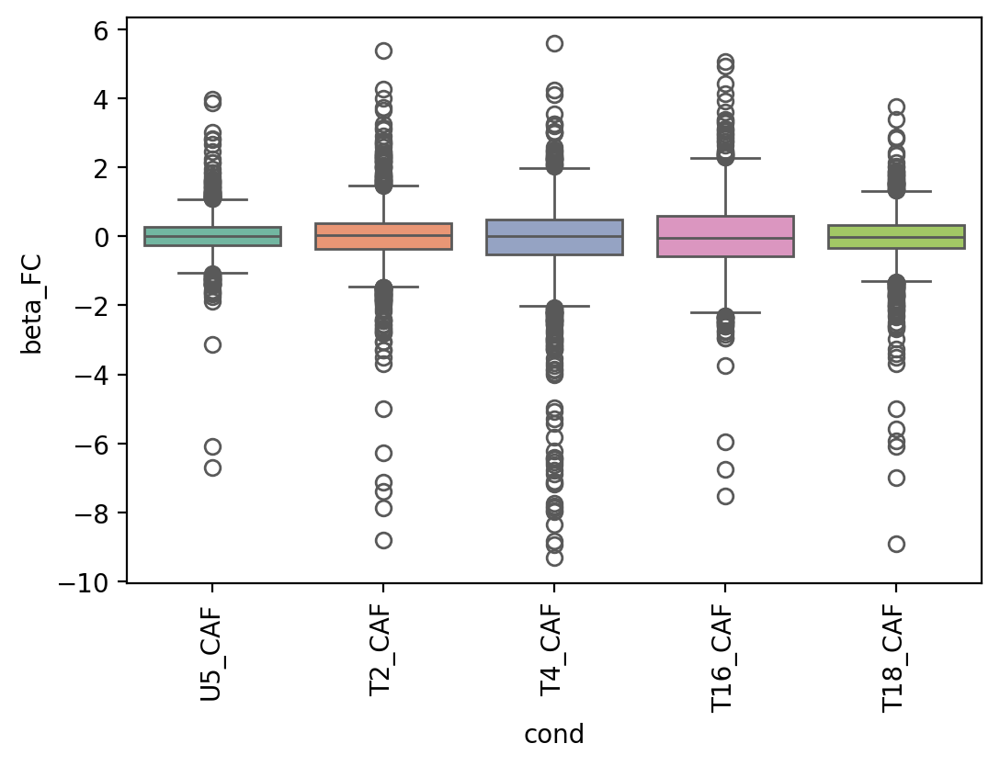

In [395]:
plt.figure(figsize=(6,4))
ax = sns.boxplot(x="cond", y="beta_FC",hue="cond",
                   data=caf_fcs, palette="Set2",)
#sns.move_legend(ax, "upper left", bbox_to_anchor=(1, 1))
plt.xticks(rotation=90)
#plt.yscale('log')

([0, 1, 2, 3, 4],
 [Text(0, 0, 'U5_CAF'),
  Text(1, 0, 'T2_CAF'),
  Text(2, 0, 'T4_CAF'),
  Text(3, 0, 'T16_CAF'),
  Text(4, 0, 'T18_CAF')])

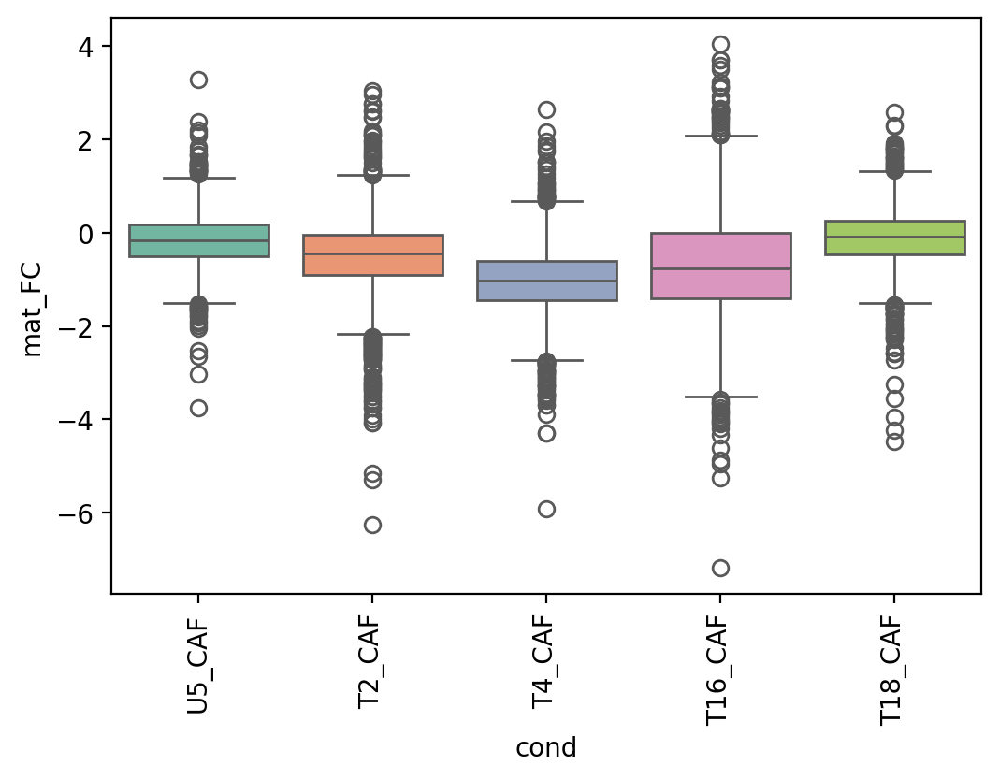

In [370]:
plt.figure(figsize=(6,4))
ax = sns.boxplot(x="cond", y="mat_FC",hue="cond",
                   data=caf_fcs, palette="Set2",)
#sns.move_legend(ax, "upper left", bbox_to_anchor=(1, 1)) # *** ---> Does this mean comparison make sense if I've corrected for offset?
plt.xticks(rotation=90)
#plt.yscale('log')

In [371]:
#nrp = ['NTN4', 'CTNND2', 'NRXN3', 'RELN', 'SEMA5A', 'NRCAM','AUTS2']
#From Supp Table 2
#myo = ['ACTA2', 'RUNX1', 'RUNX2', 'LEF1', 'SALL4', 'WNT5A', 'NKD1','FOXP1']
adh_top10 = ['NFATC2','EMP1','MIR222HG','SAMD4A','LMNA','GPRC5A','MMP19',
'MEDAG','NFATC1','TSC22D2','LRRFIP1'] #Increased in CRT
myo_top10 = ['ADAMTS12','CASC15','POSTN','NTM','LINC01429',
'NREP','PDGFC','LEF1','NUAK1','COL1A1','KIF26B'] #Lower in CRT


([0, 1, 2, 3, 4, 5, 6],
 [Text(0, 0, 'LMNA'),
  Text(1, 0, 'GPRC5A'),
  Text(2, 0, 'MEDAG'),
  Text(3, 0, 'SAMD4A'),
  Text(4, 0, 'NFATC1'),
  Text(5, 0, 'LRRFIP1'),
  Text(6, 0, 'TSC22D2')])

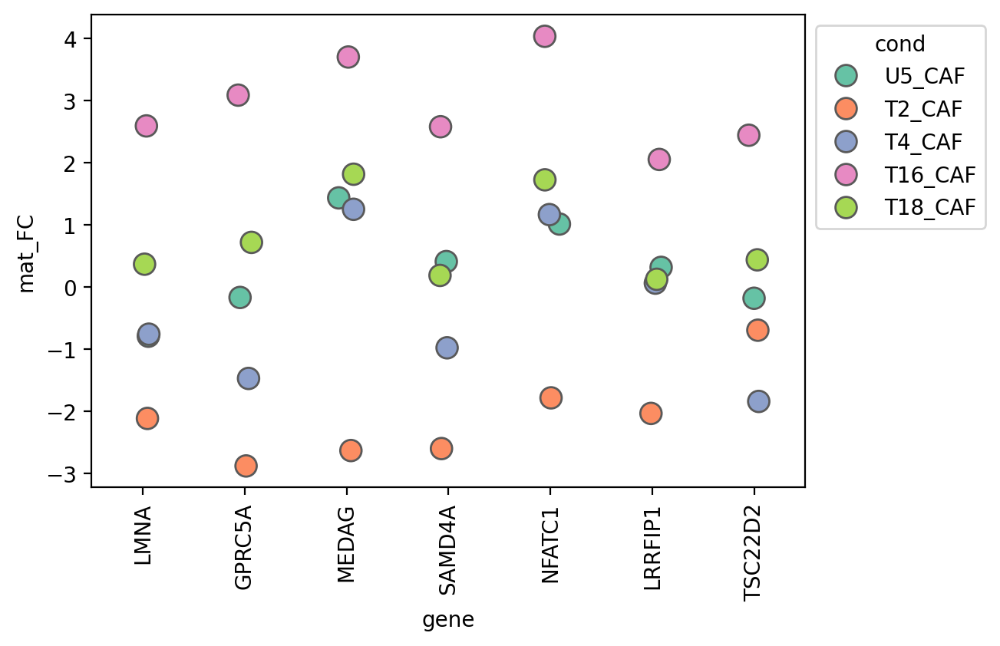

In [372]:
sub = caf_fcs[caf_fcs.gene.isin(adh_top10)]

plt.figure(figsize=(6,4))
ax = sns.stripplot(x="gene", y="mat_FC",hue="cond",
                   data=sub, palette="Set2",s=10,linewidth=1)
sns.move_legend(ax, "upper left", bbox_to_anchor=(1, 1))
plt.xticks(rotation=90)

([0, 1, 2, 3, 4],
 [Text(0, 0, 'NTM'),
  Text(1, 0, 'NUAK1'),
  Text(2, 0, 'LEF1'),
  Text(3, 0, 'NREP'),
  Text(4, 0, 'CASC15')])

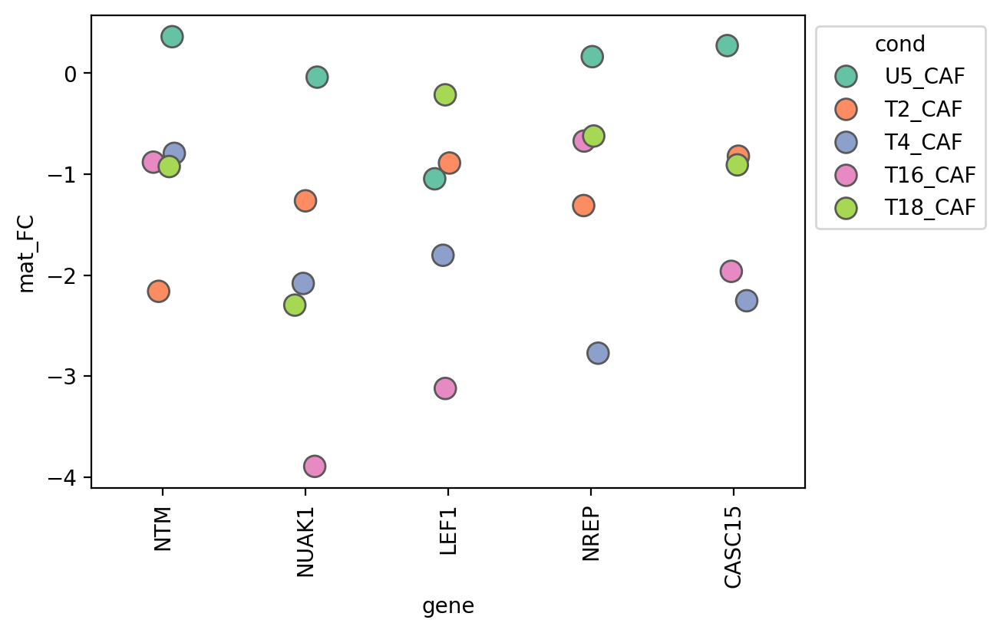

In [373]:
sub = caf_fcs[caf_fcs.gene.isin(myo_top10)]

plt.figure(figsize=(6,4))
ax = sns.stripplot(x="gene", y="mat_FC",hue="cond",linewidth=1,
                   data=sub, palette="Set2",s=10)
sns.move_legend(ax, "upper left", bbox_to_anchor=(1, 1))
plt.xticks(rotation=90)

/tmp/ipykernel_779060/1988045295.py:2: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.scatterplot(x='beta_FC',y='gamma_FC',


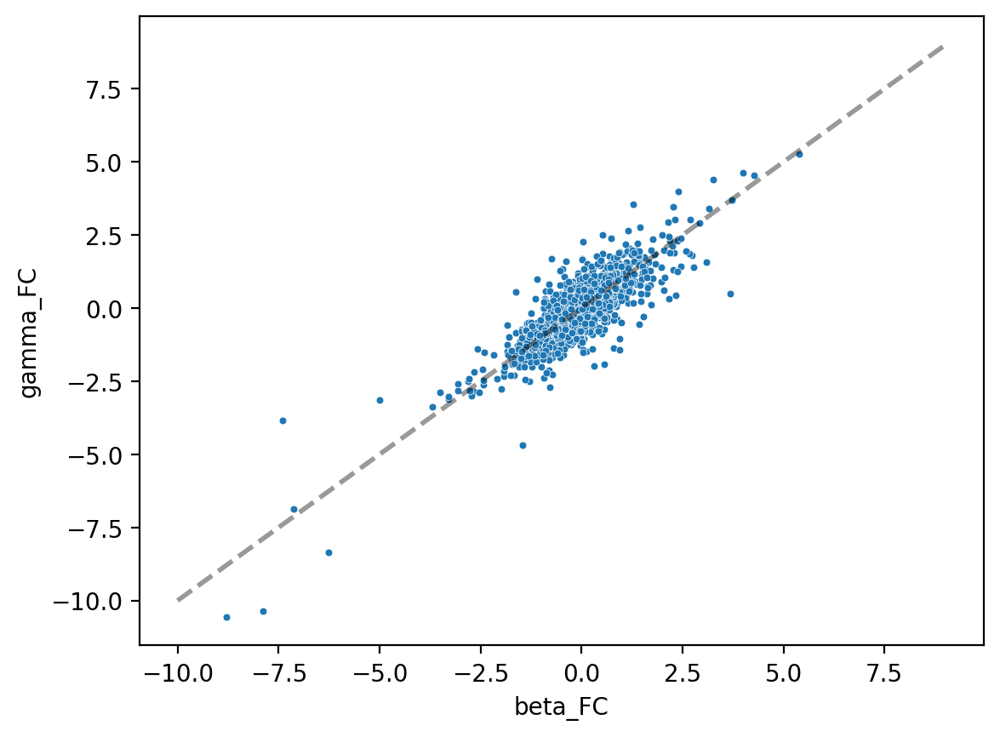

In [374]:
sub = caf_fcs[caf_fcs.cond.isin(['T2_CAF'])]
sns.scatterplot(x='beta_FC',y='gamma_FC',
                data=sub, palette="Set2",s=10)
plt.plot(range(-10,10),range(-10,10),color='black',linestyle='--',alpha=0.4,linewidth=2)

/tmp/ipykernel_779060/881396632.py:2: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.scatterplot(x='b_FC',y='gamma_FC',


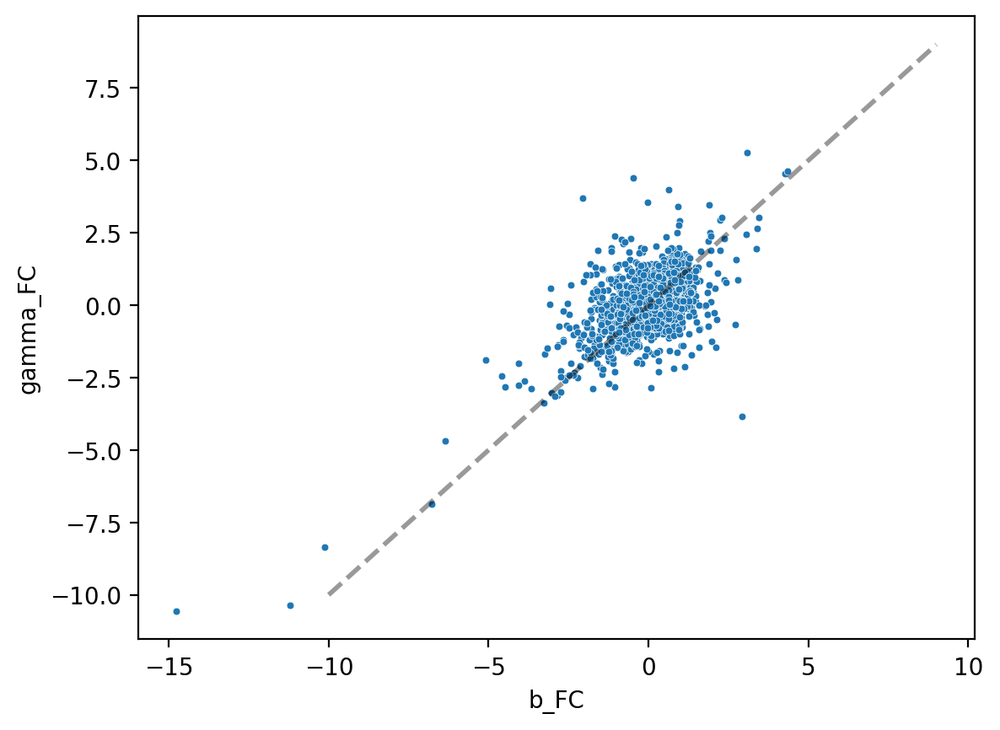

In [375]:
sub = caf_fcs[caf_fcs.cond.isin(['T2_CAF'])]
sns.scatterplot(x='b_FC',y='gamma_FC',
                data=sub, palette="Set2",s=10)
plt.plot(range(-10,10),range(-10,10),color='black',linestyle='--',alpha=0.4,linewidth=2)

Which param has most 'large' FCs under treatment (T2,T4 for now)

<BarContainer object of 3 artists>

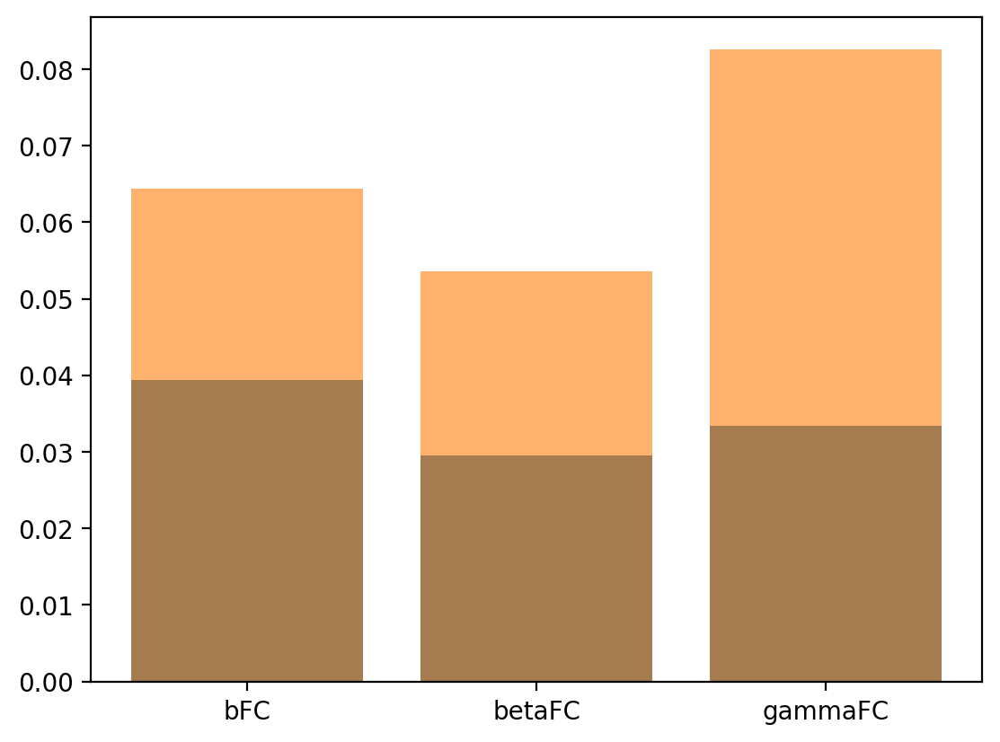

In [376]:

thresh = 2
sub_crt_t2 = caf_fcs[caf_fcs.cond.isin(['T2_CAF'])]
bFC_T2 = np.sum(np.abs(sub_crt_t2.b_FC)>thresh)/np.sum(CAF_bool)
betaFC_T2 = np.sum(np.abs(sub_crt_t2.beta_FC)>thresh)/np.sum(CAF_bool)
gammaFC_T2 = np.sum(np.abs(sub_crt_t2.gamma_FC)>thresh)/np.sum(CAF_bool)

sub_crt_t4 = caf_fcs[caf_fcs.cond.isin(['T4_CAF'])]
bFC_T4 = np.sum(np.abs(sub_crt_t4.b_FC)>thresh)/np.sum(CAF_bool)
betaFC_T4 = np.sum(np.abs(sub_crt_t4.beta_FC)>thresh)/np.sum(CAF_bool)
gammaFC_T4 = np.sum(np.abs(sub_crt_t4.gamma_FC)>thresh)/np.sum(CAF_bool)



plt.bar(x=['bFC','betaFC','gammaFC'],height=[bFC_T2,betaFC_T2,gammaFC_T2])
plt.bar(x=['bFC','betaFC','gammaFC'],height=[bFC_T4,betaFC_T4,gammaFC_T4],alpha=0.6)



<BarContainer object of 3 artists>

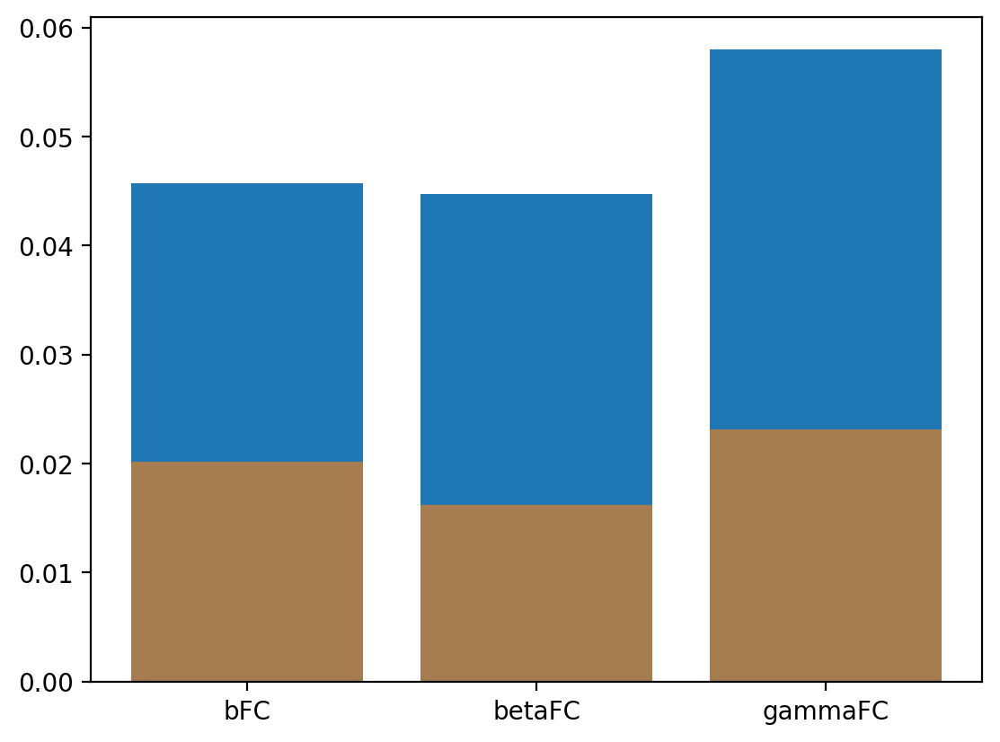

In [377]:
#Which param has most 'large' FCs under treatment CRTl

sub_crt_t16 = caf_fcs[caf_fcs.cond.isin(['T16_CAF'])]
bFC_T16 = np.sum(np.abs(sub_crt_t16.b_FC)>thresh)/np.sum(CAF_bool)
betaFC_T16 = np.sum(np.abs(sub_crt_t16.beta_FC)>thresh)/np.sum(CAF_bool)
gammaFC_T16 = np.sum(np.abs(sub_crt_t16.gamma_FC)>thresh)/np.sum(CAF_bool)

sub_crt_t18 = caf_fcs[caf_fcs.cond.isin(['T18_CAF'])]
bFC_T18 = np.sum(np.abs(sub_crt_t18.b_FC)>thresh)/np.sum(CAF_bool)
betaFC_T18 = np.sum(np.abs(sub_crt_t18.beta_FC)>thresh)/np.sum(CAF_bool)
gammaFC_T18 = np.sum(np.abs(sub_crt_t18.gamma_FC)>thresh)/np.sum(CAF_bool)



plt.bar(x=['bFC','betaFC','gammaFC'],height=[bFC_T16,betaFC_T16,gammaFC_T16])
plt.bar(x=['bFC','betaFC','gammaFC'],height=[bFC_T18,betaFC_T18,gammaFC_T18],alpha=0.6)



In [397]:
#GSEA of top bFC and kFC genes (+ and - FC)


#For each gene, if bFC is big and other FCs smaller, or beta/gamma change together and > b, or gamma biggest
p_thresh = 2
top_param = []
for i in range(len(caf_fcs)): 
    df = caf_fcs.iloc[i]
    if (np.abs(df.b_FC)>p_thresh) & (np.abs(df.b_FC)>np.abs(df.beta_FC)) & (np.abs(df.b_FC)>np.abs(df.gamma_FC)):
        top_param += ['b']
    elif ((df.beta_FC > p_thresh) & (df.gamma_FC> p_thresh)) | ((df.beta_FC < -1*p_thresh) & (df.gamma_FC< -1*p_thresh)):
        #if ((df.beta_FC/df.gamma_FC) < 1.2) & ((df.beta_FC/df.gamma_FC) > 0.8):
        #beta gamma change together
        top_param += ['k']
    elif (np.abs(df.gamma_FC)>p_thresh) & (np.abs(df.gamma_FC)>np.abs(df.beta_FC)) & (np.abs(df.gamma_FC)>np.abs(df.b_FC)):
        top_param += ['gamma']
    else:
        top_param += ['NA']

caf_fcs['top_param'] = top_param
caf_fcs

,b_FC,beta_FC,gamma_FC,mat_FC,cond,gene,top_param
0,0.270466,0.266435,-0.516788,0.627278,U5_CAF,GNB1,NA
1,-0.107192,0.067522,-0.190063,-0.078808,U5_CAF,RERE,NA
2,0.762026,-0.266000,-0.796640,1.436652,U5_CAF,MIR34AHG,NA
3,0.196692,0.509377,0.676241,-0.616787,U5_CAF,CLSTN1,NA
4,0.415612,0.314621,0.430796,-0.163758,U5_CAF,KIF1B,NA
...,...,...,...,...,...,...,...
10160,0.079781,-0.970242,-0.751798,0.728198,T18_CAF,FHL1,NA
10161,-0.219461,-0.172228,-0.582428,0.253675,T18_CAF,RBMX,NA
10162,-0.406285,0.178200,-0.322471,-0.174355,T18_CAF,MECP2,NA
10163,3.492454,-5.570261,-3.881755,inf,T18_CAF,DDX3Y,k


In [379]:
caf_fcs[caf_fcs['gene'].isin(['IGF1R'])]

,b_FC,beta_FC,gamma_FC,mat_FC,cond,gene,top_param
753,0.480313,0.572298,0.417386,-0.107141,U5_CAF,IGF1R,NA
2786,0.364624,0.637235,0.890479,-1.057226,T2_CAF,IGF1R,NA
4819,0.879319,0.605930,0.600021,-0.700957,T4_CAF,IGF1R,NA
6852,1.449524,-0.008990,0.762034,-0.010942,T16_CAF,IGF1R,NA
8885,0.583252,-0.300908,-0.554024,1.060718,T18_CAF,IGF1R,NA


**Files for GO analysis**

https://geneontology.org/

In [398]:
conds_tocheck = ['T2_CAF','T4_CAF','T16_CAF','T18_CAF']

for c in conds_tocheck:
    for p in [['b','k'],['gamma']]:
        caf_fcs['gene'][caf_fcs['top_param'].isin(p) & caf_fcs['cond'].isin([c])].to_csv(c+'_'+'_'.join(p)+'_forGO2.csv',index=None)
        print(c+'_'+'_'.join(p)+'_forGO2.csv')

T2_CAF_b_k_forGO2.csv
T2_CAF_gamma_forGO2.csv
T4_CAF_b_k_forGO2.csv
T4_CAF_gamma_forGO2.csv
T16_CAF_b_k_forGO2.csv
T16_CAF_gamma_forGO2.csv
T18_CAF_b_k_forGO2.csv
T18_CAF_gamma_forGO2.csv


In [399]:
!cat T2_CAF_b_k_forGO2.csv

gene
MIR34AHG
CLIC4
STX12
BMP8A
CAP1
OSBPL9
F3
VCAM1
ATP1A1
S100A10
LMNA
SLC19A2
ENAH
RYR2
FRMD4A
CCDC186
CACUL1
LDHA
ZBTB16
CDON
ETS1
CD163
FGD4
NCKAP5L
NR4A1
IGFBP6
ATP2A2
NAA25
PTPN11
ADGRD1
ANKLE2
RPL21
SLC46A3
FOXO1
RGCC
EFNB2
UPF3A
ANXA2
CTSH
COG4
PER1
LAMA3
SMAD7
NFATC1
ITPKC
PLAUR
ERCC1
ST3GAL5
KYNU
RND3
FASTKD1
PGAP1
PER2
STK35
SAMHD1
PDXK
ANKRD28
SLC12A8
ATP1B3
TIPARP
PPARGC1A
SLC4A4
SPARCL1
NPNT
PDLIM3
ITGA2
GRAMD2B
CLTB
NEDD9
FLOT1
FKBP5
ENPP1
TNFAIP3
CNKSR3
THSD7A
COBL
CD36
STEAP4
CFAP69
PRKRIP1
CADPS2
SLC25A37
RDH10
ZFAND5
ANXA1
PAPPA
CDKL5
OGT
DDX3Y
KDM5D


In [401]:
!cat T4_CAF_b_k_forGO2.csv

gene
RCC2
USP48
EPB41
AGO4
PTCH2
PATJ
KANK4
ZRANB2
VCAM1
IL6R
MGST3
DENND1B
WDR26
OPTN
MRC1
ANK3
COL13A1
NUTM2B-AS1
SLF2
LGR4
QSER1
AP002495.1
WNT11
CEP57
SORL1
KDM5A
CD163
KIF21A
SLC38A2
NR4A1
IGFBP6
LRIG3
ZDHHC17
RIC8B
TBX3
ANAPC5
RPL21
SLC46A3
NHLRC3
TDRD3
KLF5
ARHGEF7
LGALS3
GPATCH2L
VASH1
CATSPERB
MGA
RAB27A
MORF4L1
CTSH
ABAT
RBL2
CMC2
CPD
CEP95
MYO15B
USP14
DTNA
COL5A3
DNMT1
CACNA1A
GRAMD1A
GREB1
CYP1B1
AFTPH
GFPT1
CYTOR
ARID5A
WDR33
UBXN4
KYNU
NR4A2
SLC39A10
CLK1
CYP20A1
PIKFYVE
IKZF2
IGFBP5
PER2
RASSF2
RBM39
DIDO1
RCAN1
HMGXB4
SLC6A6
SH3BP5
ADAMTS9
FRMD4B
BBX
DZIP3
ITGB5
CDV3
U2SURP
CCDC50
SLC4A4
SPRY1
GUCY1A1
C6
ADAMTS6
RASGRF2
GRAMD2B
DDX46
TGFBI
HSPA9
CRYBG1
AMD1
RNASET2
SUN1
ICA1
THSD7A
BZW2
ITGB8
MINDY4
SFRP4
DMTF1
PON2
BCAP29
LINC00513
LZTS1
LOXL2
SLC25A37
IKBKB
PDE7A
RIMS2
HAS2
CCN4
WASHC1
NFIL3
COL15A1
PDK3
GK
SLC16A2
FHL1
DDX3Y


In [402]:
!cat T16_CAF_b_k_forGO2.csv

gene
BMP8A
PTCH2
S100A10
IL6R
LMNA
ATP1B1
SOX13
CAPN2
COL13A1
ADAMTS14
PTEN
ACTA2
HECTD2
C11orf58
LDHA
P4HA3
BCO2
OAF
GPRC5A
SLC16A7
MDM2
NT5DC3
NUAK1
CRY1
ANAPC5
RPL21
MEDAG
HSPH1
NHLRC3
KLF5
EFNB2
UPF3A
SAMD4A
PAPLN
LTBP2
VASH1
MEG3
GREM1
FMN1
UBE2I
TMEM204
RBL2
COG4
ZNF207
HOXB3
TBX2
ABCA8
ABCA9
ABCA6
ABCA10
CDH2
NEDD4L
NFATC1
C3
GATAD2A
CARD8
ANXA4
CYTOR
FHL2
KYNU
NR4A2
FASTKD1
ITGA6
PER2
ZNF337-AS1
TGM2
KIAA1755
RCAN1
KCNJ6
COL6A2
GGT5
KIAA1671
MIRLET7BHG
CNTN4
BHLHE40
SLC6A6
BOC
TSC22D2
NCEH1
KCNMB2-AS1
IGF2BP2
ATP13A3
RBM47
SLC4A4
GUCY1A1
STOX2
FAT1
ITGA2
ENC1
RASGRF2
MCTP1
SEMA6A
TGFBI
LCP2
CEP162
CRYBG1
AKAP12
BX322234.1
ICA1
THSD7A
COBL
CAV1
LINC00513
SLC25A37
FGFR1
SAMD12
CTNNAL1
SLC16A2
ACSL4
DDX3Y
KDM5D


In [403]:
!cat T18_CAF_b_k_forGO2.csv

gene
AHDC1
KANK4
SSX2IP
VCAM1
COL11A1
HIPK1
MCL1
ELK4
HNRNPF
COL13A1
SLK
LDHA
CADM1
NCKAP5L
NR4A1
NUP58
RPL21
SLC46A3
UPF3A
ARHGEF40
ABCA8
MYO15B
GRAMD1A
REL
ST3GAL5
TTL
NR4A2
TMX4
RIPOR3
ETS2
SLC6A6
PCGF3
SLC4A4
MTMR12
HMGCS1
MCTP1
TNFAIP3
THSD7A
SLC25A37
RIMS2
PTPRD
EXD3
GK
DDX3Y
KDM5D


In [406]:
!cat T16_CAF_gamma_forGO2.csv #----> Actually does find hallmarks of losartan MOA

gene
CLIC4
STX12
MAST2
SUCO
LMOD1
KCTD3
ENAH
ZNF124
SFMBT2
SHLD2
NAV2
DDB2
RAD9A
ANO1
RAB30-DT
PRSS23
LUM
DCN
IGF1
TBC1D4
ATG2B
NEDD4
HOMER2
MYH11
MMP2
MYO15B
PIEZO2
DTNA
ZSWIM4
FEZ2
EFEMP1
PELI1
LONRF2
HNMT
COBLL1
MAP2
IKZF2
COL4A4
COL4A3
JAG1
FBLN1
ANKRD28
LSAMP
SLC12A8
CDV3
RASA2
TIPARP
SH3D19
CBR4
SLIT3
CLTB
FAM193B
JARID2
FLOT1
TENT5A
ENPP1
SMOC2
TWIST1
NRCAM
AHCYL2
AGAP3
COL14A1
ST3GAL1
GLIS3
NR4A3


In [ ]:
#----> Look at overlap of stability-affected genes?

In [449]:
!cat T2_CAF_gamma_forGO2.csv

gene
MCL1
KCNMA1
HECTD2
CD44
XRRA1
FGFR1OP2
LRFN5
EIF3J
PIK3C3
SBNO2
PIGF
REL
IGFBP5
RASSF2
ARHGAP8
TNFAIP8
TGFBI
RAPGEF5
CREB5


In [450]:
!cat T4_CAF_gamma_forGO2.csv

gene
STX12
ZBTB8A
BMP8A
CCDC30
SLC35A3
RNF115
S100A10
KHDC4
ATP1B1
MAPKAPK2
ZNF124
STK33
NAV2
CD59
CD44
DDB2
ANO1
PIWIL4
BCO2
BACE1
TSPAN9
TMTC1
LUM
CHPT1
NT5DC3
CRY1
TPCN1
LHFPL6
ITM2B
EFNB2
LRFN5
NID2
TC2N
ETFA
NTRK3
EMP2
XYLT1
PDPR
AC009120.2
COTL1
GSE1
PER1
NUFIP2
AC005670.3
VAPA
ITPKC
CLIP4
TMX4
TOP1
SCAF4
KCNJ6
SEC14L2
GNB4
FAM193A
PPARGC1A
EIF4E
CEP44
LOX
CTNNA1
CYSTM1
RANBP17
NPM1
CLTB
STX7
PHACTR2
RSPH3
SKAP2
NRCAM
RHEB
VPS13A
COL27A1


In [ ]:
#GSEA of mrna stability-affected genes: https://www.nature.com/articles/s41467-021-27847-8 

In [ ]:
# ----> #FC of internal/extrinsic noise  (Genes where treatment increased bio noise..)
# (1) Identify high-noise/noise-affected genes + quantify frac of noise (2) Functional analysis of those genes..
# --> set same technical params if diff
# ---> Something with info content/treatment?

### **RNA Processing Differences in Tumor Cell Types**

Untreated analysis across cell types (malignant vs all else, + CAF vs malignant)


In [120]:
'QKI' in list(sr_arr[0].gene_names) #Expression of RBPs

True

In [ ]:
#Params of cell types in U1
#Log2FC of malignant vs others (shared trends/diffs?)....

In [408]:
#No. genes not rejected by *all* samples
U1_bool = np.array([True]*len(sr_arr[0].gene_names))
U1_inds = [i for i in range(len(pid_types_lev2)) if ('U1_' in pid_types_lev2[i])]

for i in U1_inds:
    print(pid_types_lev2[i])
    U1_bool = U1_bool & (~sr_arr[i].rejected_genes)

print(np.sum(U1_bool),'genes kept')

U1_Alpha
U1_Beta
U1_CAF
U1_CD4+ T
U1_CD8+ T
U1_Ductal
U1_Ductal (atypical)
U1_Macrophage
U1_Malignant
U1_Pericyte
U1_Vascular
584 genes kept


In [409]:
pid_types_lev2[8]

'U1_Malignant'

In [410]:
#Correct offset between params, compared to control
u1_comp = 8 #COMPARE TO MALIGNANT

offsets = []
par_vals_u1 = np.copy(par_vals_uncorrected)[:,:,U1_bool,:]
for k in range(n_phys_pars):
    m1 = par_vals_uncorrected[1,u1_comp,U1_bool,k]
    for j in range(n_datasets):
        if j != u1_comp:
            m2 = par_vals_uncorrected[1,j,U1_bool,k]
            offset = diffexp_fpi(m1,m2,param_names[k],viz=False)[1]
            par_vals_u1[1,j,:,k] -= offset

In [411]:
u1_par_vals = par_vals_u1[1,['U1_' in i for i in pid_types_lev2],:,:]
u1_par_vals.shape

(11, 584, 3)

In [412]:
# u1_par_vals = u1_par_vals[:,U1_bool,:]
# u1_par_vals.shape

In [413]:
#Get log2FCs relative to U1: save Gene, log2FC_b..., log2FC_s, Condition 
u1_fcs = pd.DataFrame()
genes = []
fc_b = []
fc_beta = []
fc_gamma = []
fc_s = []
conds = []

u1_ctrl = u1_par_vals[u1_comp,:,:]
u1_ctrl_sd = sd_arr[U1_inds[u1_comp]]
for i in range(u1_par_vals.shape[0]):
    if i != u1_comp:
        fc_par = ((u1_par_vals[i,:,:]-u1_ctrl)/np.log10(2))
        fc_b += list(fc_par[:,0])
        fc_beta += list(fc_par[:,1])
        fc_gamma += list(fc_par[:,2])
    
        fc_s += list(np.log2(sd_arr[U1_inds[i]].layers[1].mean(1)/u1_ctrl_sd.layers[1].mean(1))[U1_bool])
    
        genes += list(sr_arr[0].gene_names[U1_bool])
        conds += [pid_types_lev2[U1_inds[i]]]*np.sum(U1_bool)

u1_fcs['b_FC'] = fc_b
u1_fcs['beta_FC'] = fc_beta
u1_fcs['gamma_FC'] = fc_gamma
u1_fcs['mat_FC'] = fc_s
u1_fcs['cond'] = conds
u1_fcs['gene'] = genes

u1_fcs.head()

/tmp/ipykernel_779060/177530098.py:19: RuntimeWarning: divide by zero encountered in divide
  fc_s += list(np.log2(sd_arr[U1_inds[i]].layers[1].mean(1)/u1_ctrl_sd.layers[1].mean(1))[U1_bool])
/tmp/ipykernel_779060/177530098.py:19: RuntimeWarning: invalid value encountered in divide
  fc_s += list(np.log2(sd_arr[U1_inds[i]].layers[1].mean(1)/u1_ctrl_sd.layers[1].mean(1))[U1_bool])
/tmp/ipykernel_779060/177530098.py:19: RuntimeWarning: divide by zero encountered in log2
  fc_s += list(np.log2(sd_arr[U1_inds[i]].layers[1].mean(1)/u1_ctrl_sd.layers[1].mean(1))[U1_bool])


,b_FC,beta_FC,gamma_FC,mat_FC,cond,gene
0,0.129160,-0.382798,0.285548,-0.931828,U1_Alpha,RERE
1,1.403821,1.316968,1.541587,-1.137504,U1_Alpha,PRDM2
2,0.051749,0.001407,0.744311,-1.415037,U1_Alpha,CAPZB
3,-0.262427,-0.434389,-0.453101,-0.624032,U1_Alpha,EIF4G3
4,0.291347,-0.016214,0.327234,-0.777608,U1_Alpha,USP48


([0, 1, 2, 3, 4, 5, 6, 7, 8, 9],
 [Text(0, 0, 'U1_Alpha'),
  Text(1, 0, 'U1_Beta'),
  Text(2, 0, 'U1_CAF'),
  Text(3, 0, 'U1_CD4+ T'),
  Text(4, 0, 'U1_CD8+ T'),
  Text(5, 0, 'U1_Ductal'),
  Text(6, 0, 'U1_Ductal (atypical)'),
  Text(7, 0, 'U1_Macrophage'),
  Text(8, 0, 'U1_Pericyte'),
  Text(9, 0, 'U1_Vascular')])

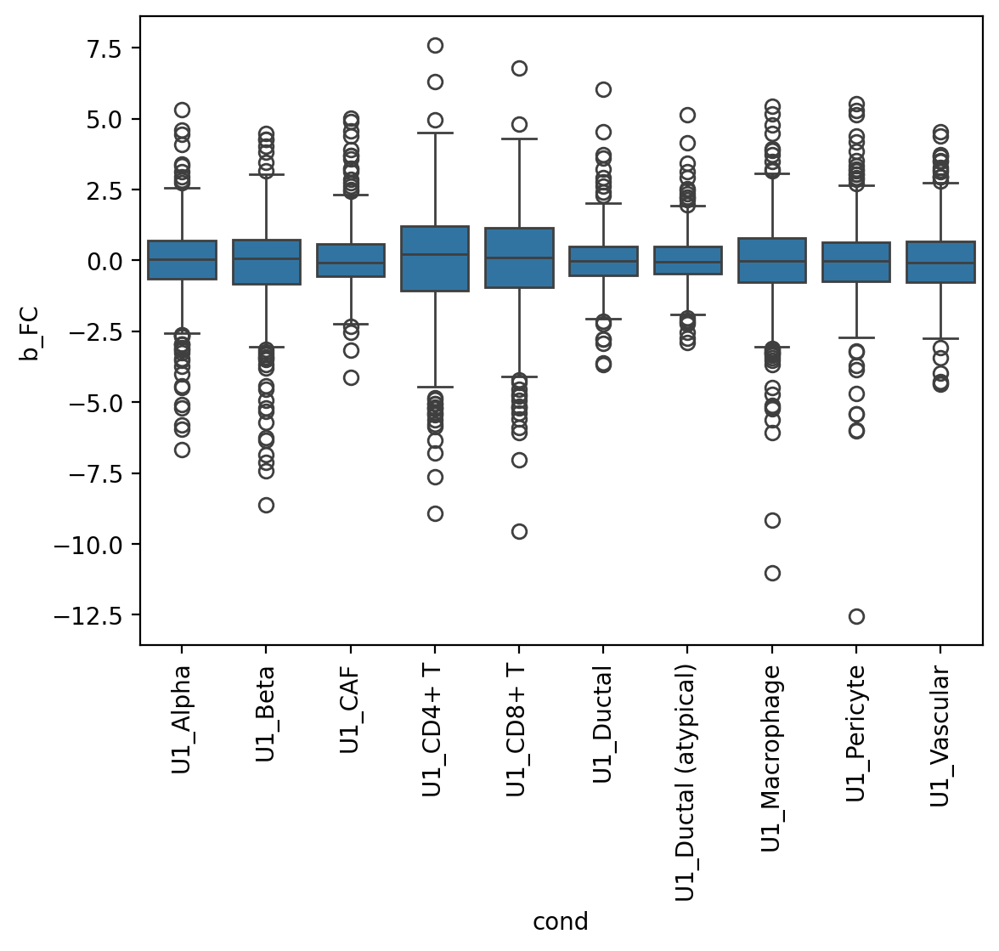

In [414]:
sns.boxplot(x='cond',y='b_FC',data=u1_fcs,)
plt.xticks(rotation=90)

([0, 1, 2, 3, 4, 5, 6, 7, 8, 9],
 [Text(0, 0, 'U1_Alpha'),
  Text(1, 0, 'U1_Beta'),
  Text(2, 0, 'U1_CAF'),
  Text(3, 0, 'U1_CD4+ T'),
  Text(4, 0, 'U1_CD8+ T'),
  Text(5, 0, 'U1_Ductal'),
  Text(6, 0, 'U1_Ductal (atypical)'),
  Text(7, 0, 'U1_Macrophage'),
  Text(8, 0, 'U1_Pericyte'),
  Text(9, 0, 'U1_Vascular')])

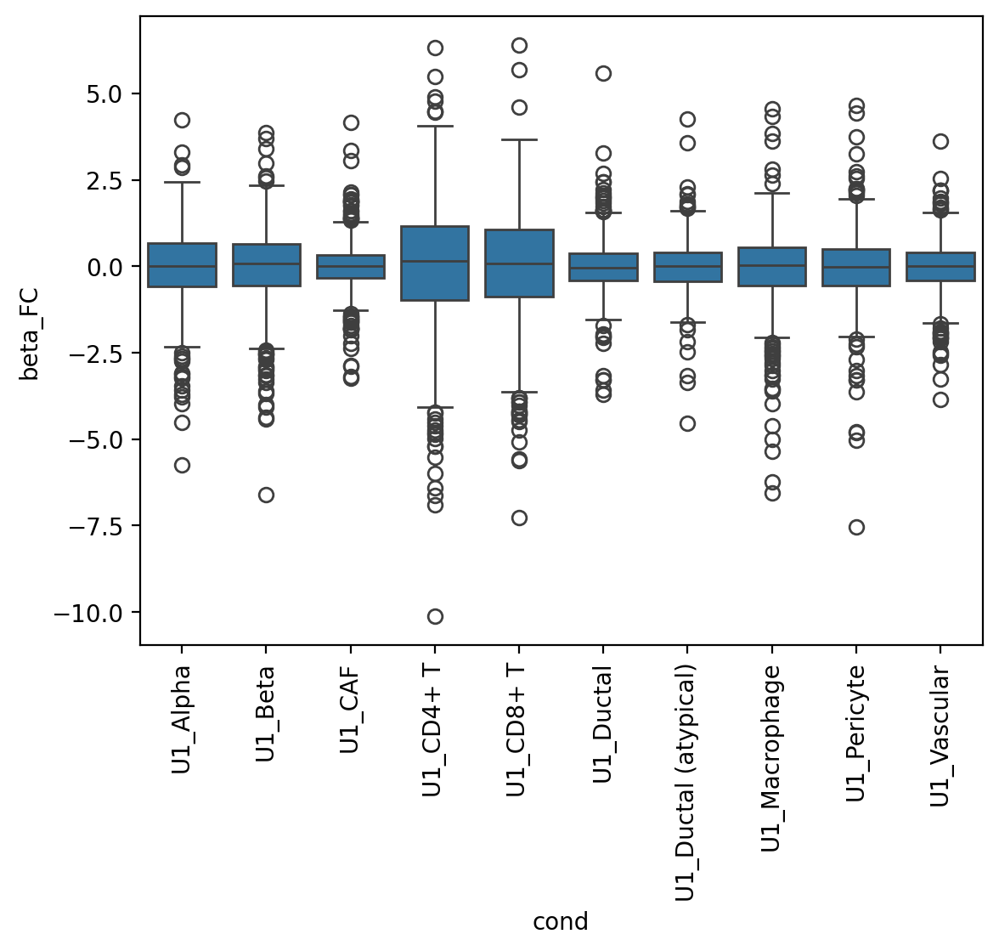

In [415]:
sns.boxplot(x='cond',y='beta_FC',data=u1_fcs,)
plt.xticks(rotation=90)

In [ ]:
#which genes have higher splicing in malignant consistently

(array([121.,  35.,  10.,   2.,   0.,   0.,   0.,   3.,   1.,   2.]),
 array([1. , 1.8, 2.6, 3.4, 4.2, 5. , 5.8, 6.6, 7.4, 8.2, 9. ]),
 <BarContainer object of 10 artists>)

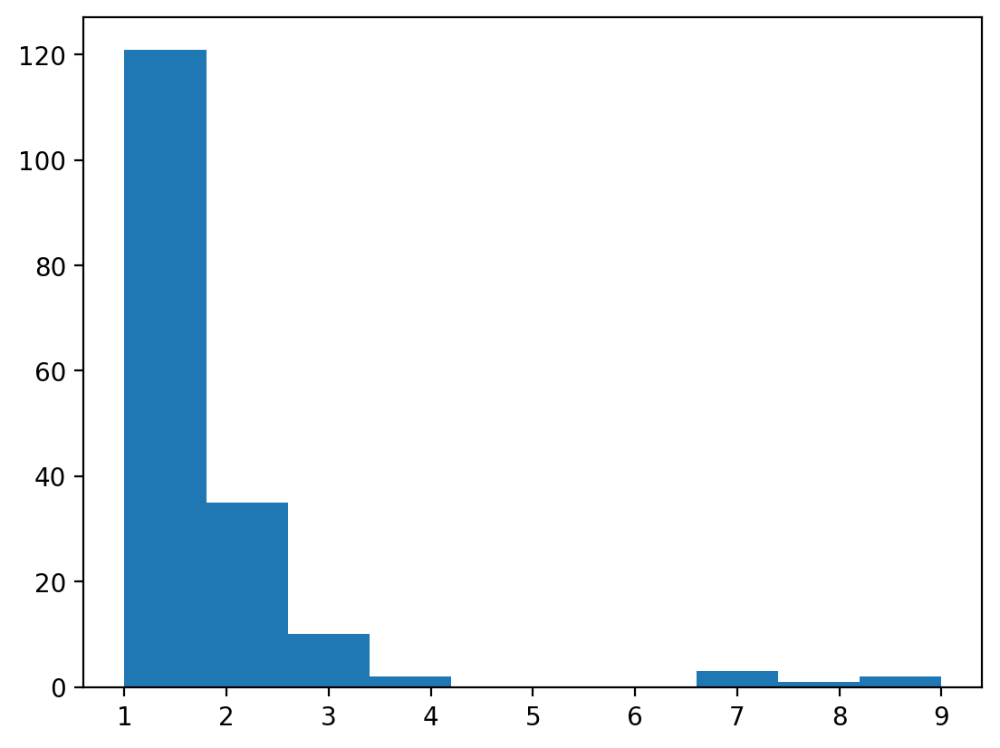

In [416]:
plt.hist(u1_fcs['gene'][u1_fcs['beta_FC'] < -2.0].value_counts())

In [453]:
malig_splice = u1_fcs['gene'][(u1_fcs['b_FC'] < -1.5) & (np.abs(u1_fcs['b_FC']) >np.abs(u1_fcs['beta_FC'])) & (np.abs(u1_fcs['b_FC']) >np.abs(u1_fcs['gamma_FC']))].value_counts() 
malig_gs = list(malig_splice[malig_splice>4].index)

In [454]:
malig_gs

['MALT1',
 'PKM',
 'TANC2',
 'MAP4K4',
 'PTBP3',
 'SLC12A2',
 'RUNX1',
 'DGKH',
 'PALLD',
 'ACACA',
 'ADD3',
 'FLNB',
 'PHKB',
 'FARP1',
 'WNK1']

In [422]:
u1_fcs[u1_fcs.gene.isin(malig_gs)]

,b_FC,beta_FC,gamma_FC,mat_FC,cond,gene
20,-0.088921,-0.356253,-0.448461,-0.506703,U1_Alpha,ZRANB2
55,-1.311978,-2.306326,-2.483807,0.384212,U1_Alpha,ANKRD26
106,-2.563886,-1.471347,-1.794922,-1.584963,U1_Alpha,ETS1
109,-5.213755,-3.972782,-4.168125,-1.855795,U1_Alpha,WNK1
110,-0.479550,-2.666265,-2.451181,1.172785,U1_Alpha,CACNA1C
...,...,...,...,...,...,...
5731,-4.327076,-3.854860,-4.523182,-0.811566,U1_Vascular,CXCL14
5765,1.182114,-1.923706,-1.749691,1.935354,U1_Vascular,SYNE1
5818,-0.819542,-0.219164,-0.252964,-1.488673,U1_Vascular,CDK5RAP2
5821,0.693581,-2.011464,-0.980810,0.821895,U1_Vascular,FNBP1


In [ ]:
# ----> Is noise around splicing greater in malignant cells..(uncertainty)

In [456]:
splice_sigmas = []
cond_sigmas = []

s_sigmas = pd.DataFrame()

for u in U1_inds:
    splice_sigmas += list(sr_arr[u].sigma[U1_bool,1])
    cond_sigmas += [pid_types_lev2[u]]*np.sum(U1_bool)

s_sigmas['sigma'] = splice_sigmas
s_sigmas['cond'] = cond_sigmas
s_sigmas

,sigma,cond
0,0.089288,U1_Alpha
1,0.302513,U1_Alpha
2,0.217059,U1_Alpha
3,0.113395,U1_Alpha
4,0.298875,U1_Alpha
...,...,...
6419,0.103428,U1_Vascular
6420,0.082739,U1_Vascular
6421,0.112810,U1_Vascular
6422,0.131572,U1_Vascular


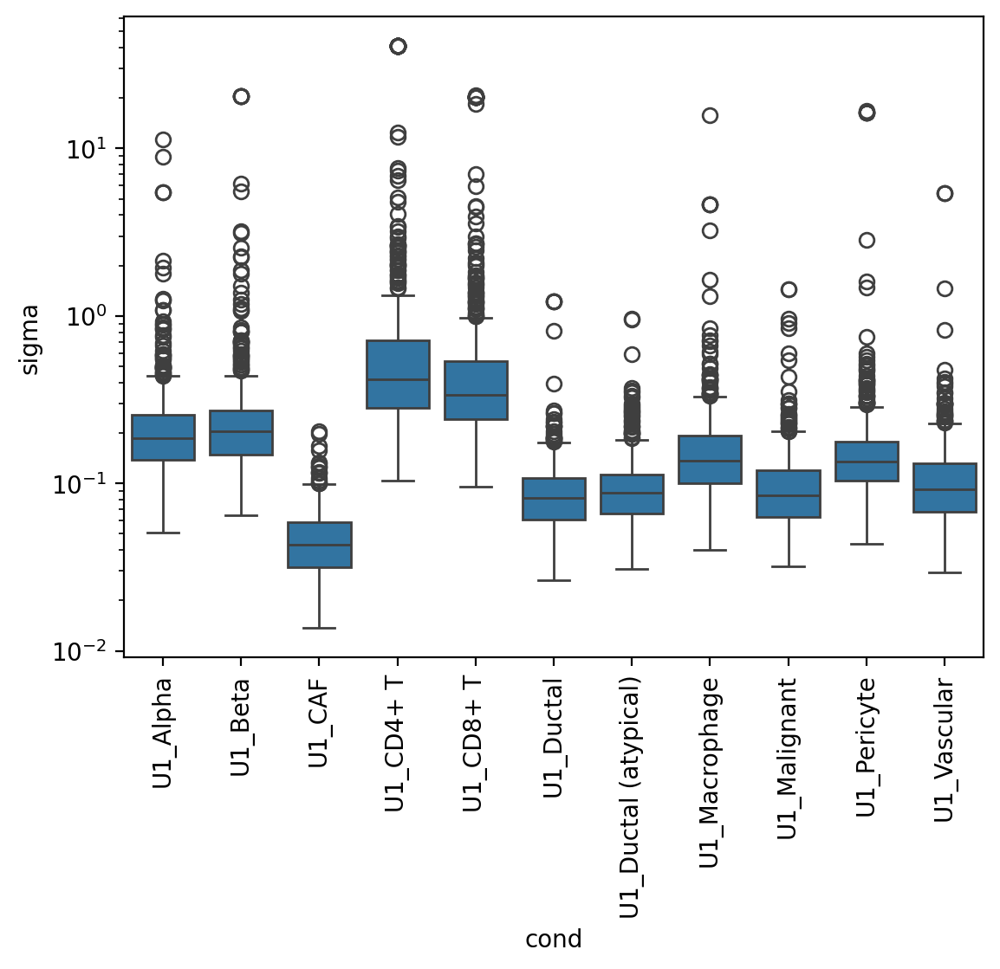

In [460]:
sns.boxplot(x='cond',y='sigma',data=s_sigmas)
plt.xticks(rotation=90)
plt.yscale('log')

In [464]:
splice_intext = []
cond_intext = []

s_intext = pd.DataFrame()

for u in U1_inds:
    splice_intext += list(sr_arr[u].get_noise_decomp()[U1_bool,0,1] + sr_arr[u].get_noise_decomp()[U1_bool,1,1])
    cond_intext += [pid_types_lev2[u]]*np.sum(U1_bool)

s_intext['int+ext'] = splice_intext
s_intext['cond'] = cond_intext
s_intext



,int+ext,cond
0,0.053328,U1_Alpha
1,0.078152,U1_Alpha
2,0.035388,U1_Alpha
3,0.056626,U1_Alpha
4,0.054253,U1_Alpha
...,...,...
6419,0.100998,U1_Vascular
6420,0.110650,U1_Vascular
6421,0.082506,U1_Vascular
6422,0.031444,U1_Vascular


([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10],
 [Text(0, 0, 'U1_Alpha'),
  Text(1, 0, 'U1_Beta'),
  Text(2, 0, 'U1_CAF'),
  Text(3, 0, 'U1_CD4+ T'),
  Text(4, 0, 'U1_CD8+ T'),
  Text(5, 0, 'U1_Ductal'),
  Text(6, 0, 'U1_Ductal (atypical)'),
  Text(7, 0, 'U1_Macrophage'),
  Text(8, 0, 'U1_Malignant'),
  Text(9, 0, 'U1_Pericyte'),
  Text(10, 0, 'U1_Vascular')])

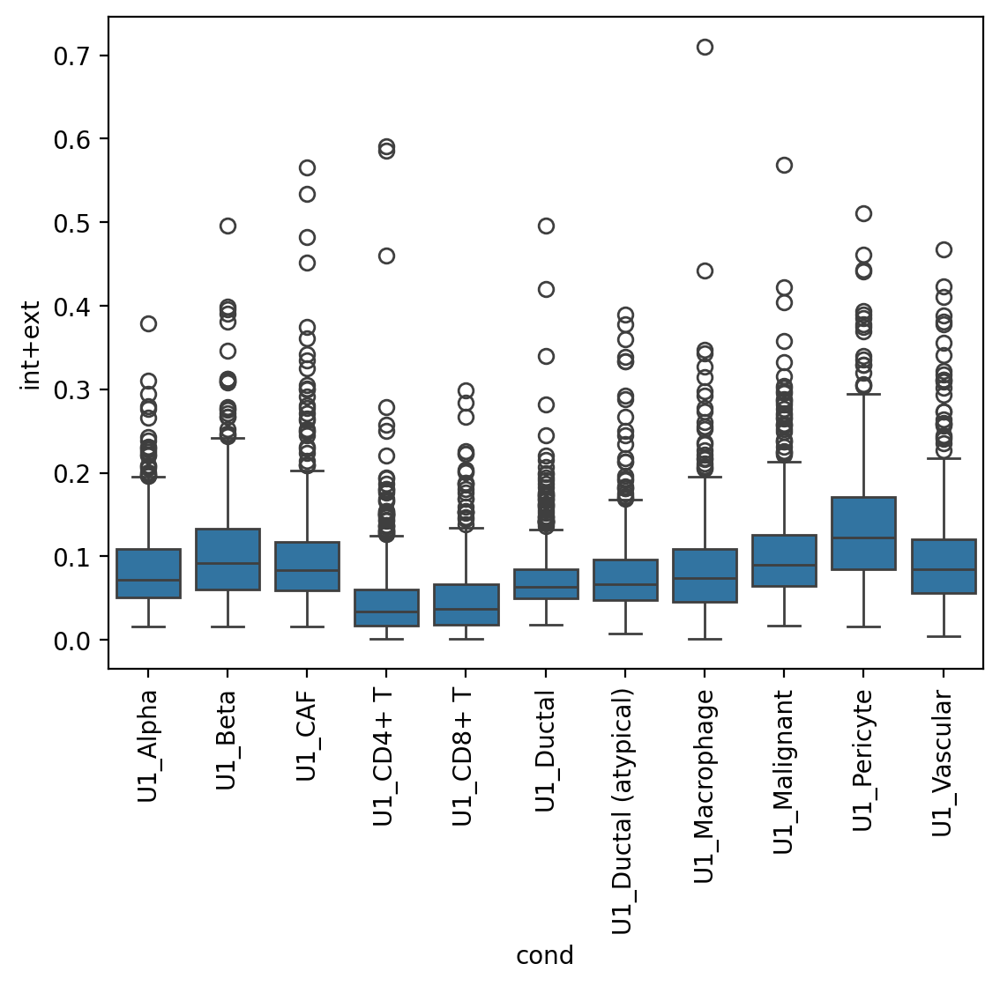

In [465]:
sns.boxplot(x='cond',y='int+ext',data=s_intext)
plt.xticks(rotation=90)

# ----> Bio noise fraction in cell types

In [468]:
#JUST Malignant vs CAF
u1_sub_caf = u1_fcs[u1_fcs.cond.isin(['U1_CAF'])]
u1_sub_caf

,b_FC,beta_FC,gamma_FC,mat_FC,cond,gene
1168,-0.756236,-0.605798,-0.763623,-0.843364,U1_CAF,RERE
1169,1.720208,0.981540,1.006714,-0.194890,U1_CAF,PRDM2
1170,0.903136,0.203005,0.590953,-0.571960,U1_CAF,CAPZB
1171,-0.153627,-0.025342,-0.230595,-0.803834,U1_CAF,EIF4G3
1172,0.427494,0.166637,0.045701,-0.469017,U1_CAF,USP48
...,...,...,...,...,...,...
1747,-0.197981,-0.308357,-0.171125,-0.923265,U1_CAF,JPX
1748,-0.506816,-0.022796,-0.165524,-1.216626,U1_CAF,ATRX
1749,1.566280,0.552694,0.977260,-0.141656,U1_CAF,ACSL4
1750,-0.360709,0.151974,-0.075039,-1.165156,U1_CAF,STAG2


In [469]:
malig_splice_caf = u1_sub_caf['gene'][(u1_sub_caf['beta_FC'] < -2) & (np.abs(u1_sub_caf['gamma_FC']) < 1)].value_counts() 
malig_gs_caf = list(malig_splice_caf.index)

In [470]:
malig_gs_caf 

[]

In [482]:
u1_sub_caf[u1_sub_caf.gene.isin(markers)]

,b_FC,beta_FC,gamma_FC,mat_FC,cond,gene
1529,-0.490786,0.182472,-0.674555,-0.645695,U1_CAF,RUNX1
1556,-1.215627,0.058475,-0.404977,-1.665259,U1_CAF,FOXP1
